                    t    toy      p  Ws1    Wd1     T1  Ws2    Wd2     T2  \
0 1999-01-01 03:00:00  0.125  1.267  4.9  135.0  275.8  4.9  135.0  275.8   
1 1999-01-01 04:00:00  0.167  1.515  5.0  126.9  275.8  5.0  126.9  275.8   
2 1999-01-01 05:00:00  0.208  1.915  5.9  135.7  275.5  5.9  135.7  275.5   
3 1999-01-01 06:00:00  0.250  1.613  5.3  146.6  275.0  5.3  146.6  275.0   
4 1999-01-01 07:00:00  0.292  1.776  6.1  117.4  274.5  5.9  130.2  274.8   

   Ws3    Wd3     T3  
0  4.9  135.0  275.8  
1  5.0  126.9  275.8  
2  5.9  135.7  275.5  
3  5.3  146.6  275.0  
4  5.9  130.2  274.8  

NA rates (top 10):
T3     0.034264
Ws3    0.034264
Wd3    0.034264
Wd2    0.034211
Ws2    0.034211
T2     0.034211
Wd1    0.034158
Ws1    0.034158
T1     0.034158
p      0.009436
dtype: float64

Lag sanity preview:
                    t      p  p_lag1  p_lag2  p_lag3
0 1999-01-01 06:00:00  1.613   1.915   1.515   1.267
1 1999-01-01 07:00:00  1.776   1.613   1.915   1.515
2 1999-01-01 08:00:00  1

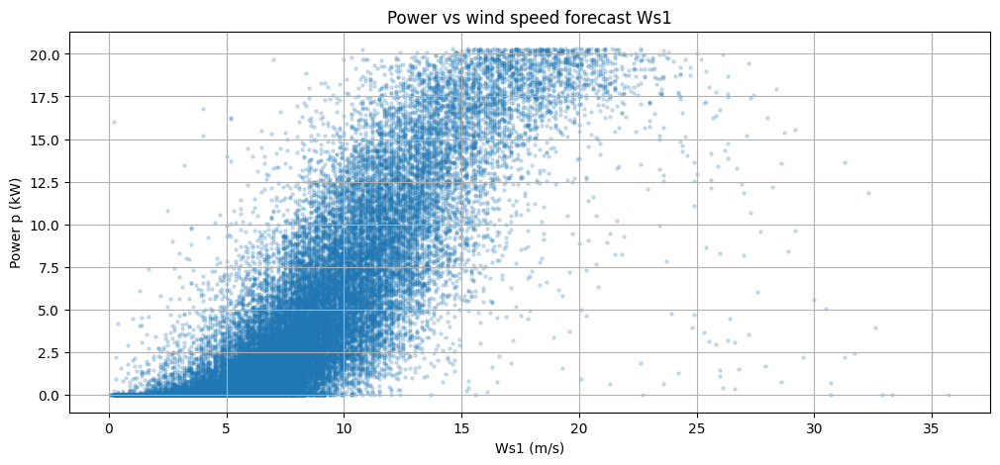

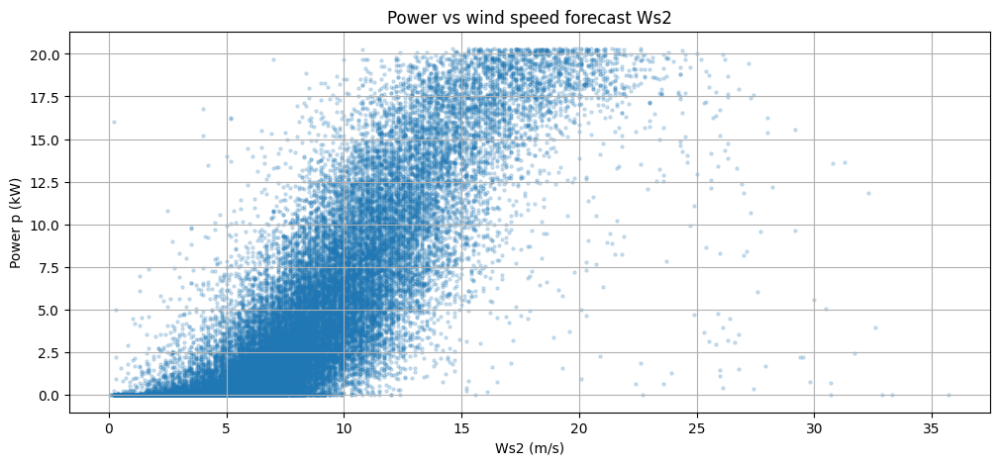

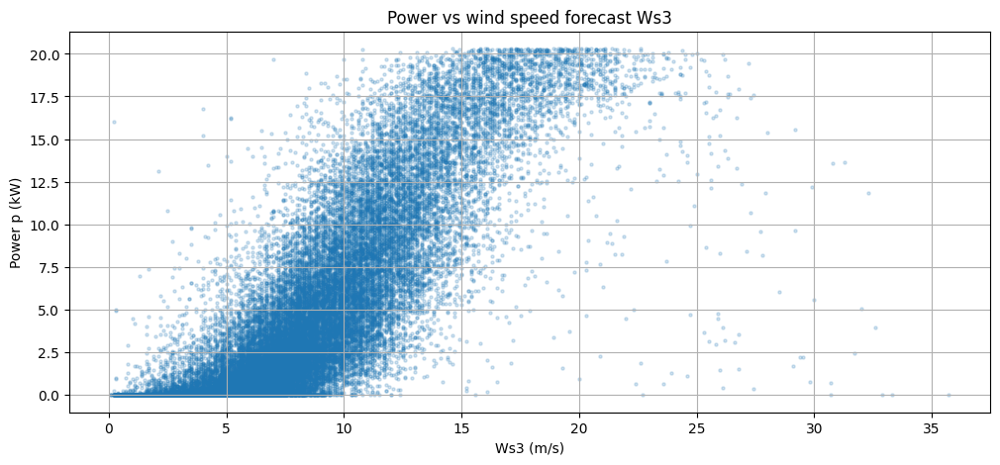

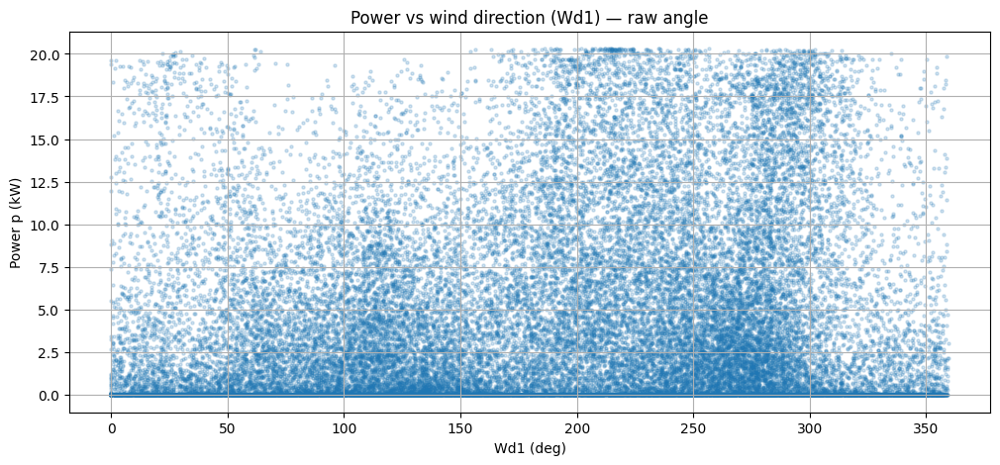

C:\Users\tata\AppData\Local\Temp\ipykernel_4744\1895795292.py:147: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for b, g in tmp.groupby("wd_bin"):
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\1895795292.py:149: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  m = g.groupby(ws_bins)["p"].mean()


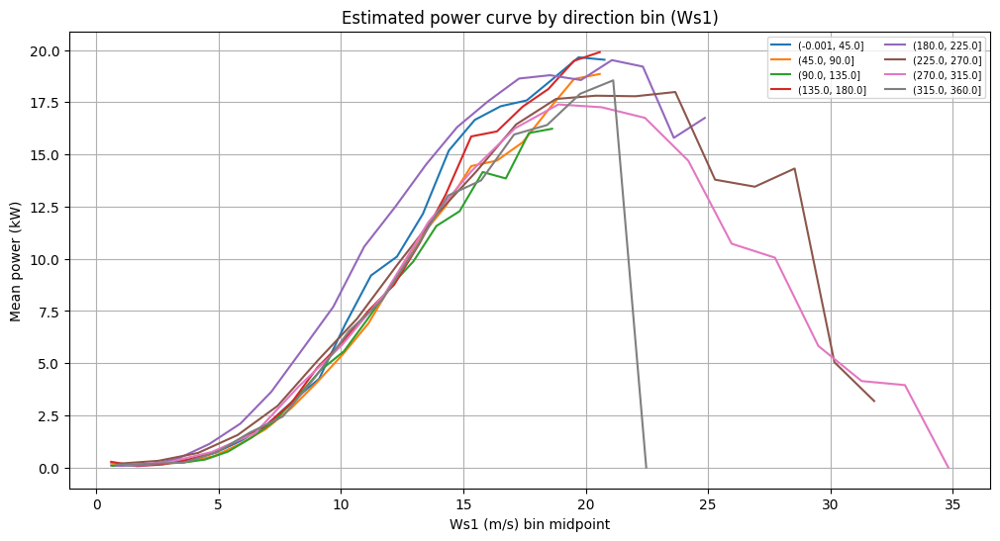

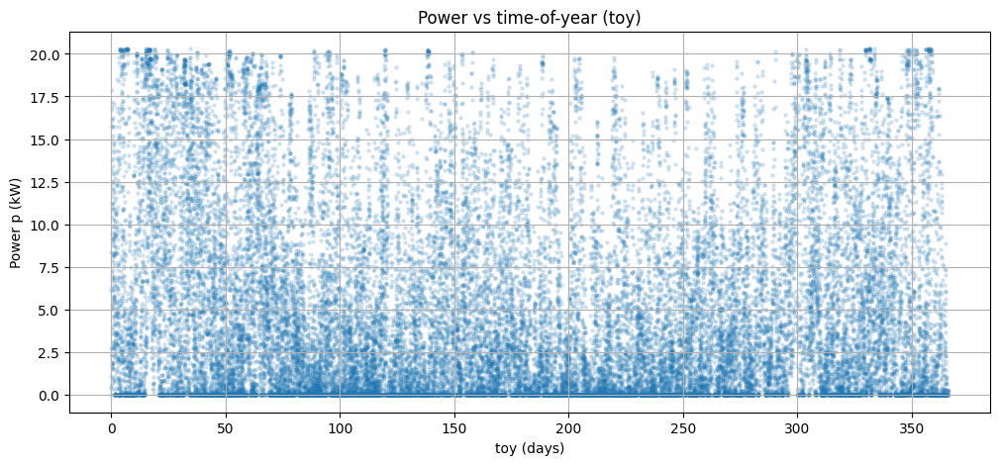

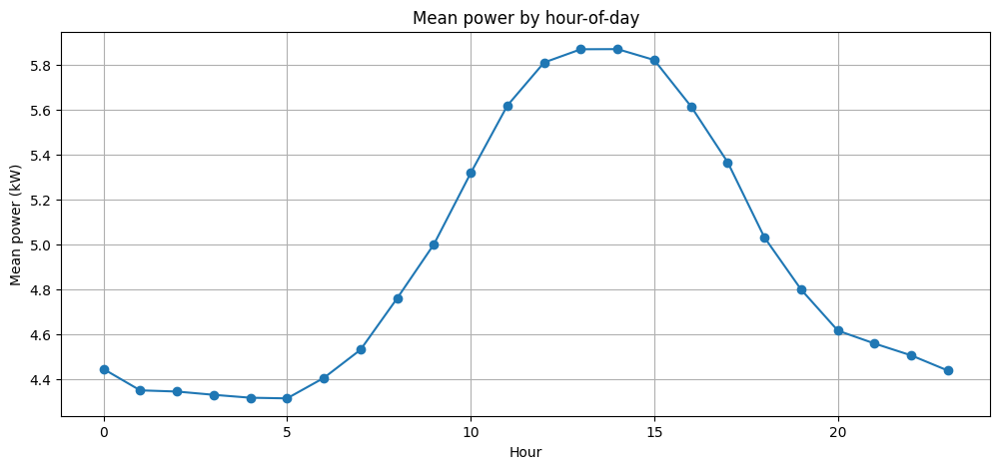

In [1]:
### Cell: Step-by-step full implementation (setup → data → plots → baselines → adaptive RLS → diagnostics → evaluation)

# ============================================================
# 0) Reproducible setup
# ============================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox

from sklearn.metrics import mean_absolute_error, mean_squared_error

np.random.seed(42)
plt.rcParams["figure.figsize"] = (12, 5)
plt.rcParams["axes.grid"] = True

def rmse(y_true, y_pred):
    return float(np.sqrt(mean_squared_error(y_true, y_pred)))

def mae(y_true, y_pred):
    return float(mean_absolute_error(y_true, y_pred))


# ============================================================
# 1) Data loading + basic sanity
# ============================================================
DATA_PATH = r"../data/cex4WindDataInterpolated.csv"  # adjust if needed

df = pd.read_csv(DATA_PATH, parse_dates=["t"])
df = df.sort_values("t").reset_index(drop=True)

expected = ["t", "toy", "p",
            "Ws1","Wd1","T1",
            "Ws2","Wd2","T2",
            "Ws3","Wd3","T3"]
missing = [c for c in expected if c not in df.columns]
if missing:
    print("WARNING: missing columns:", missing)

print(df[expected].head())
print("\nNA rates (top 10):")
print(df[expected].isna().mean().sort_values(ascending=False).head(10))


# ============================================================
# 2) Time features: diurnal + seasonal (annual) + optional weekly
# ============================================================
df["hour"] = df["t"].dt.hour.astype(int)

YEAR = 365.25
df["toy_rad"] = 2 * np.pi * (df["toy"] % YEAR) / YEAR
df["hour_rad"] = 2 * np.pi * df["hour"] / 24.0

# Optional weekly cycle: use time index in hours since start
# (Works even without explicit weekday; keep as optional regressor)
df["time_idx"] = np.arange(len(df))
df["week_rad"] = 2 * np.pi * (df["time_idx"] % (24*7)) / (24*7)

def add_fourier(df_in, rad_col, K, prefix):
    out = df_in.copy()
    for k in range(1, K+1):
        out[f"{prefix}_sin{k}"] = np.sin(k * out[rad_col])
        out[f"{prefix}_cos{k}"] = np.cos(k * out[rad_col])
    return out

df = add_fourier(df, "toy_rad",  K=2, prefix="toy")   # annual seasonality
df = add_fourier(df, "hour_rad", K=2, prefix="hr")    # diurnal
df = add_fourier(df, "week_rad", K=1, prefix="wk")    # weekly (1 harmonic; optional but supported by your experiments)

# Center temperature per horizon (helps stability + interpretability)
for h in [1, 2, 3]:
    df[f"T{h}_c"] = df[f"T{h}"] - df[f"T{h}"].mean()


# ============================================================
# 3) Circular wind direction features per horizon
# ============================================================
def add_dir_features(df_in, wd_col, prefix):
    out = df_in.copy()
    rad = np.deg2rad(out[wd_col] % 360.0)
    out[f"{prefix}_sin"] = np.sin(rad)
    out[f"{prefix}_cos"] = np.cos(rad)
    return out

for h in [1, 2, 3]:
    df = add_dir_features(df, f"Wd{h}", prefix=f"wd{h}")


# ============================================================
# 4) Horizon-correct lag features (availability-correct)
#    For forecasting p_t at horizon h, you may use p_{t-h}.
# ============================================================
for h in [1, 2, 3]:
    df[f"p_lag{h}"] = df["p"].shift(h)

df_model = df.dropna().reset_index(drop=True)
print("\nLag sanity preview:")
print(df_model[["t","p","p_lag1","p_lag2","p_lag3"]].head())


# ============================================================
# 5) Nonlinear wind speed basis: hinge basis (spline-like)
# ============================================================
def hinge_basis(x, knots):
    """
    Columns: [x, max(0, x-k1), max(0, x-k2), ...]
    """
    Xb = [x]
    for k in knots:
        Xb.append(np.maximum(0.0, x - k))
    return np.vstack(Xb).T

# Choose knots from Ws1 quantiles (robust and comparable across horizons)
knots = df_model["Ws1"].quantile([0.1, 0.3, 0.5, 0.7, 0.9]).values
knots = np.unique(np.round(knots, 3))
print("\nWind-speed knots:", knots)


# ============================================================
# 6) Diagnostic plots to infer structure (as required)
# ============================================================
# 6.1 Power curve for each horizon
for h in [1, 2, 3]:
    plt.figure()
    plt.scatter(df_model[f"Ws{h}"], df_model["p"], s=5, alpha=0.2)
    plt.title(f"Power vs wind speed forecast Ws{h}")
    plt.xlabel(f"Ws{h} (m/s)")
    plt.ylabel("Power p (kW)")
    plt.show()

# 6.2 Power vs wind direction (raw) + conditional curve by direction bins (h=1 shown; replicate if desired)
plt.figure()
plt.scatter(df_model["Wd1"], df_model["p"], s=5, alpha=0.2)
plt.title("Power vs wind direction (Wd1) — raw angle")
plt.xlabel("Wd1 (deg)")
plt.ylabel("Power p (kW)")
plt.show()

bins = np.linspace(0, 360, 9)  # 8 bins
tmp = df_model.copy()
tmp["wd_bin"] = pd.cut(tmp["Wd1"] % 360, bins=bins, include_lowest=True)

plt.figure(figsize=(12, 6))
for b, g in tmp.groupby("wd_bin"):
    ws_bins = pd.cut(g["Ws1"], bins=20)
    m = g.groupby(ws_bins)["p"].mean()
    x = [iv.mid for iv in m.index.categories]
    plt.plot(x, m.values, label=str(b))
plt.title("Estimated power curve by direction bin (Ws1)")
plt.xlabel("Ws1 (m/s) bin midpoint")
plt.ylabel("Mean power (kW)")
plt.legend(fontsize=7, ncol=2)
plt.show()

# 6.3 Seasonality / diurnal patterns
plt.figure()
plt.scatter(df_model["toy"], df_model["p"], s=5, alpha=0.15)
plt.title("Power vs time-of-year (toy)")
plt.xlabel("toy (days)")
plt.ylabel("Power p (kW)")
plt.show()

plt.figure()
hour_mean = df_model.groupby("hour")["p"].mean()
plt.plot(hour_mean.index, hour_mean.values, marker="o")
plt.title("Mean power by hour-of-day")
plt.xlabel("Hour")
plt.ylabel("Mean power (kW)")
plt.show()

In [2]:
# ============================================================
# 7) Design matrix builder (per horizon)
#    Includes: AR lag, nonlinear Ws, circular Wd, interactions, temp, seasonal
# ============================================================
def build_design_matrix(df_in, h, knots, include_weekly=True):
    out = df_in.copy()

    # Weather
    ws = out[f"Ws{h}"].astype(float).values
    ws_b = hinge_basis(ws, knots)  # (n, 1+len(knots))

    # Core columns
    cols = {
        "const": np.ones(len(out)),
        f"p_lag{h}": out[f"p_lag{h}"].values,        # horizon-correct persistence
        f"T{h}_c": out[f"T{h}_c"].values,            # centered temperature
        f"wd{h}_sin": out[f"wd{h}_sin"].values,
        f"wd{h}_cos": out[f"wd{h}_cos"].values,
    }

    # Nonlinear Ws (hinges)
    cols[f"ws{h}"] = ws_b[:, 0]
    for i, k in enumerate(knots, start=1):
        cols[f"ws{h}_hinge_{k:g}"] = ws_b[:, i]

    # Interactions: nonlinear(Ws) × sin/cos(direction)
    ws_names = [f"ws{h}"] + [f"ws{h}_hinge_{k:g}" for k in knots]
    for name in ws_names:
        cols[f"{name}_x_sin"] = cols[name] * cols[f"wd{h}_sin"]
        cols[f"{name}_x_cos"] = cols[name] * cols[f"wd{h}_cos"]

    # Seasonal + diurnal
    for k in [1, 2]:
        cols[f"toy_sin{k}"] = out[f"toy_sin{k}"].values
        cols[f"toy_cos{k}"] = out[f"toy_cos{k}"].values
        cols[f"hr_sin{k}"]  = out[f"hr_sin{k}"].values
        cols[f"hr_cos{k}"]  = out[f"hr_cos{k}"].values

    # Weekly (optional, aligns with your ARX experiments)
    if include_weekly:
        cols["wk_sin1"] = out["wk_sin1"].values
        cols["wk_cos1"] = out["wk_cos1"].values

    X = pd.DataFrame(cols, index=out.index)
    y = out["p"].values.astype(float)
    return X, y

In [3]:
# ============================================================
# 8) Time-series split + (optional) walk-forward backtest scaffolding
# ============================================================
def train_test_split_time(df_in, train_frac=0.7):
    n = len(df_in)
    cut = int(n * train_frac)
    return df_in.iloc[:cut].copy(), df_in.iloc[cut:].copy()

train_df, test_df = train_test_split_time(df_model, train_frac=0.7)
print("\nTrain period:", train_df["t"].min(), "→", train_df["t"].max())
print("Test  period:", test_df["t"].min(),  "→", test_df["t"].max())


# ============================================================
# 9) Baselines: persistence + simple linear ARX (OLS)
# ============================================================
baseline_rows = []

for h in [1, 2, 3]:
    y_true = test_df["p"].values
    y_persist = test_df[f"p_lag{h}"].values

    baseline_rows.append({
        "h": h, "model": "Persistence p(t-h)",
        "MAE": mae(y_true, y_persist),
        "RMSE": rmse(y_true, y_persist)
    })

# Simple ARX OLS baseline: linear Ws + sin/cos Wd + T + seasonal + AR
def build_linear_arx(df_in, h, include_weekly=True):
    cols = ["p_lag"+str(h), f"Ws{h}", f"T{h}_c", f"wd{h}_sin", f"wd{h}_cos",
            "toy_sin1","toy_cos1","toy_sin2","toy_cos2",
            "hr_sin1","hr_cos1","hr_sin2","hr_cos2"]
    if include_weekly:
        cols += ["wk_sin1","wk_cos1"]
    X = df_in[cols].copy()
    X = sm.add_constant(X, has_constant="add")
    y = df_in["p"].values.astype(float)
    return X, y

for h in [1, 2, 3]:
    Xtr, ytr = build_linear_arx(train_df, h, include_weekly=True)
    Xte, yte = build_linear_arx(test_df,  h, include_weekly=True)
    m = sm.OLS(ytr, Xtr).fit()
    pred = m.predict(Xte)

    baseline_rows.append({
        "h": h, "model": "Linear ARX OLS (seasonal+diurnal+weekly)",
        "MAE": mae(yte, pred),
        "RMSE": rmse(yte, pred)
    })

baseline_table = pd.DataFrame(baseline_rows)
baseline_table


Train period: 1999-01-01 06:00:00 → 2002-01-24 00:00:00
Test  period: 2002-01-24 01:00:00 → 2003-04-30 23:00:00


,h,model,MAE,RMSE
0,1,Persistence p(t-h),1.009048,1.640251
1,2,Persistence p(t-h),1.541062,2.474538
2,3,Persistence p(t-h),1.932475,3.064863
3,1,Linear ARX OLS (seasonal+diurnal+weekly),1.017522,1.549505
4,2,Linear ARX OLS (seasonal+diurnal+weekly),1.479382,2.139964
5,3,Linear ARX OLS (seasonal+diurnal+weekly),1.724431,2.411313


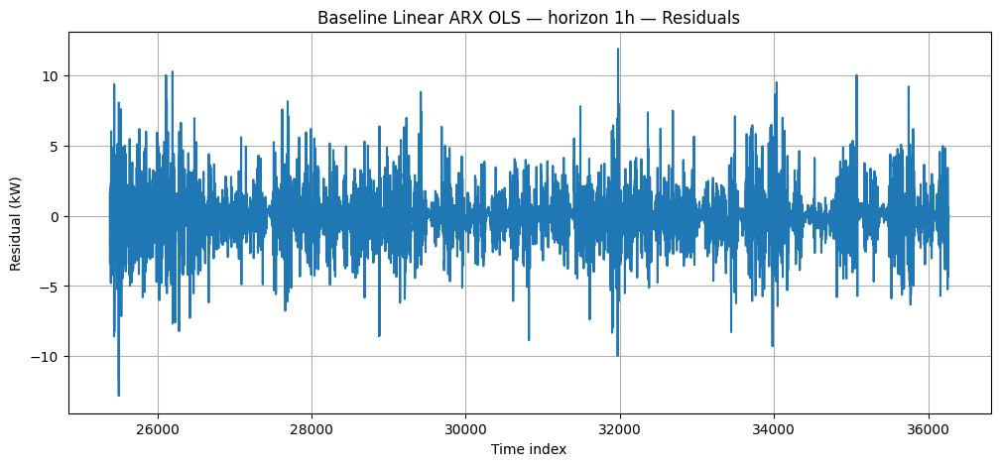

<Figure size 1200x500 with 0 Axes>

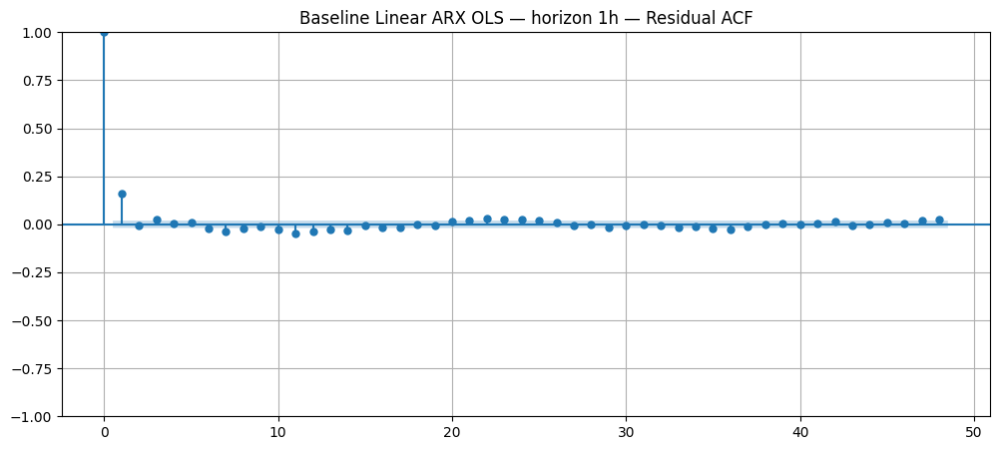

<Figure size 1200x500 with 0 Axes>

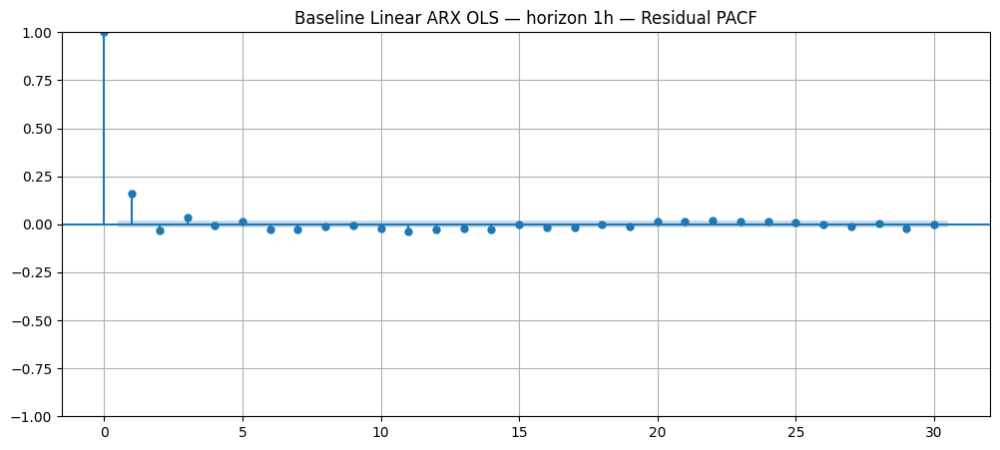

Baseline Linear ARX OLS — horizon 1h — Ljung–Box p-values:


,lb_stat,lb_pvalue
12,367.968357,2.255831e-71
24,427.439793,1.708444e-75
48,473.648493,2.466022e-71


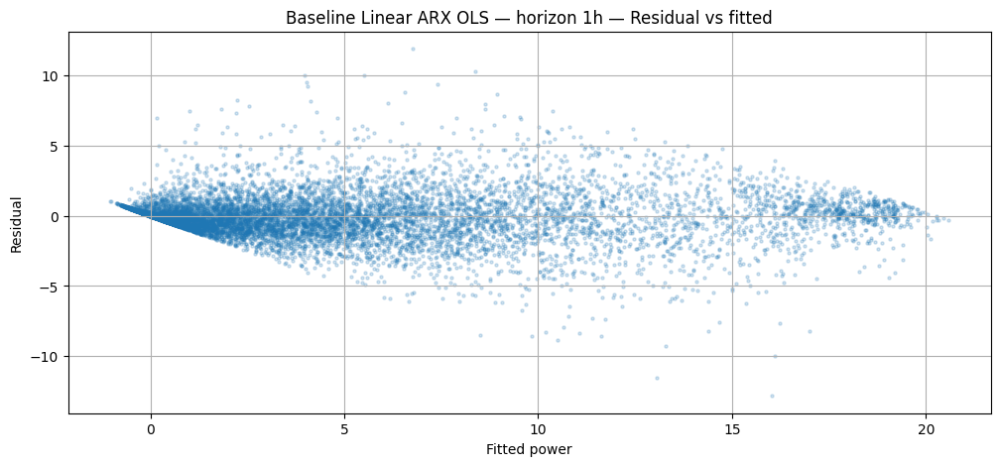

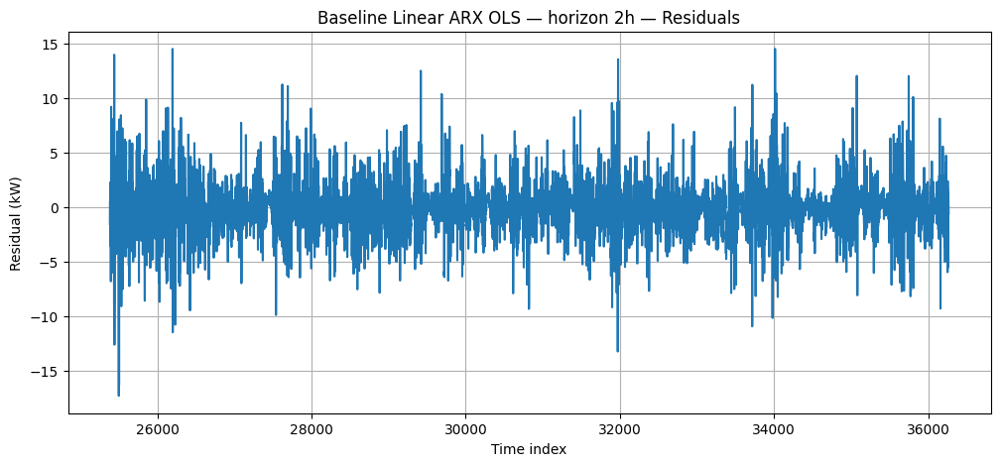

<Figure size 1200x500 with 0 Axes>

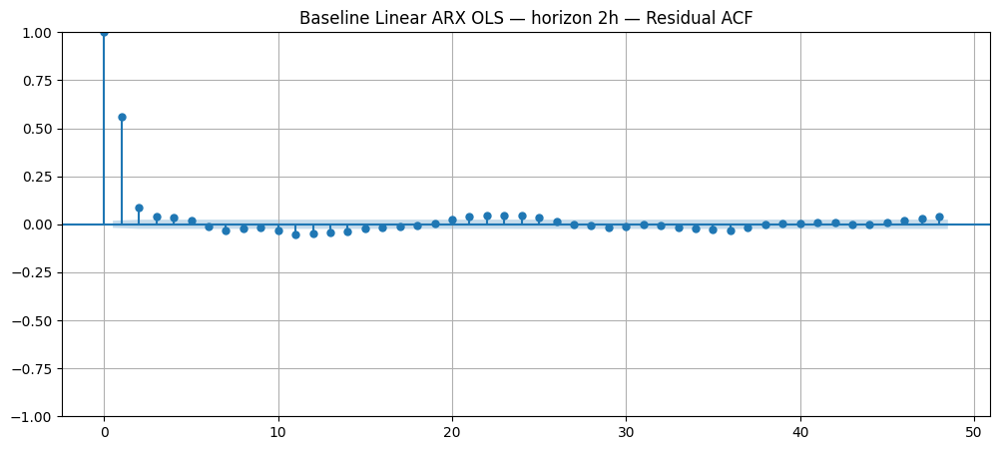

<Figure size 1200x500 with 0 Axes>

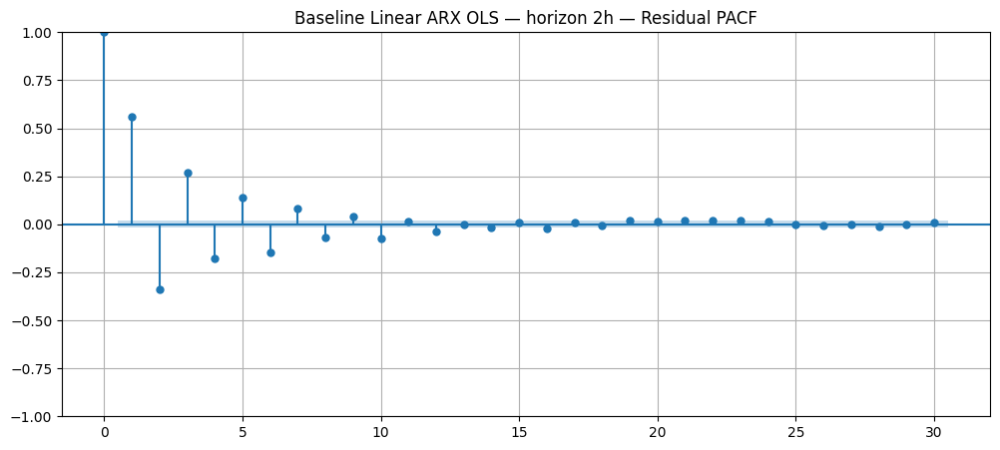

Baseline Linear ARX OLS — horizon 2h — Ljung–Box p-values:


,lb_stat,lb_pvalue
12,3645.889260,0.0
24,3782.644842,0.0
48,3871.487421,0.0


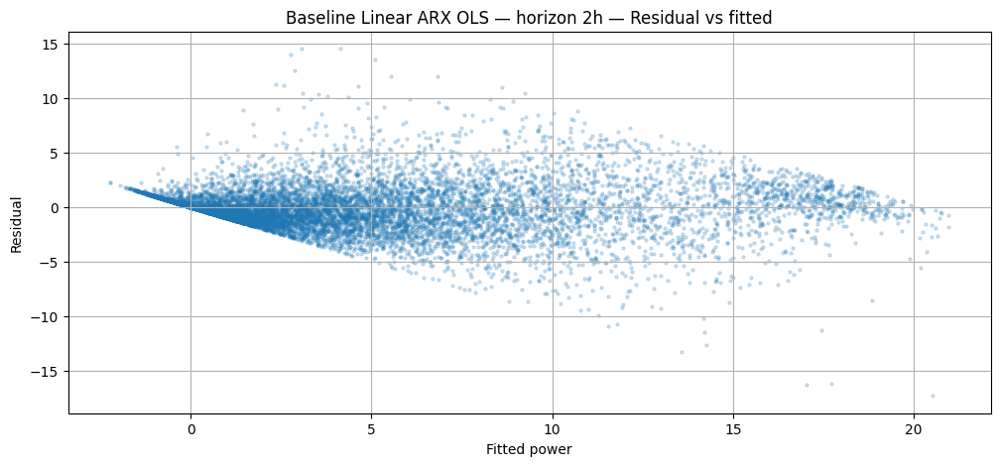

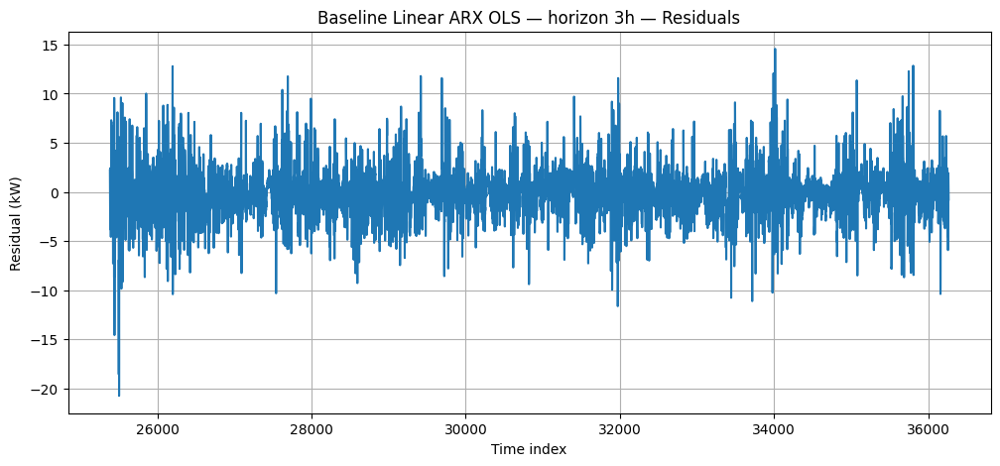

<Figure size 1200x500 with 0 Axes>

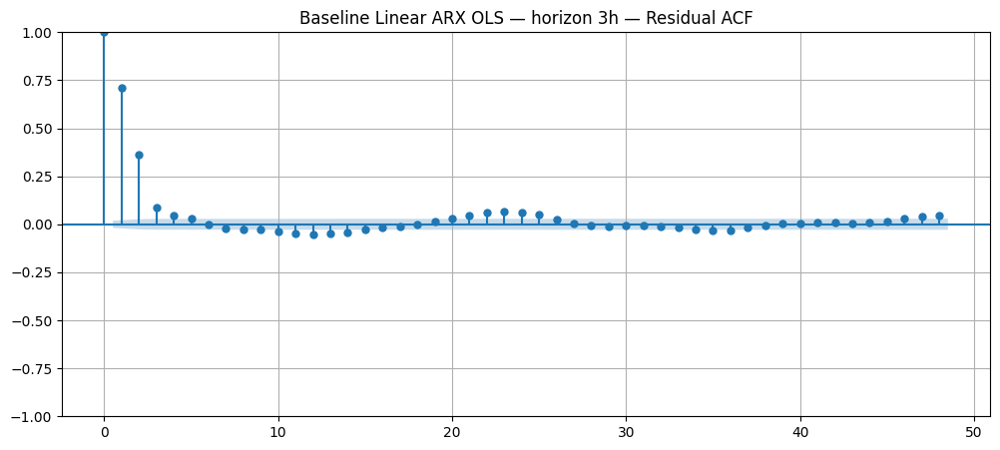

<Figure size 1200x500 with 0 Axes>

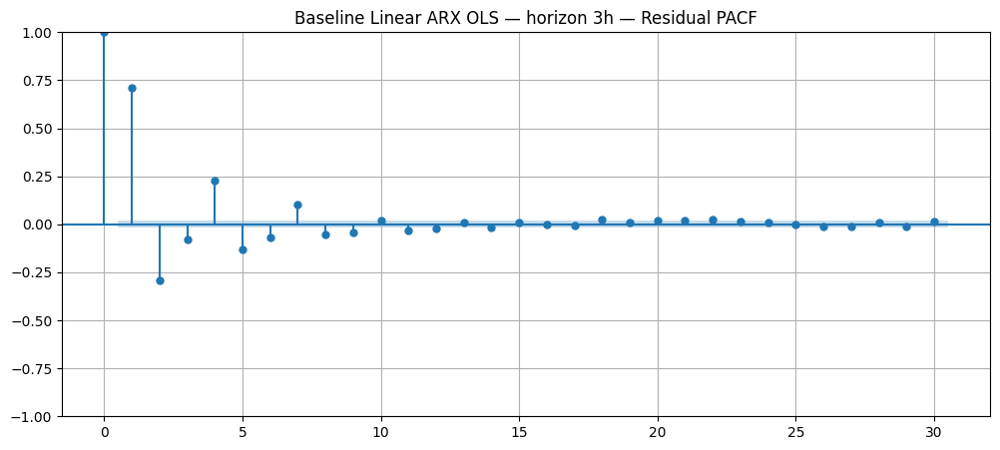

Baseline Linear ARX OLS — horizon 3h — Ljung–Box p-values:


,lb_stat,lb_pvalue
12,7127.912083,0.0
24,7353.345646,0.0
48,7486.390303,0.0


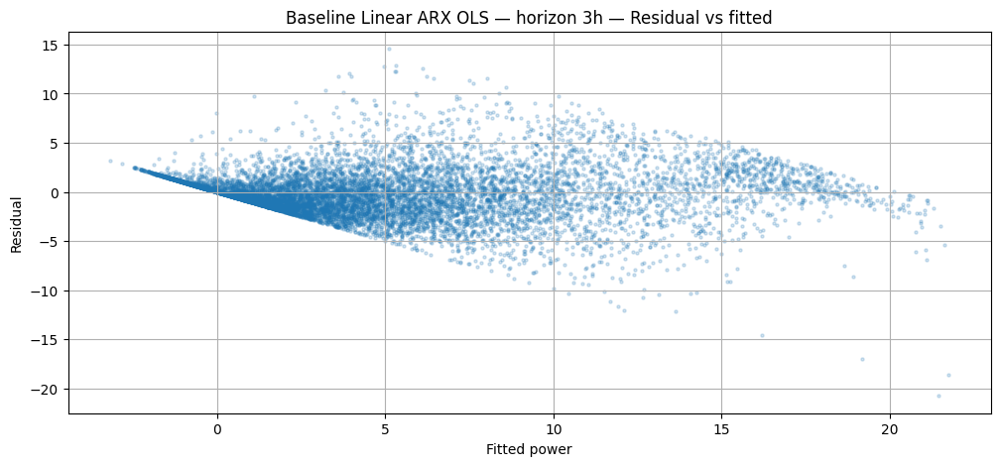

In [4]:
# ============================================================
# 10) Residual ACF/PACF helper (required)
# ============================================================
def residual_diagnostics(y_true, y_pred, title_prefix="", lags=48):
    resid = y_true - y_pred

    plt.figure()
    plt.plot(resid)
    plt.title(f"{title_prefix} — Residuals")
    plt.xlabel("Time index")
    plt.ylabel("Residual (kW)")
    plt.show()

    plt.figure()
    plot_acf(resid, lags=lags)
    plt.title(f"{title_prefix} — Residual ACF")
    plt.show()

    plt.figure()
    plot_pacf(resid, lags=min(lags, 30))
    plt.title(f"{title_prefix} — Residual PACF")
    plt.show()

    lb = acorr_ljungbox(resid, lags=[12, 24, 48], return_df=True)
    print(f"{title_prefix} — Ljung–Box p-values:")
    display(lb)

    # Residual vs wind speed (heteroskedasticity cue)
    plt.figure()
    plt.scatter(y_pred, resid, s=5, alpha=0.2)
    plt.title(f"{title_prefix} — Residual vs fitted")
    plt.xlabel("Fitted power")
    plt.ylabel("Residual")
    plt.show()

    return resid

# Run residual diagnostics on baselines (example: linear ARX OLS)
for h in [1, 2, 3]:
    Xtr, ytr = build_linear_arx(train_df, h, include_weekly=True)
    Xte, yte = build_linear_arx(test_df,  h, include_weekly=True)
    m = sm.OLS(ytr, Xtr).fit()
    pred = m.predict(Xte)
    _ = residual_diagnostics(yte, pred, title_prefix=f"Baseline Linear ARX OLS — horizon {h}h", lags=48)



In [5]:
# ============================================================
# 11) Adaptive model: Recursive Least Squares (RLS) with forgetting
# ============================================================
def rls_forgetting_fit_predict(X_train, y_train, X_test, y_test, lam=0.995, delta=1e4):
    """
    RLS with exponential forgetting:
      theta_t = theta_{t-1} + K_t (y_t - x_t' theta_{t-1})
      P_t = (P_{t-1} - K_t x_t' P_{t-1}) / lam
      K_t = P_{t-1} x_t / (lam + x_t' P_{t-1} x_t)

    Returns:
      pred_test: predictions on test
      theta_trace: coefficients over test (for parameter traces)
      resid_test: test residuals
    """
    n_params = X_train.shape[1]
    I = np.eye(n_params)

    theta = np.zeros(n_params)
    P = delta * I

    # Burn-in on training data
    for t in range(len(X_train)):
        x = X_train.iloc[t].values.reshape(-1, 1)
        y = float(y_train[t])

        denom = lam + float(x.T @ P @ x)
        K = (P @ x) / denom
        err = y - float(theta.reshape(1, -1) @ x)

        theta = theta + (K.flatten() * err)
        P = (P - K @ x.T @ P) / lam

    # Online predict-update on test
    preds = np.zeros(len(X_test))
    theta_trace = np.zeros((len(X_test), n_params))

    for t in range(len(X_test)):
        x = X_test.iloc[t].values.reshape(-1, 1)
        y = float(y_test[t])

        preds[t] = float(theta.reshape(1, -1) @ x)
        theta_trace[t] = theta

        denom = lam + float(x.T @ P @ x)
        K = (P @ x) / denom
        err = y - preds[t]

        theta = theta + (K.flatten() * err)
        P = (P - K @ x.T @ P) / lam

    resid = y_test - preds
    return preds, theta_trace, resid

C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  denom = lam + float(x.T @ P @ x)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  err = y - float(theta.reshape(1, -1) @ x)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:42: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  preds[t] = float(theta.reshape(1, -1) @ x)
C:\Users\tata\A

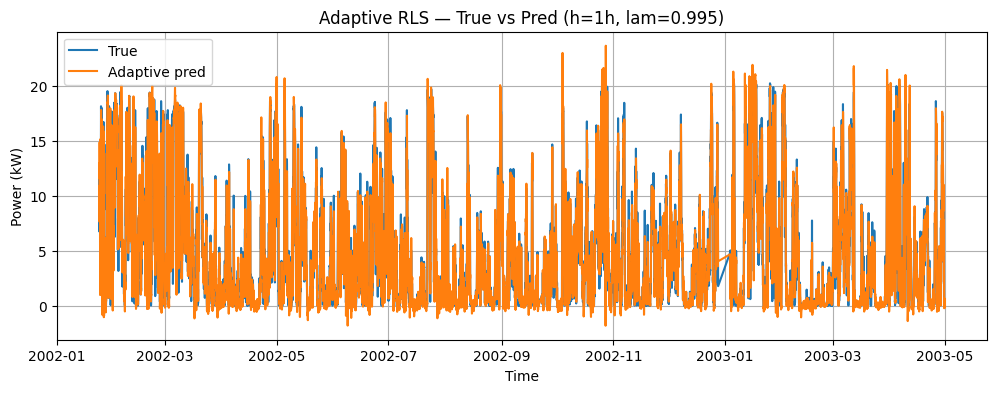

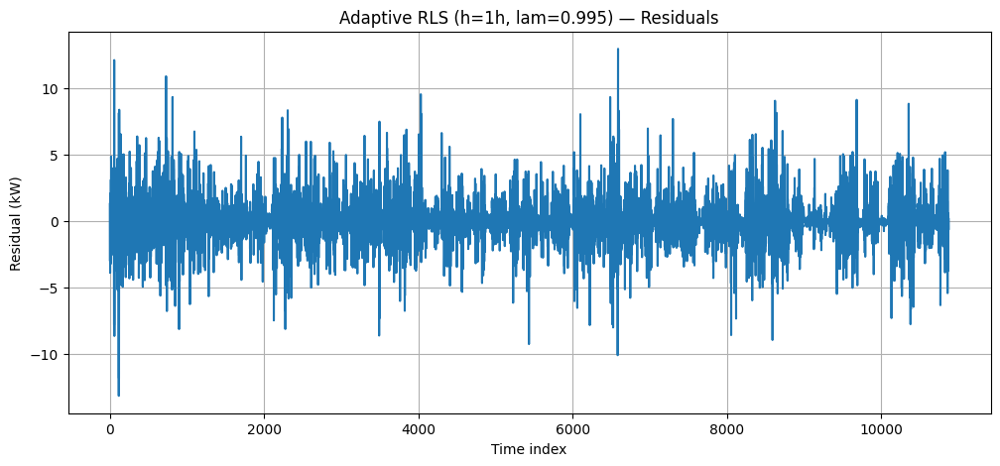

<Figure size 1200x500 with 0 Axes>

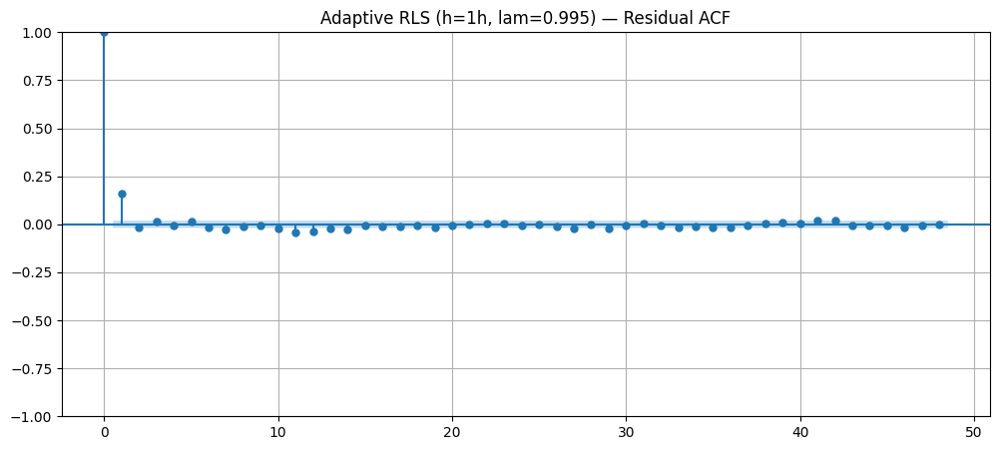

<Figure size 1200x500 with 0 Axes>

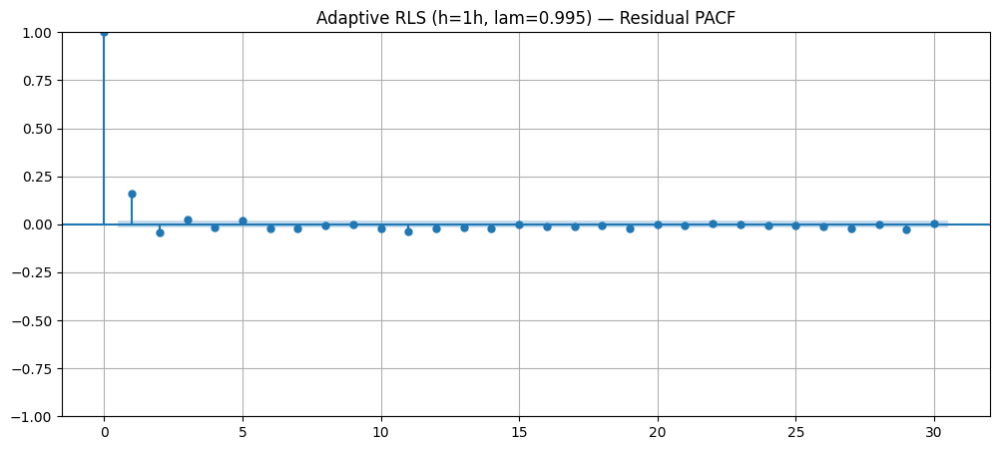

Adaptive RLS (h=1h, lam=0.995) — Ljung–Box p-values:


,lb_stat,lb_pvalue
12,347.726957,4.231640e-67
24,371.732252,4.631849e-64
48,413.142613,1.486995e-59


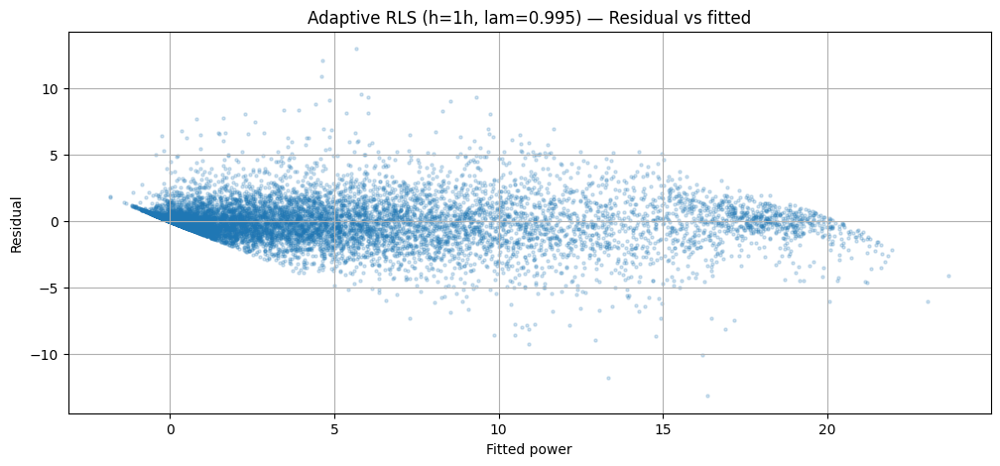

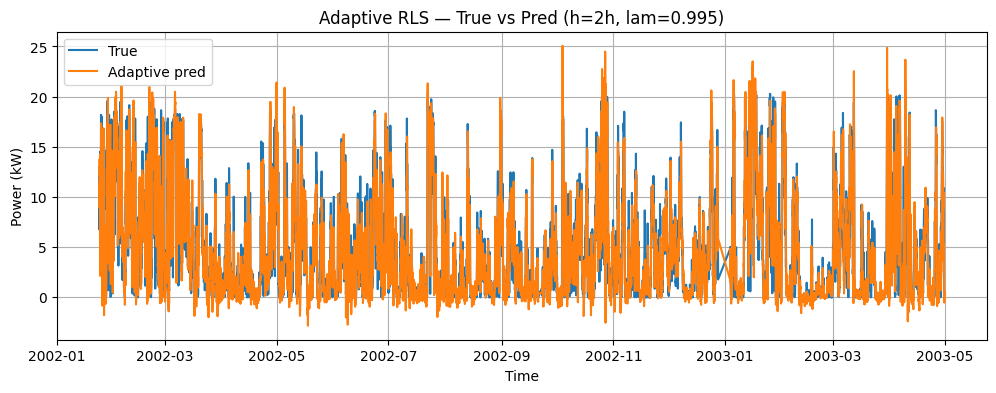

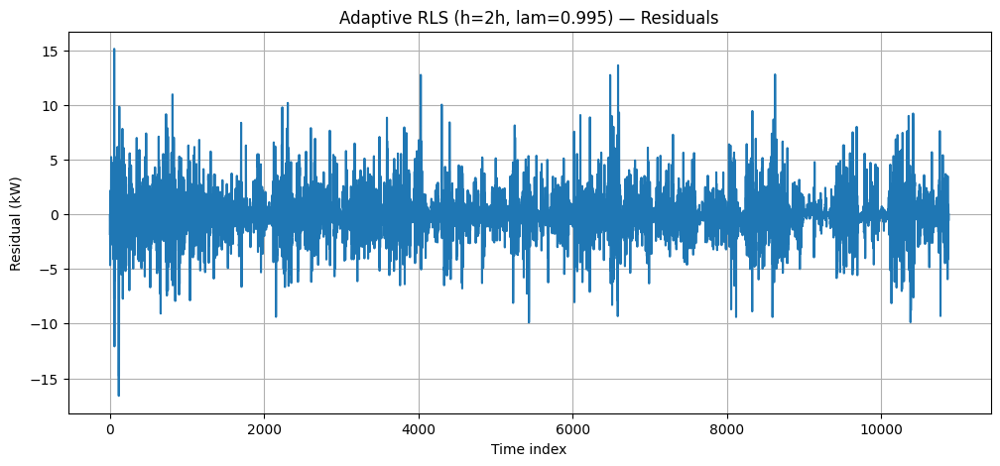

<Figure size 1200x500 with 0 Axes>

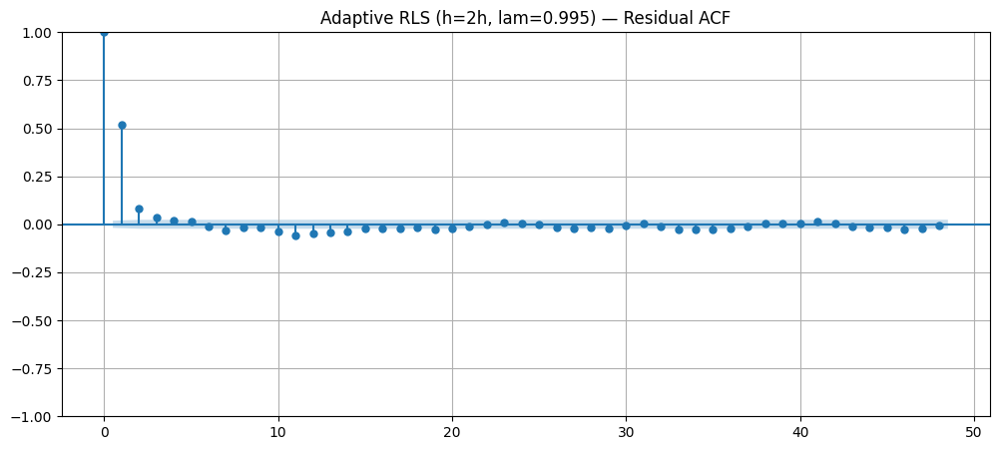

<Figure size 1200x500 with 0 Axes>

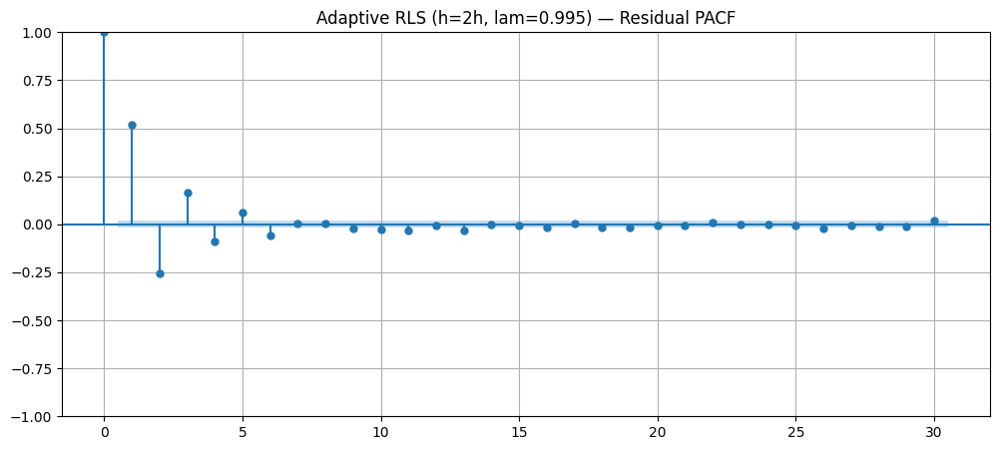

Adaptive RLS (h=2h, lam=0.995) — Ljung–Box p-values:


,lb_stat,lb_pvalue
12,3129.192373,0.0
24,3201.030668,0.0
48,3272.766165,0.0


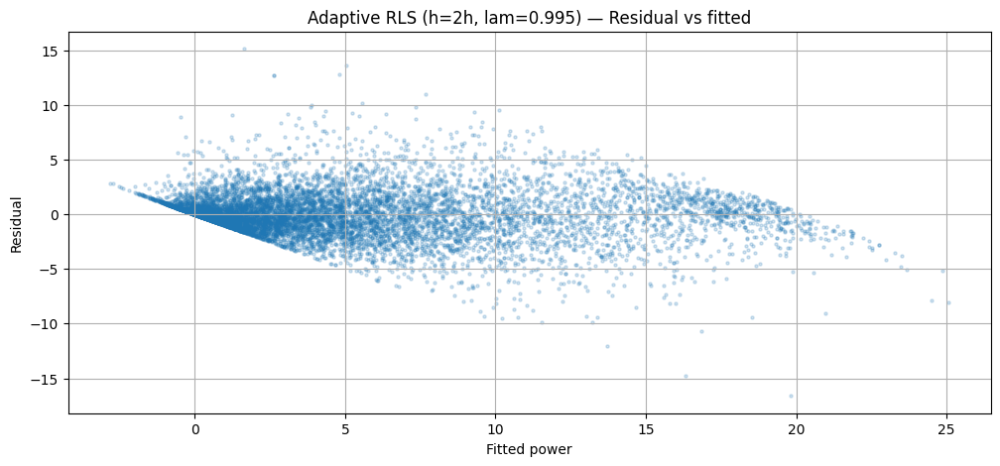

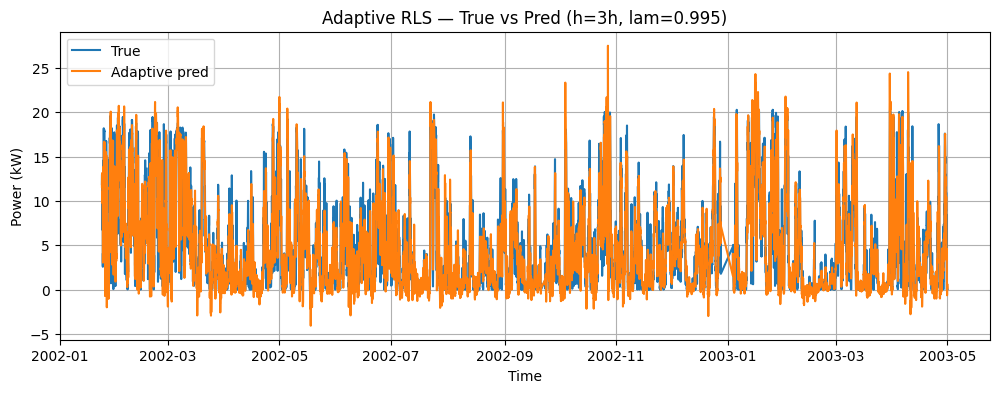

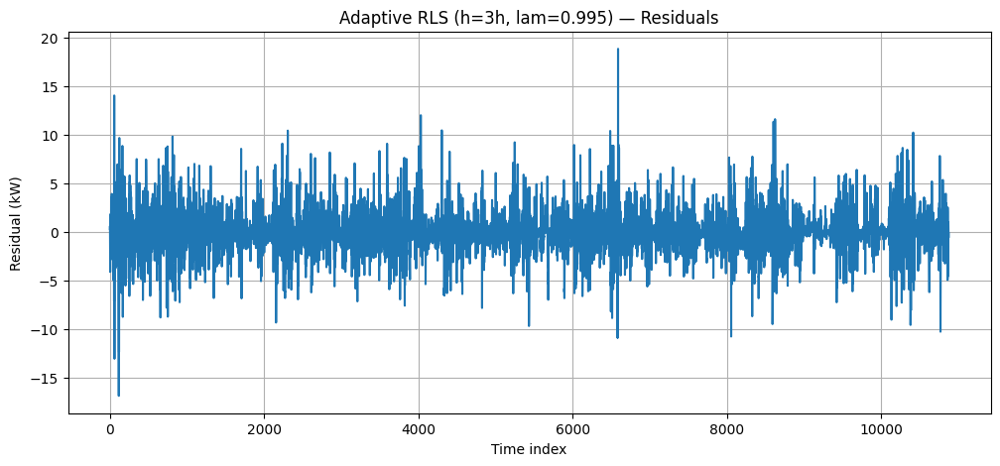

<Figure size 1200x500 with 0 Axes>

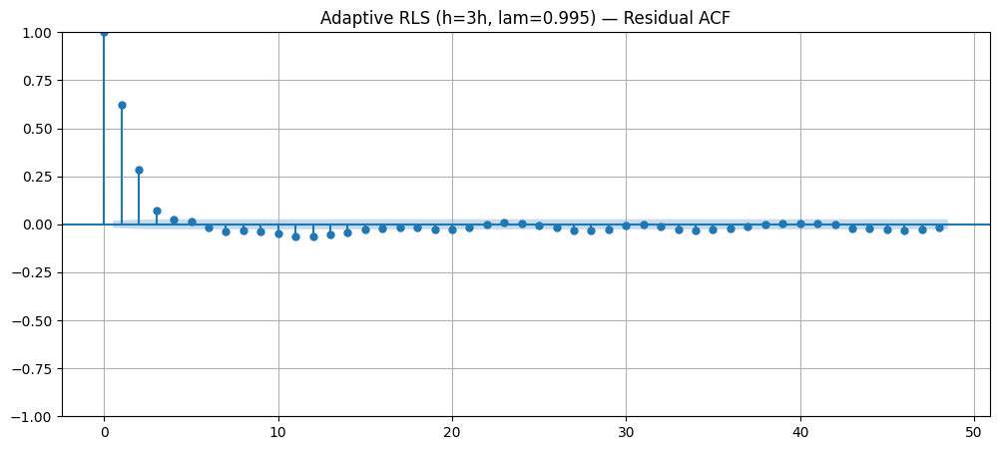

<Figure size 1200x500 with 0 Axes>

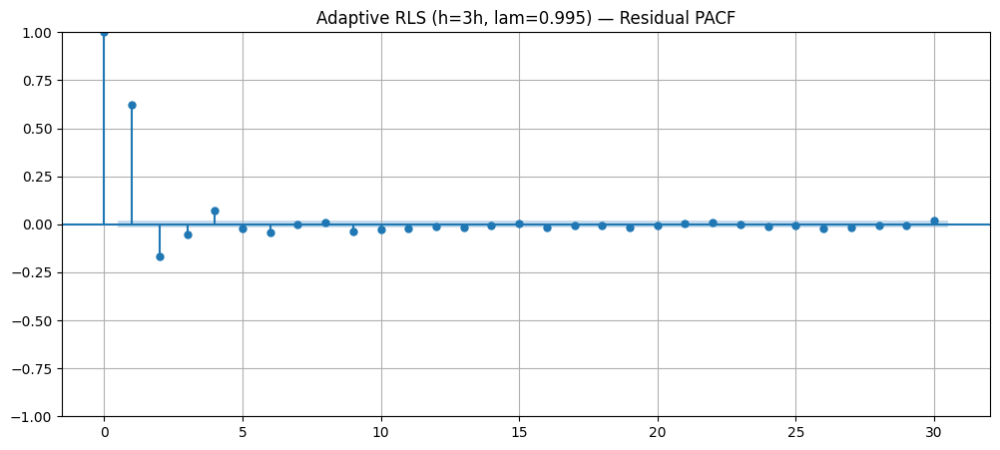

Adaptive RLS (h=3h, lam=0.995) — Ljung–Box p-values:


,lb_stat,lb_pvalue
12,5287.701009,0.0
24,5379.517946,0.0
48,5486.505145,0.0


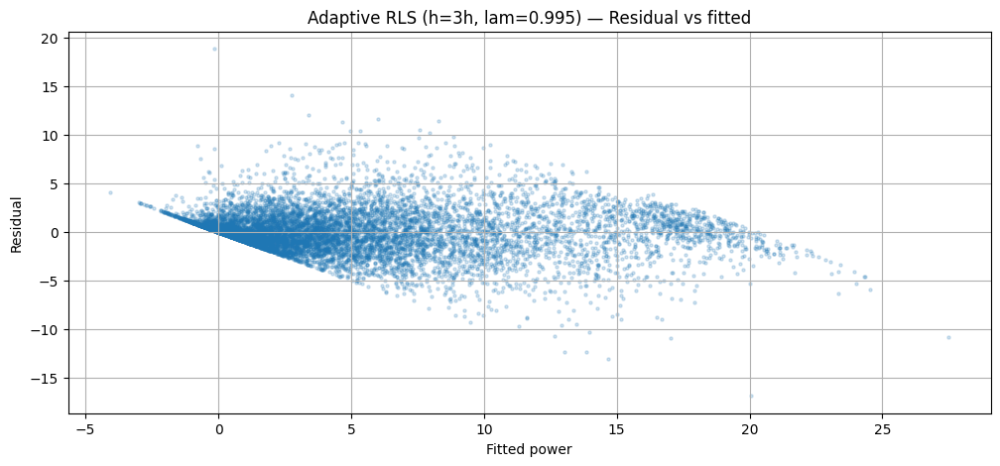

In [6]:
# ============================================================
# 12) Fit adaptive model for h=1,2,3 + evaluate + parameter traces
# ============================================================
adaptive_rows = []
adaptive_traces = {}   # store (colnames, trace, test_time_index, predictions, residuals)

LAMBDA = 0.995  # tune: 0.999 smoother; 0.99 faster adaptation/noisier

for h in [1, 2, 3]:
    Xtr, ytr = build_design_matrix(train_df, h, knots, include_weekly=True)
    Xte, yte = build_design_matrix(test_df,  h, knots, include_weekly=True)

    pred, trace, resid = rls_forgetting_fit_predict(Xtr, ytr, Xte, yte, lam=LAMBDA, delta=1e4)

    adaptive_traces[h] = {
        "names": Xte.columns.tolist(),
        "trace": trace,
        "t": test_df["t"].values,
        "pred": pred,
        "y": yte,
        "resid": resid,
    }

    # persistence baseline for skill
    y_persist = test_df[f"p_lag{h}"].values
    rmse_p = rmse(yte, y_persist)
    rmse_a = rmse(yte, pred)

    adaptive_rows.append({
        "h": h,
        "model": f"Adaptive RLS (lam={LAMBDA})",
        "MAE": mae(yte, pred),
        "RMSE": rmse_a,
        "Skill_vs_persistence_(1-RMSE/RMSE_persist)": 1.0 - (rmse_a / rmse_p)
    })

adaptive_table = pd.DataFrame(adaptive_rows)
adaptive_table


# ============================================================
# 13) Plot predictions + residual diagnostics for adaptive model
# ============================================================
for h in [1, 2, 3]:
    pack = adaptive_traces[h]
    t = pack["t"]
    y = pack["y"]
    pred = pack["pred"]

    plt.figure(figsize=(12, 4))
    plt.plot(t, y, label="True")
    plt.plot(t, pred, label="Adaptive pred")
    plt.title(f"Adaptive RLS — True vs Pred (h={h}h, lam={LAMBDA})")
    plt.xlabel("Time")
    plt.ylabel("Power (kW)")
    plt.legend()
    plt.show()

    _ = residual_diagnostics(y, pred, title_prefix=f"Adaptive RLS (h={h}h, lam={LAMBDA})", lags=48)



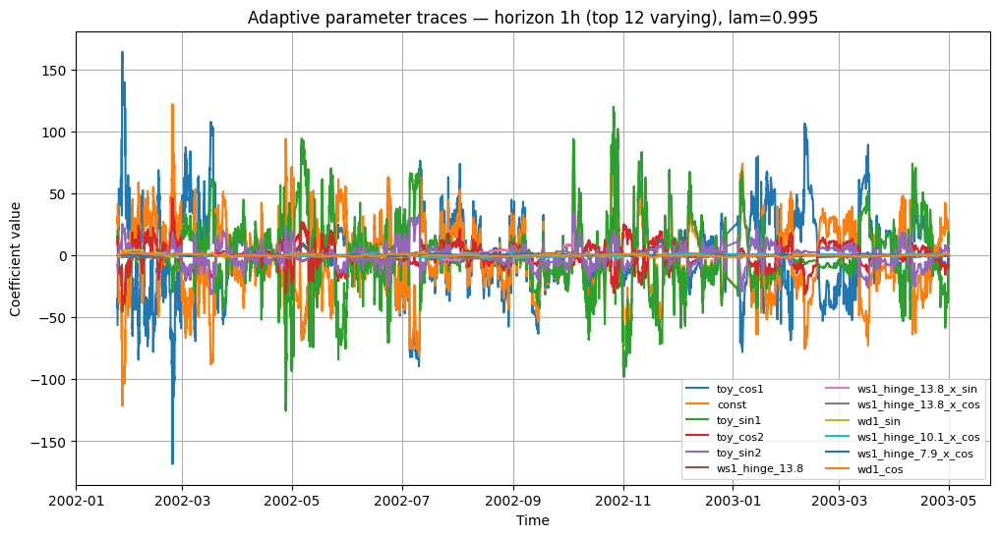

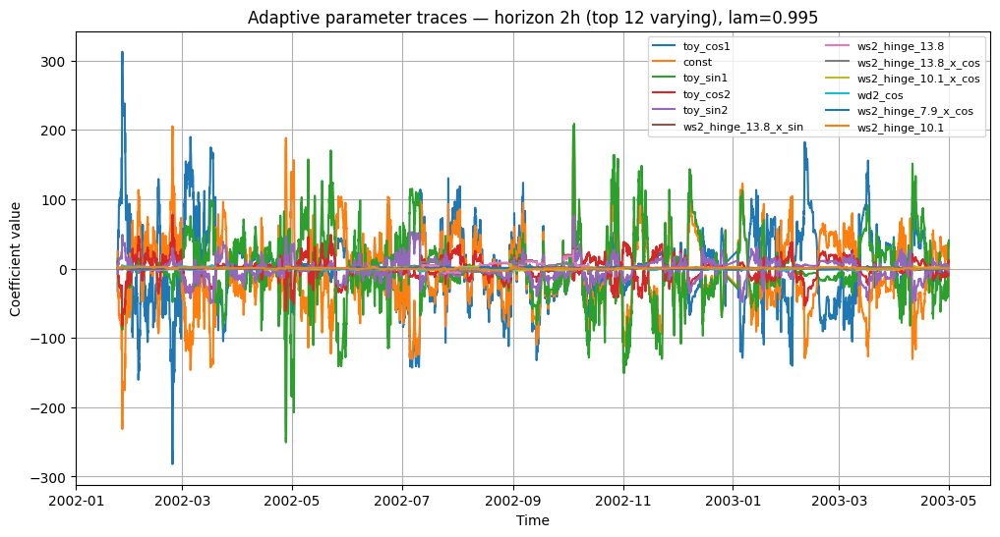

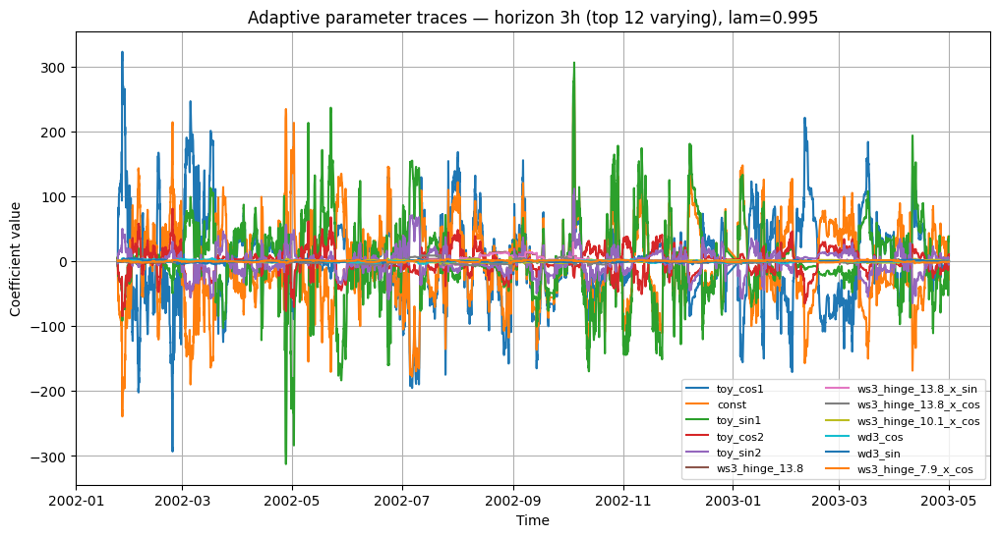

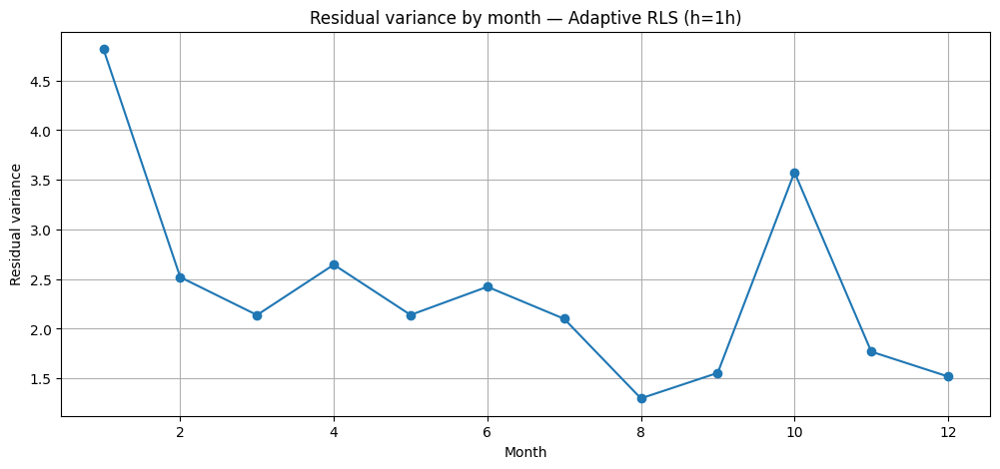

h=1h residual variance day:  2.517
h=1h residual variance night:2.333


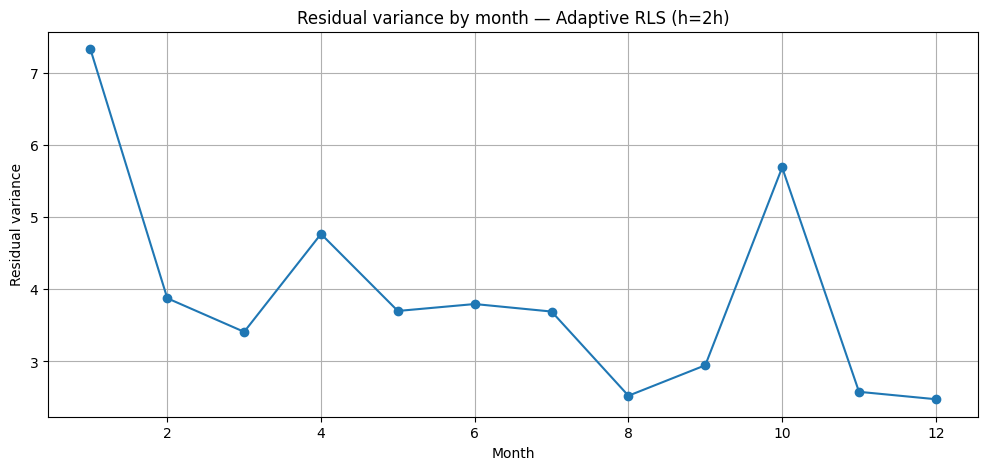

h=2h residual variance day:  4.155
h=2h residual variance night:3.807


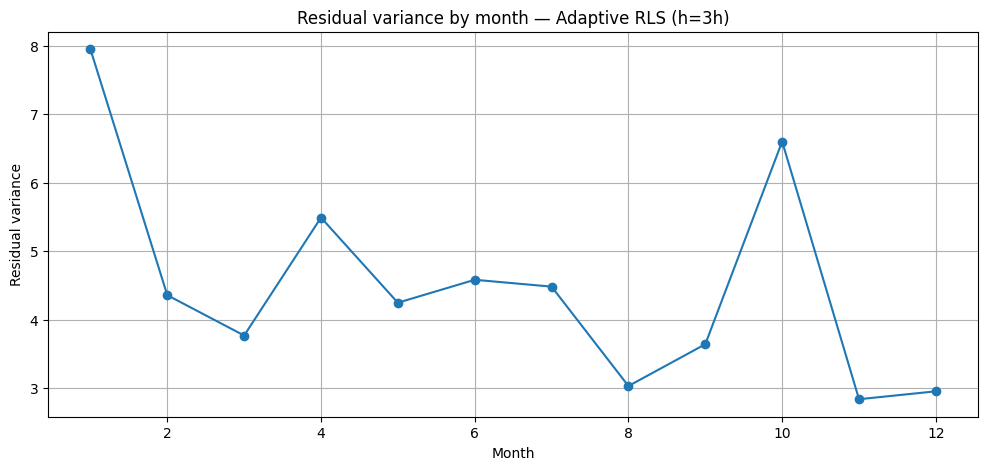

h=3h residual variance day:  4.692
h=3h residual variance night:4.436


,h,model,MAE,RMSE,Skill_vs_persistence_(1-RMSE/RMSE_persist)
0,1,Adaptive RLS (lam=0.995),1.021363,1.557133,0.050674
1,1,Linear ARX OLS (seasonal+diurnal+weekly),1.017522,1.549505,NaN
2,1,Persistence p(t-h),1.009048,1.640251,NaN
3,2,Adaptive RLS (lam=0.995),1.362895,1.995104,0.193747
4,2,Linear ARX OLS (seasonal+diurnal+weekly),1.479382,2.139964,NaN
5,2,Persistence p(t-h),1.541062,2.474538,NaN
6,3,Adaptive RLS (lam=0.995),1.484137,2.136250,0.302987
7,3,Linear ARX OLS (seasonal+diurnal+weekly),1.724431,2.411313,NaN
8,3,Persistence p(t-h),1.932475,3.064863,NaN


In [7]:
# ============================================================
# 14) Parameter traces (required): show most time-varying coefficients
# ============================================================
def plot_param_traces(h, top_k=12):
    pack = adaptive_traces[h]
    names = pack["names"]
    trace = pack["trace"]
    t = pack["t"]

    trace_df = pd.DataFrame(trace, columns=names)
    # pick coefficients with largest std over test period
    stds = trace_df.std().sort_values(ascending=False)
    pick = stds.head(top_k).index.tolist()

    plt.figure(figsize=(12, 6))
    for c in pick:
        plt.plot(t, trace_df[c].values, label=c)
    plt.title(f"Adaptive parameter traces — horizon {h}h (top {top_k} varying), lam={LAMBDA}")
    plt.xlabel("Time")
    plt.ylabel("Coefficient value")
    plt.legend(fontsize=8, ncol=2)
    plt.show()

for h in [1, 2, 3]:
    plot_param_traces(h, top_k=12)


# ============================================================
# 15) Residual variance by month + day/night (ties to your new findings)
# ============================================================
def residual_variance_summaries(h):
    pack = adaptive_traces[h]
    t = pd.to_datetime(pack["t"])
    resid = pd.Series(pack["resid"], index=t)

    # by month
    by_month = resid.groupby(resid.index.month).var()

    plt.figure()
    plt.plot(by_month.index, by_month.values, marker="o")
    plt.title(f"Residual variance by month — Adaptive RLS (h={h}h)")
    plt.xlabel("Month")
    plt.ylabel("Residual variance")
    plt.show()

    # day vs night (define: day 6–18)
    hours = resid.index.hour
    day = resid[(hours >= 6) & (hours < 18)]
    night = resid[(hours < 6) | (hours >= 18)]
    print(f"h={h}h residual variance day:  {day.var():.3f}")
    print(f"h={h}h residual variance night:{night.var():.3f}")

for h in [1, 2, 3]:
    residual_variance_summaries(h)


# ============================================================
# 16) Final combined comparison table (baselines + adaptive)
# ============================================================
final = pd.concat([
    baseline_table,
    adaptive_table
], ignore_index=True)

final.sort_values(["h", "model"]).reset_index(drop=True)

Train period: 1999-01-01 09:00:00 → 2002-01-23 23:00:00
Test  period: 2002-01-24 00:00:00 → 2003-04-30 23:00:00

Inner-train period: 1999-01-01 09:00:00 → 2001-06-21 09:00:00
Validation period : 2001-06-21 10:00:00 → 2002-01-23 23:00:00


C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  denom = lam + float(x.T @ P @ x)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  err = y - float(theta.reshape(1, -1) @ x)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:42: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  preds[t] = float(theta.reshape(1, -1) @ x)
C:\Users\tata\A


Chosen by validation (per horizon):


,h,method,lam,rmse,clip
0,1,OLS,NaN,1.417046,True
1,2,RLS,0.997,1.944787,True
2,3,RLS,0.990,2.156438,True


C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  denom = lam + float(x.T @ P @ x)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  err = y - float(theta.reshape(1, -1) @ x)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:42: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  preds[t] = float(theta.reshape(1, -1) @ x)
C:\Users\tata\A


Final test evaluation with improvements:


,h,chosen_method,lambda,clip,MAE,RMSE,Skill_vs_persistence_(1-RMSE/RMSE_persist),RMSE_persistence
0,1,OLS,NaN,True,0.961250,1.495193,0.088408,1.640199
1,2,RLS,0.997,True,1.306803,1.958218,0.208889,2.475277
2,3,RLS,0.990,True,1.401756,2.110418,0.311794,3.066547


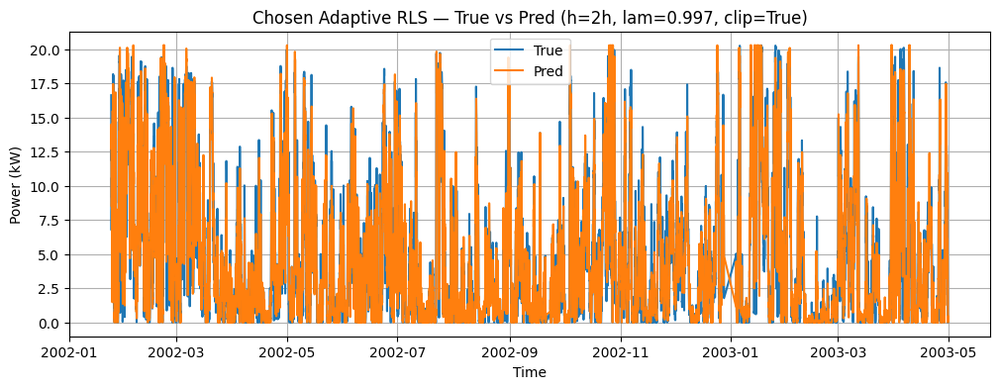

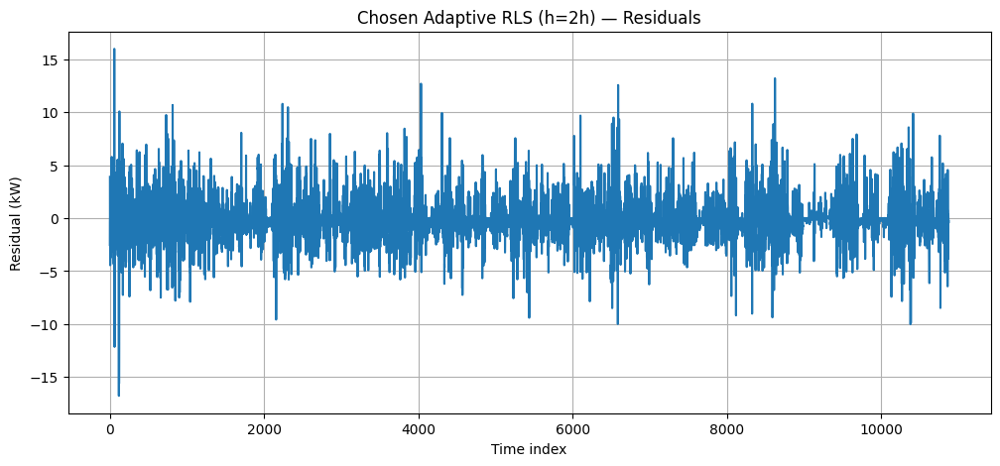

<Figure size 1200x500 with 0 Axes>

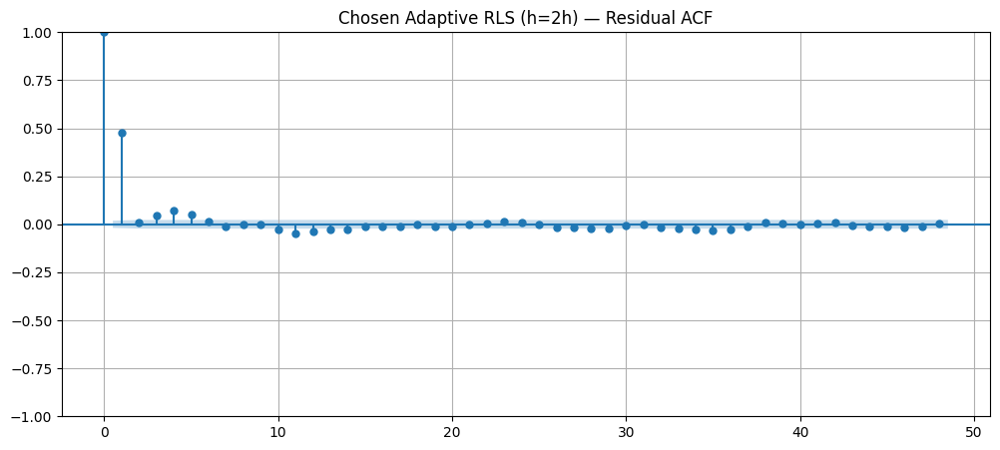

<Figure size 1200x500 with 0 Axes>

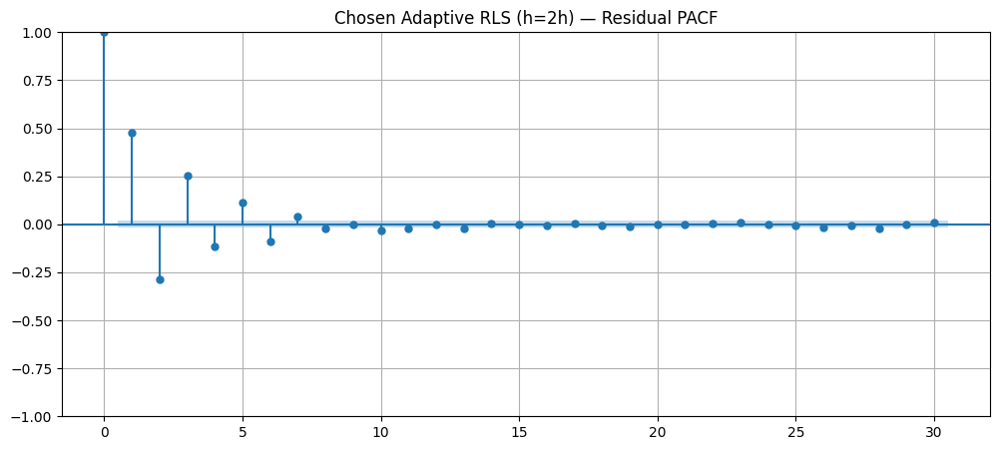

Chosen Adaptive RLS (h=2h) — Ljung–Box p-values:


,lb_stat,lb_pvalue
12,2651.498348,0.0
24,2677.421479,0.0
48,2742.123646,0.0


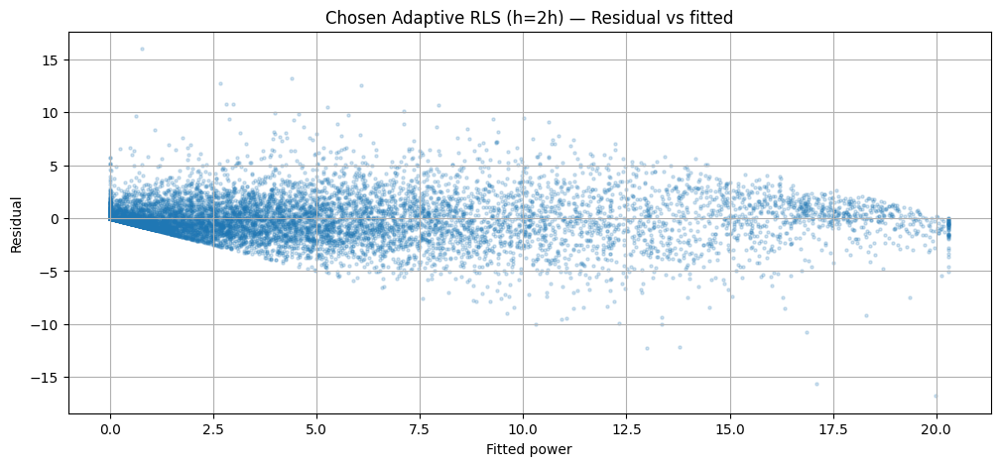

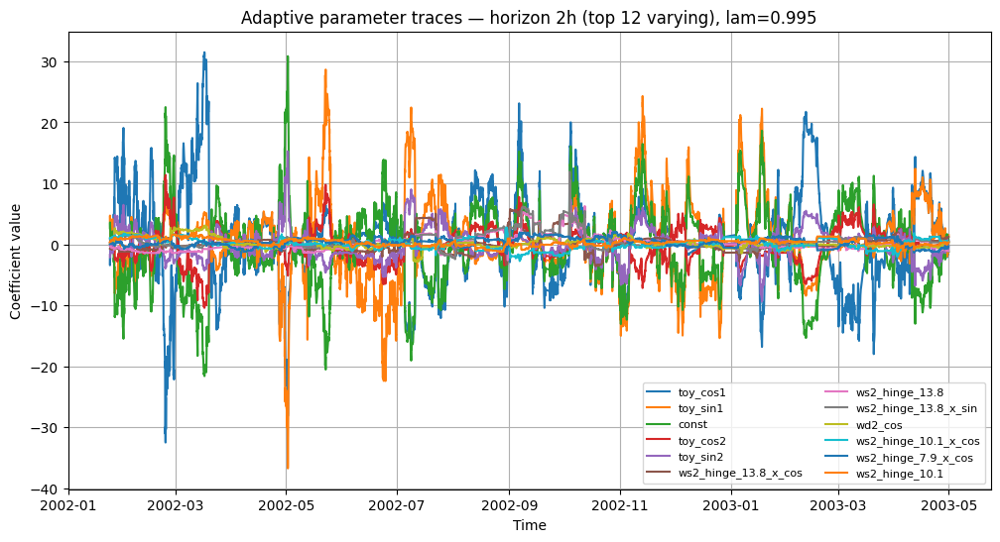

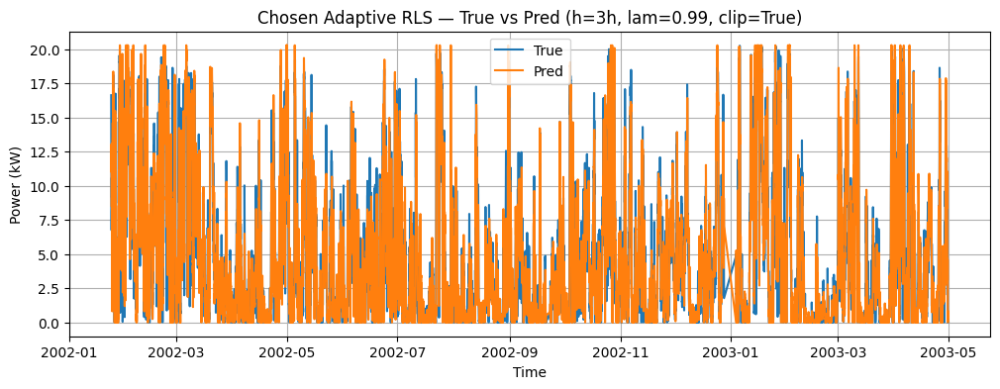

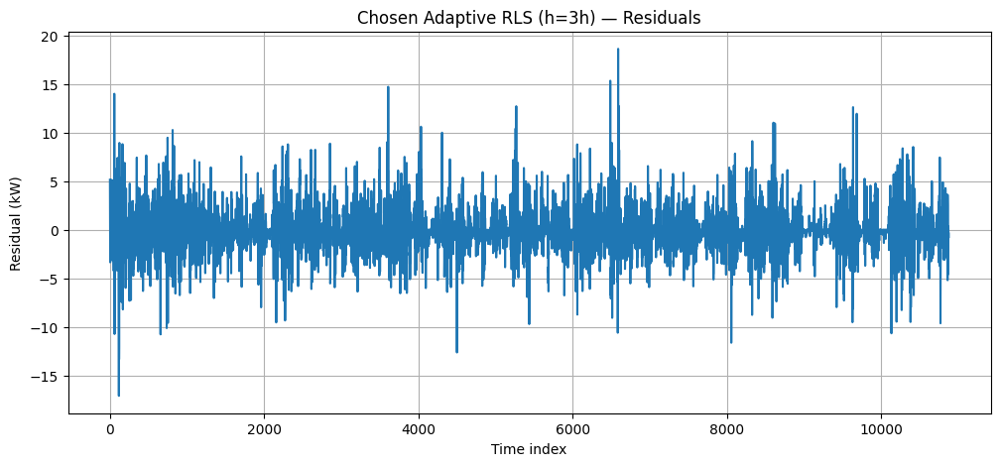

<Figure size 1200x500 with 0 Axes>

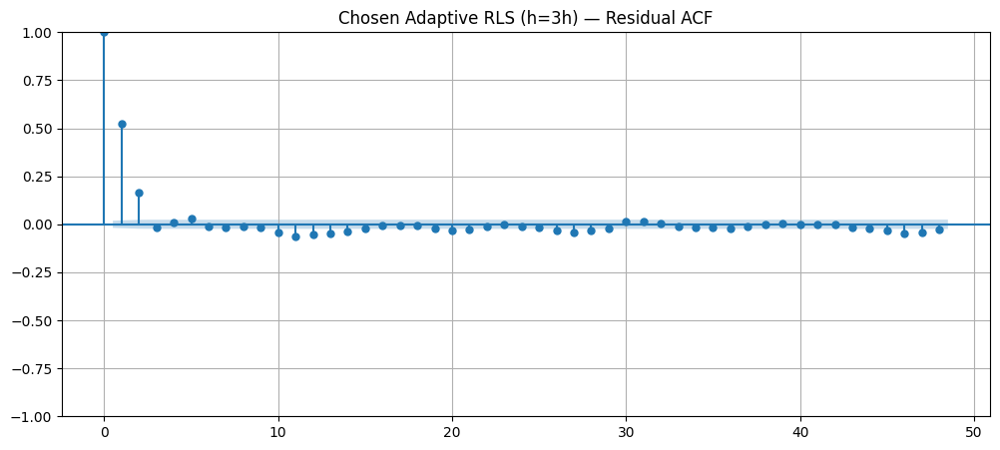

<Figure size 1200x500 with 0 Axes>

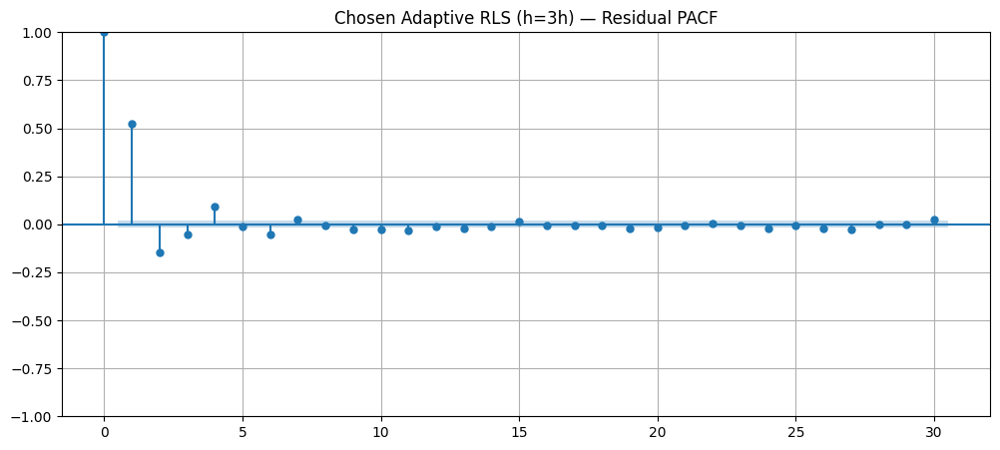

Chosen Adaptive RLS (h=3h) — Ljung–Box p-values:


,lb_stat,lb_pvalue
12,3378.110503,0.0
24,3454.581024,0.0
48,3595.507311,0.0


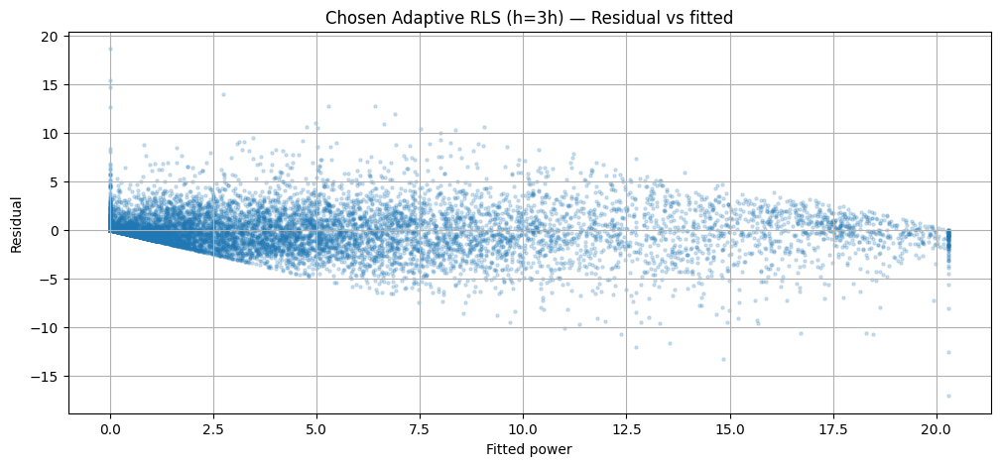

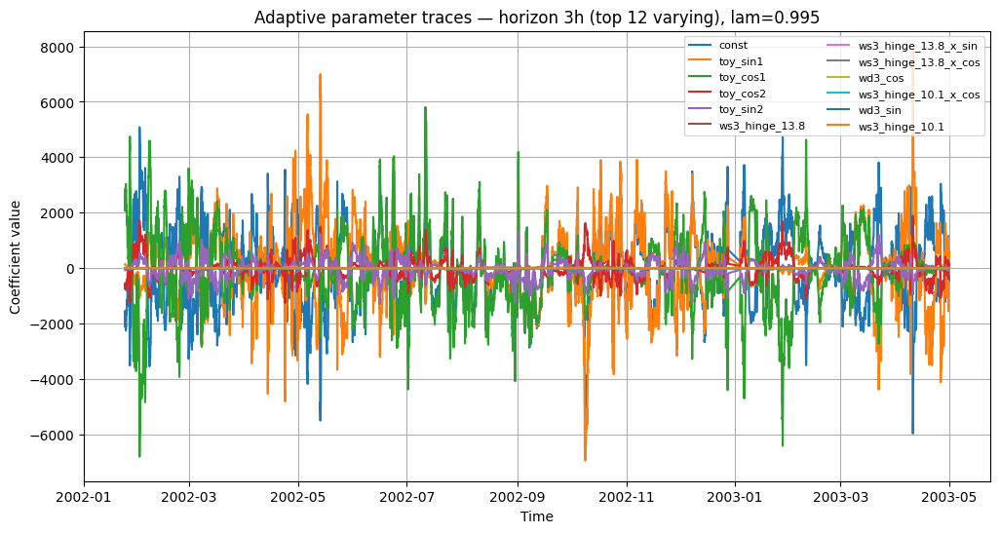

In [8]:
### Cell: Improvements based on results (tuned lambda, extra horizon-available lags, model selection per horizon)

from io import StringIO

# ------------------------------------------------------------
# 1) Add more lags (availability-correct AR enrichment)
# ------------------------------------------------------------
MAX_LAG = 6
df2 = df.copy()

for k in range(1, MAX_LAG + 1):
    df2[f"p_lag{k}"] = df2["p"].shift(k)

df2 = df2.dropna().reset_index(drop=True)

# Rebuild time split using the same fraction as before
train_df2, test_df2 = train_test_split_time(df2, train_frac=0.7)

print("Train period:", train_df2["t"].min(), "→", train_df2["t"].max())
print("Test  period:", test_df2["t"].min(),  "→", test_df2["t"].max())

P_MAX = float(df2["p"].max())

# ------------------------------------------------------------
# 2) Upgraded design matrix: include multiple lags available at horizon h
#    At forecast origin (t-h), you know p_{t-h}, p_{t-(h+1)}, p_{t-(h+2)}, ...
#    We'll include 3 lags: h, h+1, h+2 (bounded by MAX_LAG).
# ------------------------------------------------------------
def build_design_matrix_v2(df_in, h, knots, include_weekly=True, n_lags=3):
    out = df_in.copy()

    # Weather basis
    ws = out[f"Ws{h}"].astype(float).values
    ws_b = hinge_basis(ws, knots)

    cols = {"const": np.ones(len(out))}

    # Horizon-available lags
    lag_list = [h + i for i in range(n_lags) if (h + i) <= MAX_LAG]
    for L in lag_list:
        cols[f"p_lag{L}"] = out[f"p_lag{L}"].values

    # Temperature + direction
    cols[f"T{h}_c"] = out[f"T{h}_c"].values
    cols[f"wd{h}_sin"] = out[f"wd{h}_sin"].values
    cols[f"wd{h}_cos"] = out[f"wd{h}_cos"].values

    # Nonlinear Ws (hinges)
    cols[f"ws{h}"] = ws_b[:, 0]
    for i, k in enumerate(knots, start=1):
        cols[f"ws{h}_hinge_{k:g}"] = ws_b[:, i]

    ws_names = [f"ws{h}"] + [f"ws{h}_hinge_{k:g}" for k in knots]
    for name in ws_names:
        cols[f"{name}_x_sin"] = cols[name] * cols[f"wd{h}_sin"]
        cols[f"{name}_x_cos"] = cols[name] * cols[f"wd{h}_cos"]

    # Seasonal + diurnal
    for k in [1, 2]:
        cols[f"toy_sin{k}"] = out[f"toy_sin{k}"].values
        cols[f"toy_cos{k}"] = out[f"toy_cos{k}"].values
        cols[f"hr_sin{k}"]  = out[f"hr_sin{k}"].values
        cols[f"hr_cos{k}"]  = out[f"hr_cos{k}"].values

    # Weekly
    if include_weekly:
        cols["wk_sin1"] = out["wk_sin1"].values
        cols["wk_cos1"] = out["wk_cos1"].values

    X = pd.DataFrame(cols, index=out.index)
    y = out["p"].values.astype(float)
    return X, y

# ------------------------------------------------------------
# 3) Validation split inside train (expanding-style: last chunk is validation)
# ------------------------------------------------------------
def train_val_split_time(df_in, val_frac=0.2):
    n = len(df_in)
    cut = int(n * (1 - val_frac))
    return df_in.iloc[:cut].copy(), df_in.iloc[cut:].copy()

train_in, val_in = train_val_split_time(train_df2, val_frac=0.2)
print("\nInner-train period:", train_in["t"].min(), "→", train_in["t"].max())
print("Validation period :", val_in["t"].min(),  "→", val_in["t"].max())

# ------------------------------------------------------------
# 4) Model candidates per horizon:
#    - OLS on rich nonlinear features
#    - RLS on rich nonlinear features with lambda grid
#    Also apply optional clipping to [0, P_MAX]
# ------------------------------------------------------------
LAM_GRID = [0.999, 0.997, 0.995, 0.993, 0.990]
N_LAGS_BY_H = {1: 3, 2: 3, 3: 3}  # keep fixed; easy to adjust

def fit_predict_ols(Xtr, ytr, Xte):
    m = sm.OLS(ytr, Xtr).fit()
    return m.predict(Xte).values

def clip_pred(pred, pmax=P_MAX):
    return np.clip(pred, 0.0, pmax)

selection = []
final_models = {}  # store chosen config per horizon

for h in [1, 2, 3]:
    # Build matrices for inner train and validation
    Xtr, ytr = build_design_matrix_v2(train_in, h, knots, include_weekly=True, n_lags=N_LAGS_BY_H[h])
    Xva, yva = build_design_matrix_v2(val_in,   h, knots, include_weekly=True, n_lags=N_LAGS_BY_H[h])

    # ---- Candidate 1: OLS (non-adaptive)
    pred_ols = fit_predict_ols(Xtr, ytr, Xva)
    pred_ols_c = clip_pred(pred_ols)
    rmse_ols = rmse(yva, pred_ols)
    rmse_ols_c = rmse(yva, pred_ols_c)

    best = {"h": h, "method": "OLS", "lam": None, "rmse": rmse_ols, "clip": False}
    if rmse_ols_c < best["rmse"]:
        best = {"h": h, "method": "OLS", "lam": None, "rmse": rmse_ols_c, "clip": True}

    # ---- Candidate 2: Adaptive RLS (tune lambda)
    for lam in LAM_GRID:
        pred_rls, _, _ = rls_forgetting_fit_predict(Xtr, ytr, Xva, yva, lam=lam, delta=1e4)
        rmse_rls = rmse(yva, pred_rls)

        pred_rls_c = clip_pred(pred_rls)
        rmse_rls_c = rmse(yva, pred_rls_c)

        if rmse_rls < best["rmse"]:
            best = {"h": h, "method": "RLS", "lam": lam, "rmse": rmse_rls, "clip": False}
        if rmse_rls_c < best["rmse"]:
            best = {"h": h, "method": "RLS", "lam": lam, "rmse": rmse_rls_c, "clip": True}

    selection.append(best)
    final_models[h] = best

sel_df = pd.DataFrame(selection).sort_values("h")
print("\nChosen by validation (per horizon):")
display(sel_df)

# ------------------------------------------------------------
# 5) Refit on full train_df2 and evaluate on test_df2 using chosen config
# ------------------------------------------------------------
eval_rows = []

for h in [1, 2, 3]:
    cfg = final_models[h]
    Xtr, ytr = build_design_matrix_v2(train_df2, h, knots, include_weekly=True, n_lags=N_LAGS_BY_H[h])
    Xte, yte = build_design_matrix_v2(test_df2,  h, knots, include_weekly=True, n_lags=N_LAGS_BY_H[h])

    # persistence baseline (always)
    y_persist = test_df2[f"p_lag{h}"].values

    if cfg["method"] == "OLS":
        pred = fit_predict_ols(Xtr, ytr, Xte)
        trace = None
    else:
        pred, trace, resid = rls_forgetting_fit_predict(Xtr, ytr, Xte, yte, lam=cfg["lam"], delta=1e4)

    if cfg["clip"]:
        pred = clip_pred(pred)

    rmse_p = rmse(yte, y_persist)
    rmse_m = rmse(yte, pred)

    eval_rows.append({
        "h": h,
        "chosen_method": cfg["method"],
        "lambda": cfg["lam"],
        "clip": cfg["clip"],
        "MAE": mae(yte, pred),
        "RMSE": rmse_m,
        "Skill_vs_persistence_(1-RMSE/RMSE_persist)": 1.0 - (rmse_m / rmse_p),
        "RMSE_persistence": rmse_p,
    })

    # Store traces for parameter plots (only if RLS chosen)
    if cfg["method"] == "RLS":
        adaptive_traces[h] = {
            "names": Xte.columns.tolist(),
            "trace": trace,
            "t": test_df2["t"].values,
            "pred": pred,
            "y": yte,
            "resid": yte - pred,
        }

eval_df = pd.DataFrame(eval_rows).sort_values("h")
print("\nFinal test evaluation with improvements:")
display(eval_df)

# ------------------------------------------------------------
# 6) Diagnostics + traces for horizons where RLS chosen
# ------------------------------------------------------------
for h in [1, 2, 3]:
    cfg = final_models[h]
    if cfg["method"] != "RLS":
        continue

    pack = adaptive_traces[h]
    t = pack["t"]
    y = pack["y"]
    pred = pack["pred"]

    plt.figure(figsize=(12, 4))
    plt.plot(t, y, label="True")
    plt.plot(t, pred, label="Pred")
    plt.title(f"Chosen Adaptive RLS — True vs Pred (h={h}h, lam={cfg['lam']}, clip={cfg['clip']})")
    plt.xlabel("Time")
    plt.ylabel("Power (kW)")
    plt.legend()
    plt.show()

    _ = residual_diagnostics(y, pred, title_prefix=f"Chosen Adaptive RLS (h={h}h)", lags=48)

    # Parameter traces: show most varying
    plot_param_traces(h, top_k=12)



Train day/night sizes: 12692 12680
Test  day/night sizes: 5436 5439

Two-regime OLS result (h=1):
{'h': 1, 'method': '2-regime OLS', 'lam': None, 'clip': True, 'MAE': 0.9544867140904671, 'RMSE': 1.4859544583089739}


C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  denom = lam + float(x.T @ P @ x)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  err = y - float(theta.reshape(1, -1) @ x)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:42: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  preds[t] = float(theta.reshape(1, -1) @ x)
C:\Users\tata\A


Two-regime RLS result (h=1):
{'h': 1, 'method': '2-regime RLS', 'lam': 0.999, 'clip': True, 'MAE': 0.9492798415191444, 'RMSE': 1.4764901261303165}


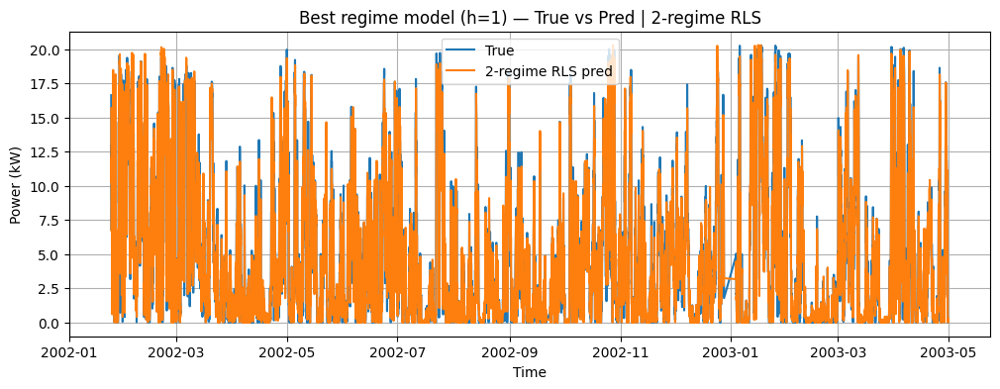

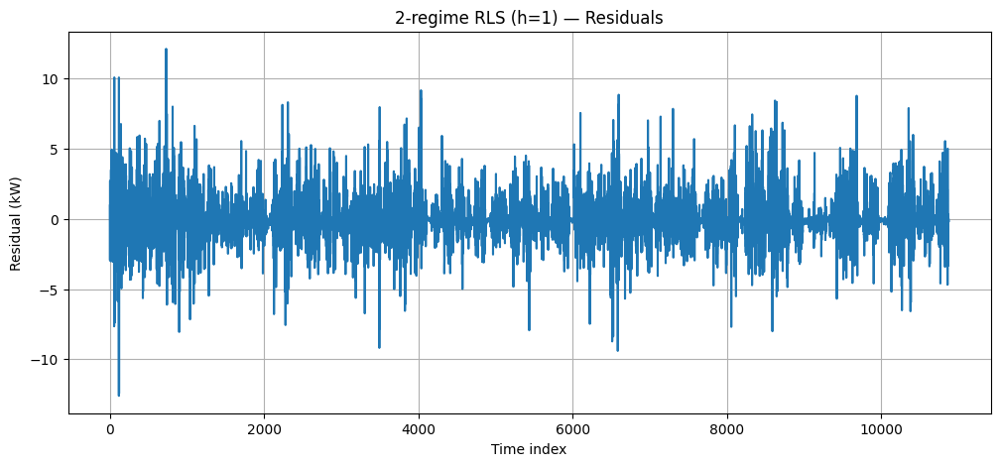

<Figure size 1200x500 with 0 Axes>

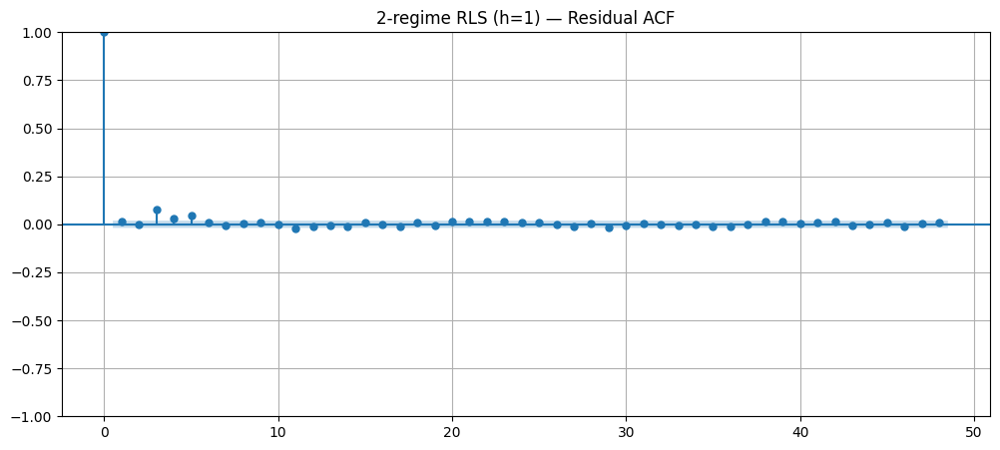

<Figure size 1200x500 with 0 Axes>

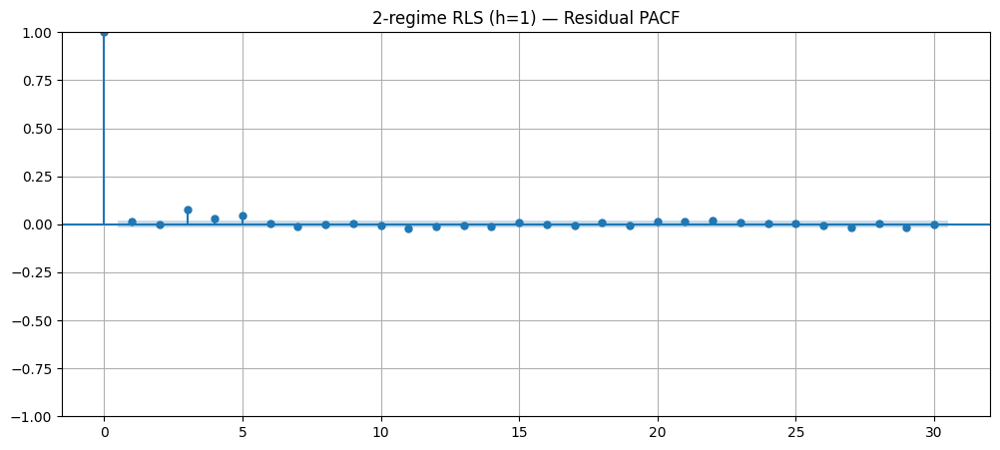

2-regime RLS (h=1) — Ljung–Box p-values:


,lb_stat,lb_pvalue
12,110.285279,5.254912e-18
24,125.850700,8.700587e-16
48,148.806221,3.007948e-12


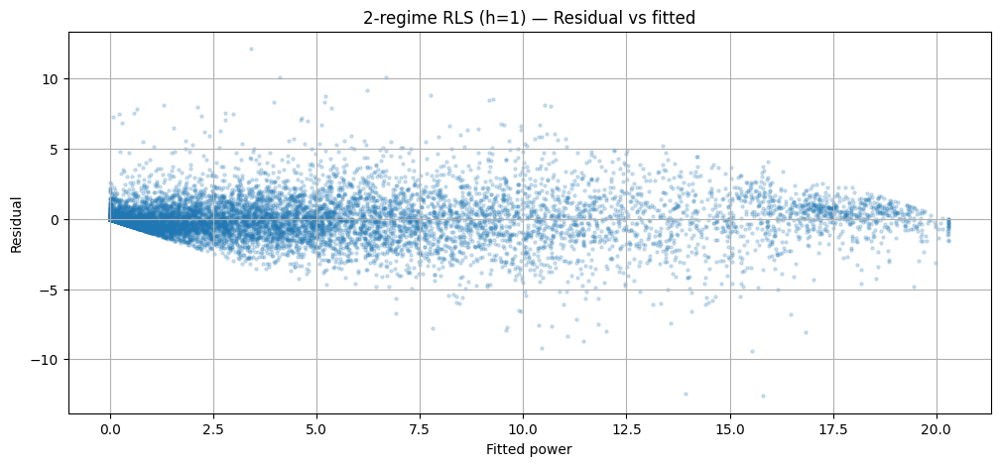

In [9]:
### Cell: Fix day/night split bug + (optional) regime models for h=1 (and h=2/3 if you want)

# Your error happens because pd.to_datetime(series).hour works for a single Timestamp,
# but for a Series you need .dt.hour.

def is_day_hour(ts_series):
    """
    Returns a boolean mask for a pandas Series of timestamps:
    Day = [06:00, 18:00), Night = otherwise.
    """
    dt = pd.to_datetime(ts_series)
    hr = dt.dt.hour
    return (hr >= 6) & (hr < 18)

# Recreate splits safely
h = 1

train_day = train_df2[is_day_hour(train_df2["t"])].copy()
train_night = train_df2[~is_day_hour(train_df2["t"])].copy()

test_day = test_df2[is_day_hour(test_df2["t"])].copy()
test_night = test_df2[~is_day_hour(test_df2["t"])].copy()

print("Train day/night sizes:", len(train_day), len(train_night))
print("Test  day/night sizes:", len(test_day),  len(test_night))

# ---- Two-regime OLS for horizon h (uses the improved v2 design matrix)
def fit_predict_ols_from_design(Xtr, ytr, Xte):
    m = sm.OLS(ytr, Xtr).fit()
    return m.predict(Xte).values

def eval_two_regime_model(h, method="OLS", lam=0.999, clip=True):
    # Train
    Xd, yd = build_design_matrix_v2(train_day,  h, knots, include_weekly=True, n_lags=N_LAGS_BY_H[h])
    Xn, yn = build_design_matrix_v2(train_night,h, knots, include_weekly=True, n_lags=N_LAGS_BY_H[h])

    # Test
    Xtd, ytd = build_design_matrix_v2(test_day,  h, knots, include_weekly=True, n_lags=N_LAGS_BY_H[h])
    Xtn, ytn = build_design_matrix_v2(test_night,h, knots, include_weekly=True, n_lags=N_LAGS_BY_H[h])

    if method.upper() == "OLS":
        pred_d = fit_predict_ols_from_design(Xd, yd, Xtd)
        pred_n = fit_predict_ols_from_design(Xn, yn, Xtn)
        trace_d = trace_n = None
    else:
        pred_d, trace_d, _ = rls_forgetting_fit_predict(Xd, yd, Xtd, ytd, lam=lam, delta=1e4)
        pred_n, trace_n, _ = rls_forgetting_fit_predict(Xn, yn, Xtn, ytn, lam=lam, delta=1e4)

    # Stitch back into original test order
    pred_full = pd.Series(index=test_df2.index, dtype=float)
    pred_full.loc[test_day.index] = pred_d
    pred_full.loc[test_night.index] = pred_n
    pred_full = pred_full.sort_index().values

    if clip:
        pred_full = np.clip(pred_full, 0.0, P_MAX)

    y_true = test_df2["p"].values
    out = {
        "h": h,
        "method": f"2-regime {method.upper()}",
        "lam": lam if method.upper() != "OLS" else None,
        "clip": clip,
        "MAE": mae(y_true, pred_full),
        "RMSE": rmse(y_true, pred_full),
    }
    return out, pred_full, (trace_d, trace_n)

# Run and compare against your chosen single-model h=1 (printed earlier in eval_df)
res_regime_ols, pred_regime_ols, _ = eval_two_regime_model(h=1, method="OLS", clip=True)
print("\nTwo-regime OLS result (h=1):")
print(res_regime_ols)

# Optional: two-regime RLS (only if you want adaptivity inside each regime)
# Use a smoother lambda since h=1 tended to over-adapt.
res_regime_rls, pred_regime_rls, traces_regime = eval_two_regime_model(h=1, method="RLS", lam=0.999, clip=True)
print("\nTwo-regime RLS result (h=1):")
print(res_regime_rls)

# Quick diagnostic plots for the better of the two
best = res_regime_ols if res_regime_ols["RMSE"] <= res_regime_rls["RMSE"] else res_regime_rls
best_pred = pred_regime_ols if best["method"].endswith("OLS") else pred_regime_rls

plt.figure(figsize=(12, 4))
plt.plot(test_df2["t"].values, test_df2["p"].values, label="True")
plt.plot(test_df2["t"].values, best_pred, label=f"{best['method']} pred")
plt.title(f"Best regime model (h=1) — True vs Pred | {best['method']}")
plt.xlabel("Time")
plt.ylabel("Power (kW)")
plt.legend()
plt.show()

_ = residual_diagnostics(test_df2["p"].values, best_pred, title_prefix=f"{best['method']} (h=1)", lags=48)


C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3870844646.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df3[f"p_lag{k}"] = df3["p"].shift(k)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3870844646.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df3[f"p_lag{k}"] = df3["p"].shift(k)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3870844646.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all co

Train: 1999-01-09 11:00:00 → 2002-01-22 09:00:00
Val  : 2001-06-10 11:00:00 → 2002-01-22 09:00:00
Test : 2002-01-22 10:00:00 → 2003-04-30 23:00:00


C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  denom = lam + float(x.T @ P @ x)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  err = y - float(theta.reshape(1, -1) @ x)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:42: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  preds[t] = float(theta.reshape(1, -1) @ x)
C:\Users\tata\A

Top selections by score (per horizon):


,kind,h,lam,clip,rmse,lb_p,score
0,2-regime(day/night),1,0.9990,True,1.359036,2.232193e-10,4.025780
1,2-regime(day/night),1,0.9995,True,1.350084,2.943551e-11,4.259942
2,single,1,0.9995,True,1.354612,2.074530e-11,4.306457
3,single,1,0.9990,True,9.198157,0.000000e+00,12.513880
4,2-regime(day/night),1,0.9950,True,10.847861,0.000000e+00,14.163584
10,2-regime(day/night),2,0.9995,True,1.853373,3.751524e-289,5.169095
11,2-regime(day/night),2,0.9990,True,1.853663,2.301856e-276,5.169385
12,single,2,0.9995,True,1.857916,2.195184e-286,5.173638
13,single,2,0.9990,True,8.344930,0.000000e+00,11.660652
14,single,2,0.9950,True,10.748579,2.147344e-288,14.064301



Chosen config:


,kind,h,lam,clip,rmse,lb_p,score
0,2-regime(day/night),1,0.9990,True,1.359036,2.232193e-10,4.025780
1,2-regime(day/night),2,0.9995,True,1.853373,3.751524e-289,5.169095
2,2-regime(day/night),3,0.9990,True,2.091900,0.000000e+00,5.407623


C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  denom = lam + float(x.T @ P @ x)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  err = y - float(theta.reshape(1, -1) @ x)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:42: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  preds[t] = float(theta.reshape(1, -1) @ x)
C:\Users\tata\A

Final test metrics (note LB p-values):


,h,chosen_kind,lambda,RMSE,MAE,LB_pvalue_lag48,RMSE_persistence,Skill_vs_persistence
0,1,2-regime(day/night),0.9990,1.499624,0.965447,9.930702e-10,1.653773,0.093210
1,2,2-regime(day/night),0.9995,1.990636,1.321976,0.000000e+00,2.492154,0.201239
2,3,2-regime(day/night),0.9990,2.199432,1.465106,0.000000e+00,3.086808,0.287474


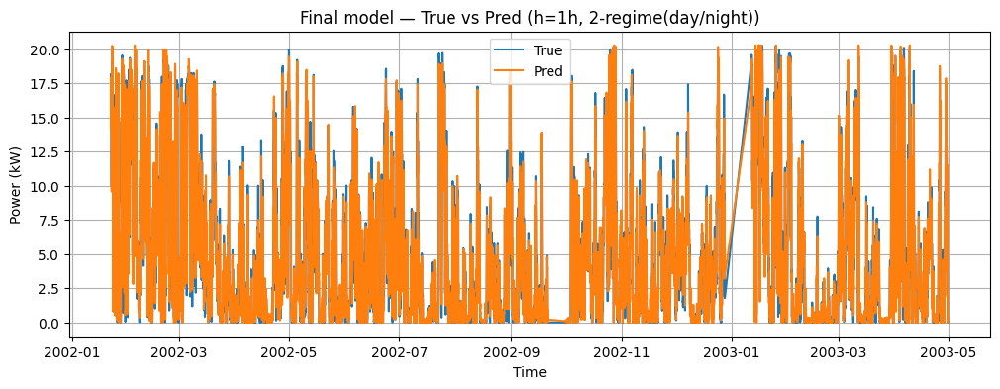

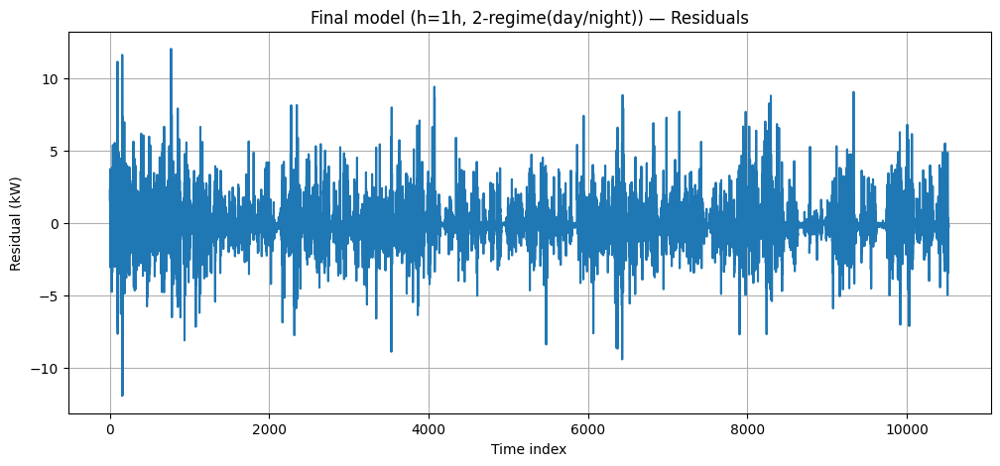

<Figure size 1200x500 with 0 Axes>

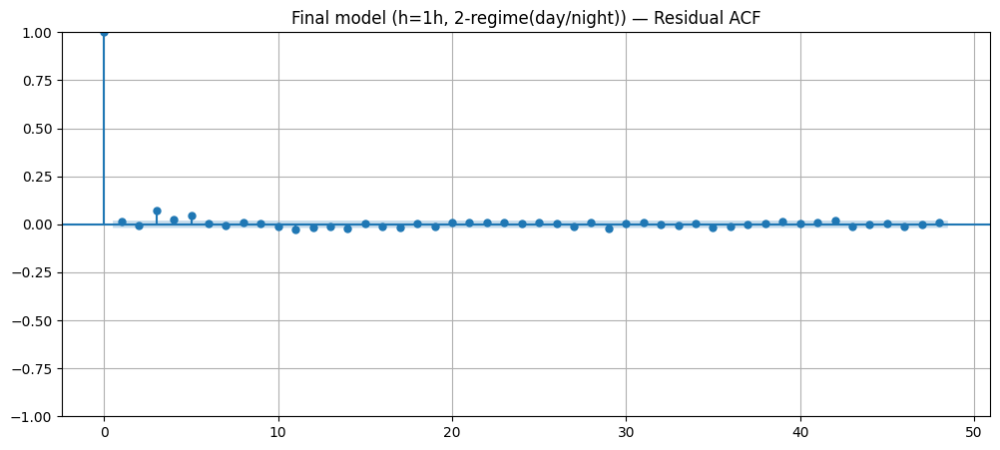

<Figure size 1200x500 with 0 Axes>

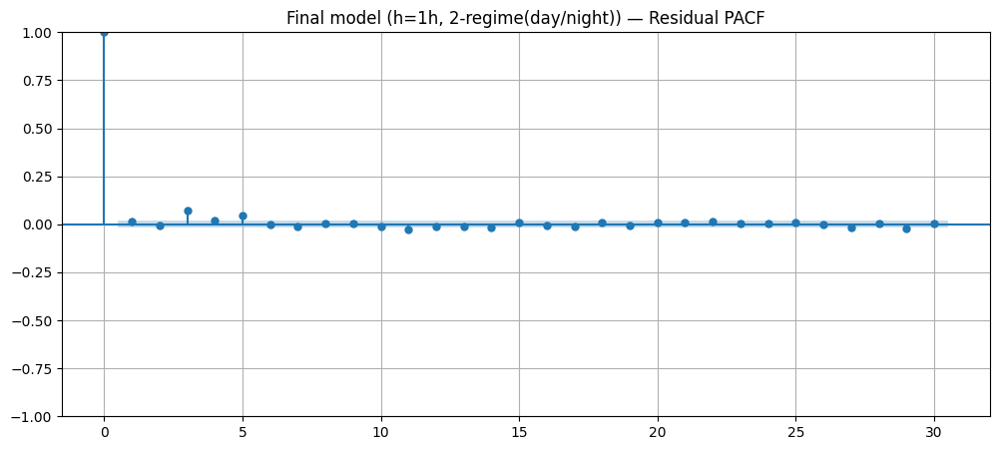

Final model (h=1h, 2-regime(day/night)) — Ljung–Box p-values:


,lb_stat,lb_pvalue
12,90.897966,3.307929e-14
24,105.879289,2.935193e-12
48,131.703902,9.930702e-10


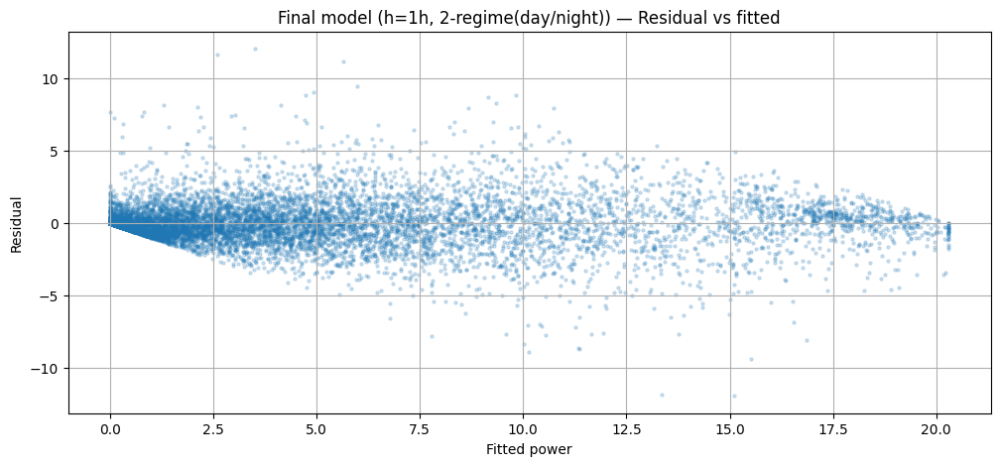

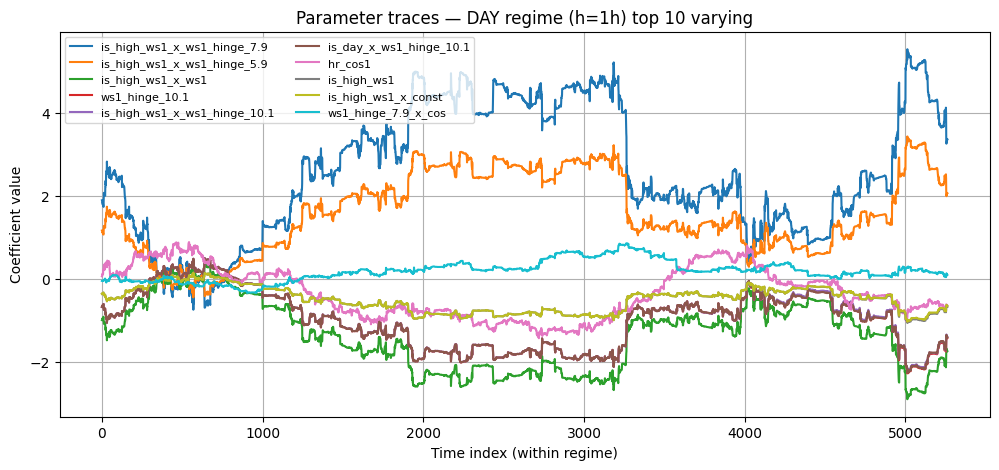

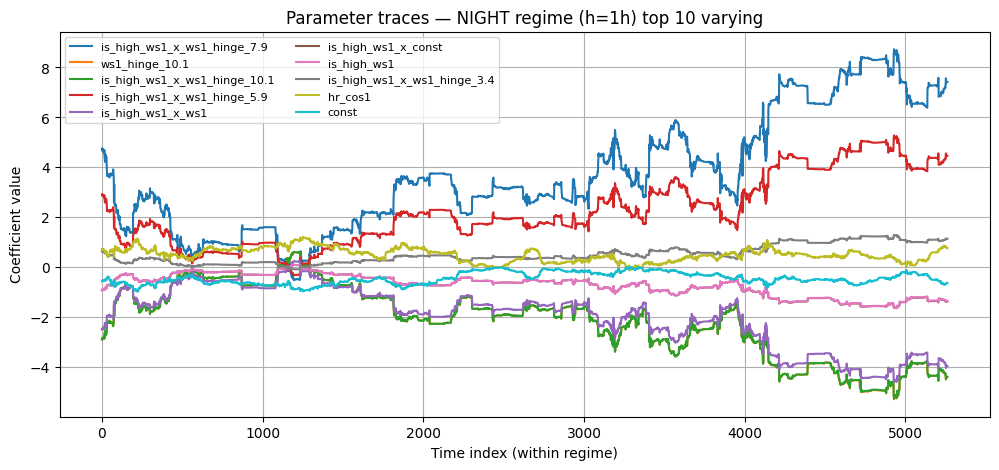

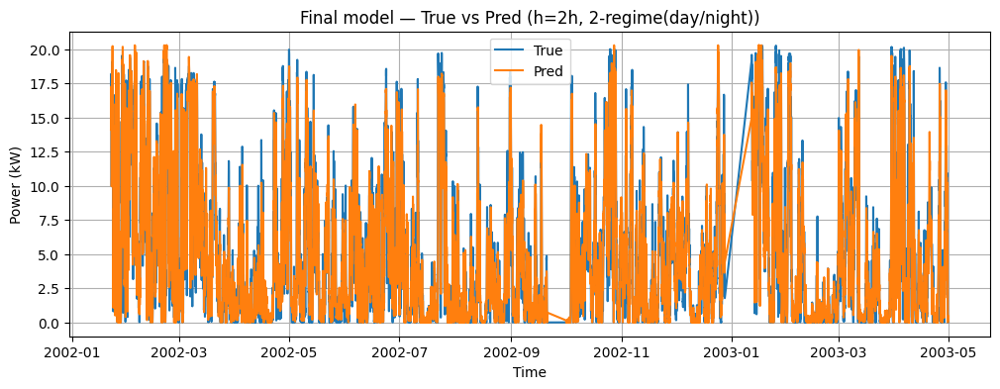

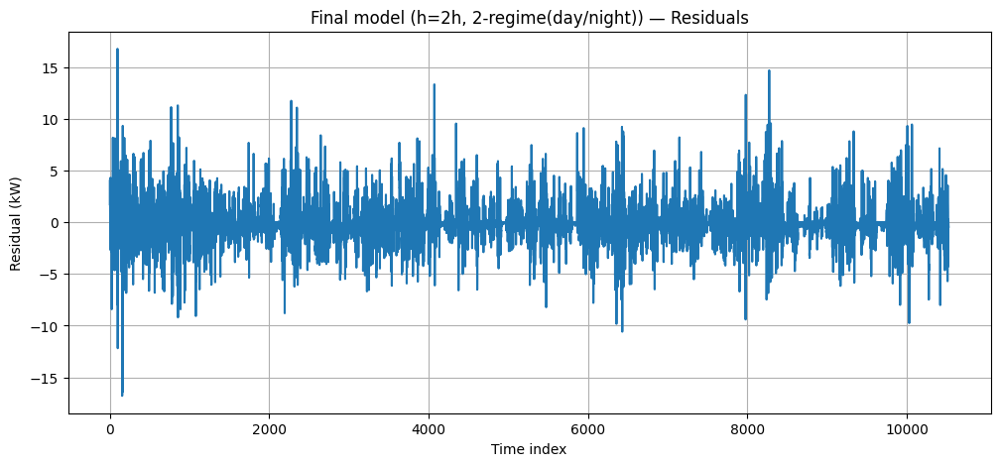

<Figure size 1200x500 with 0 Axes>

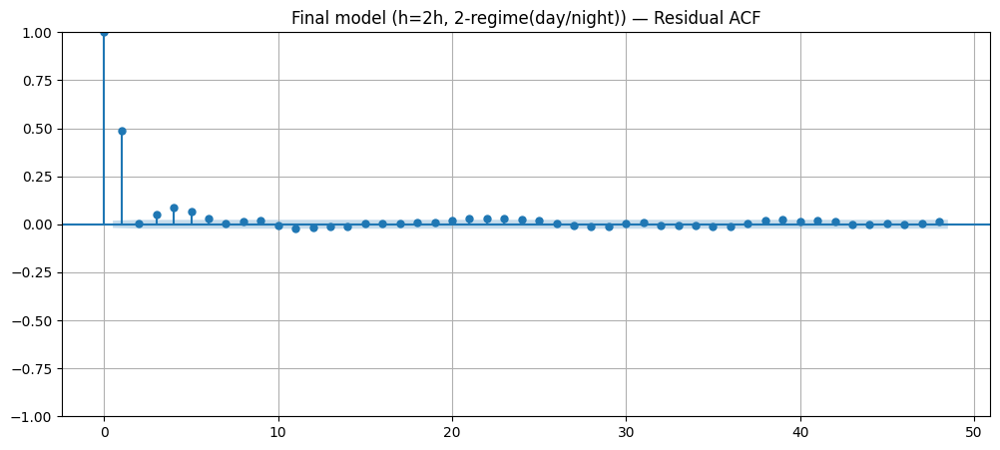

<Figure size 1200x500 with 0 Axes>

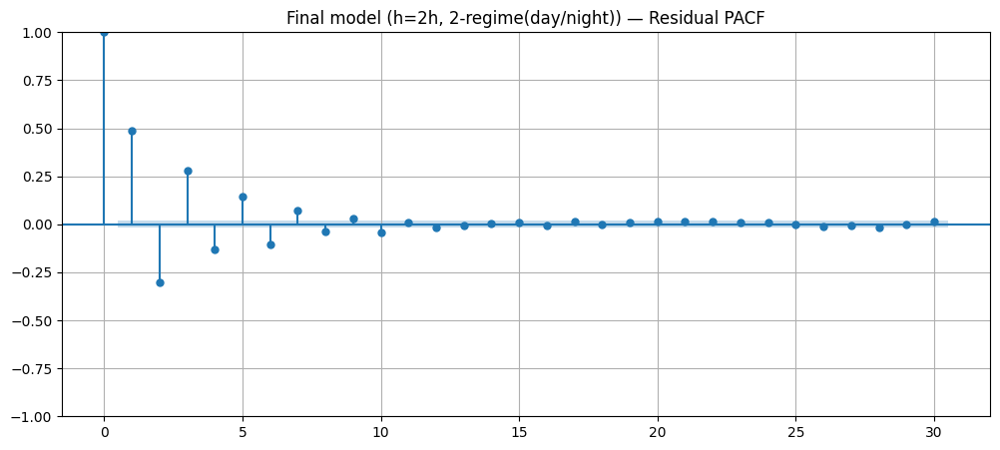

Final model (h=2h, 2-regime(day/night)) — Ljung–Box p-values:


,lb_stat,lb_pvalue
12,2660.431872,0.0
24,2703.618791,0.0
48,2738.810124,0.0


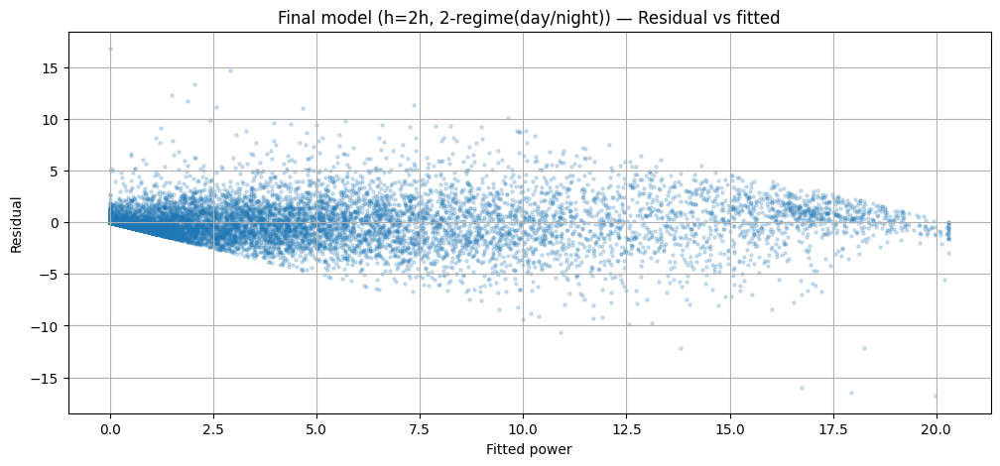

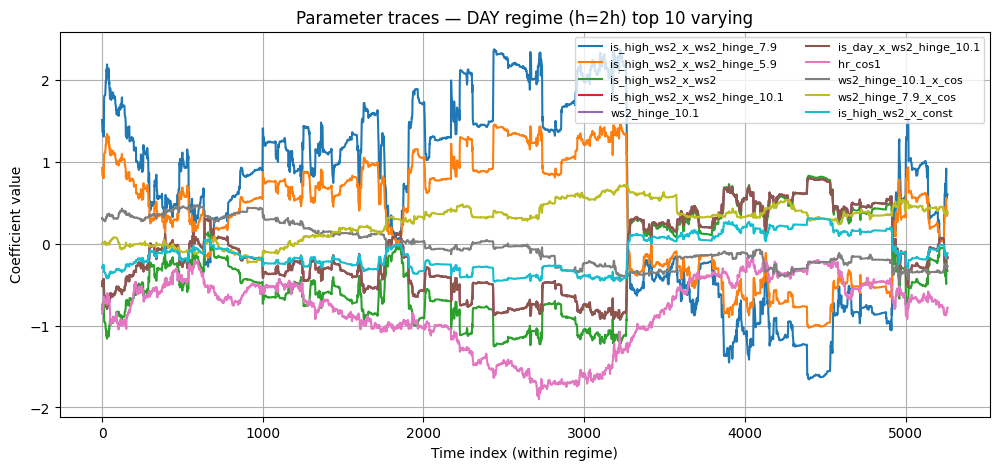

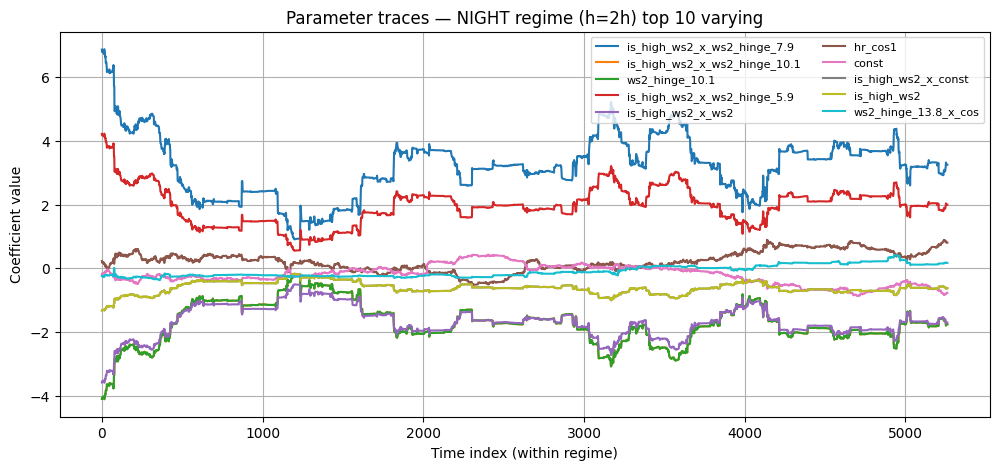

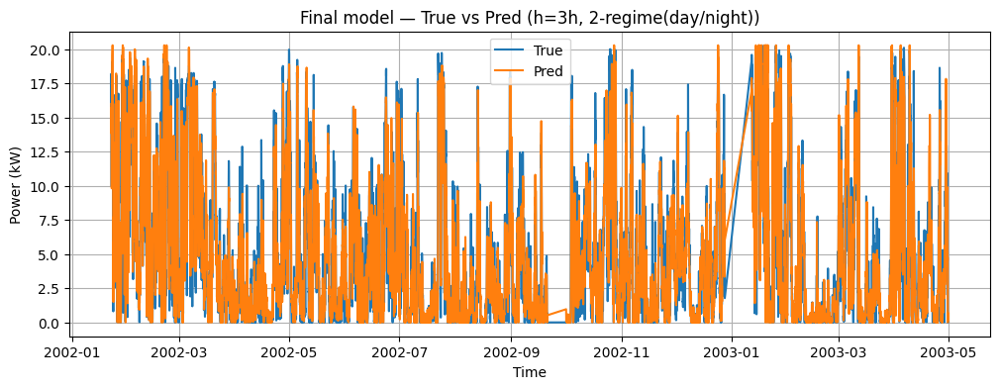

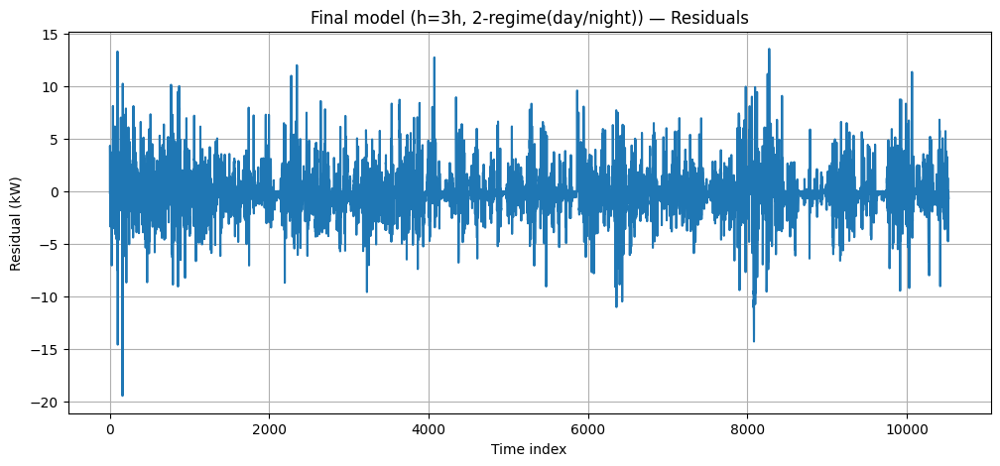

<Figure size 1200x500 with 0 Axes>

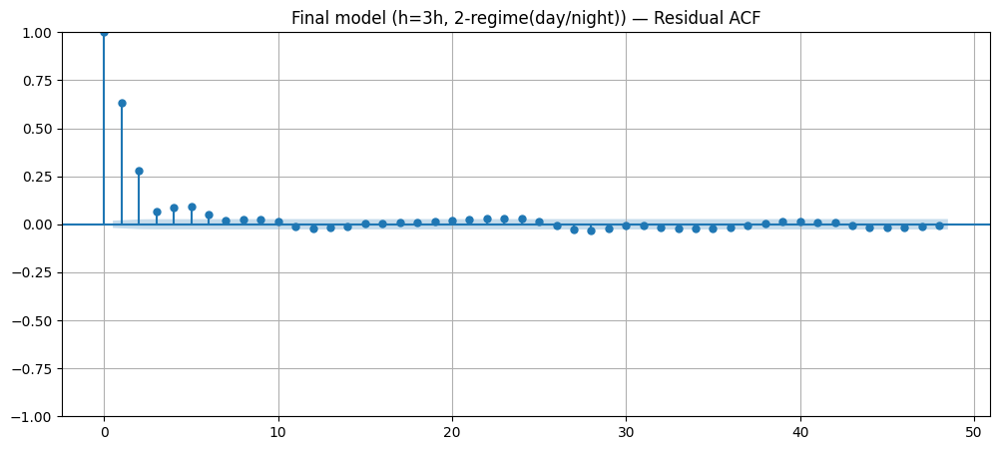

<Figure size 1200x500 with 0 Axes>

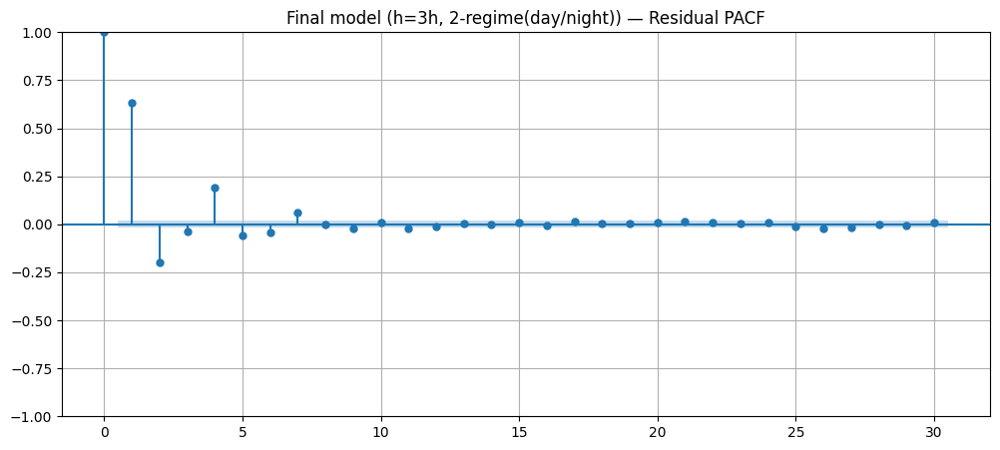

Final model (h=3h, 2-regime(day/night)) — Ljung–Box p-values:


,lb_stat,lb_pvalue
12,5283.889901,0.0
24,5329.512439,0.0
48,5397.609744,0.0


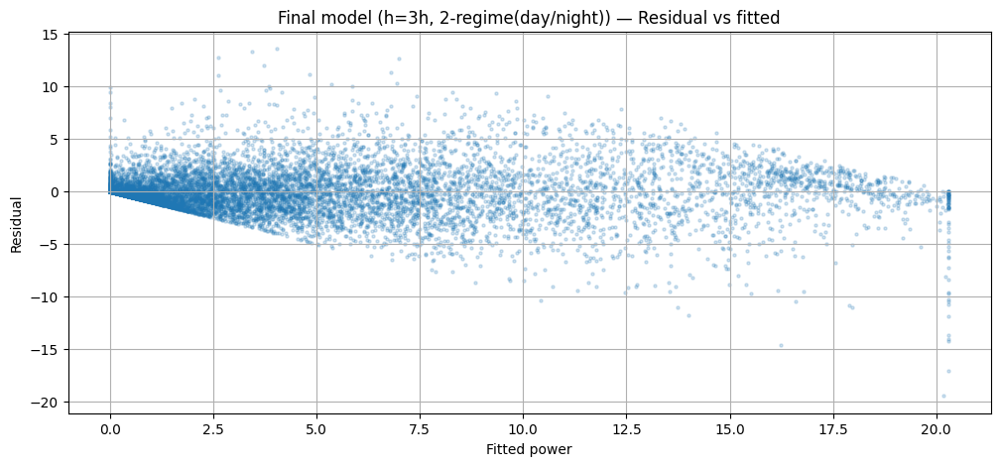

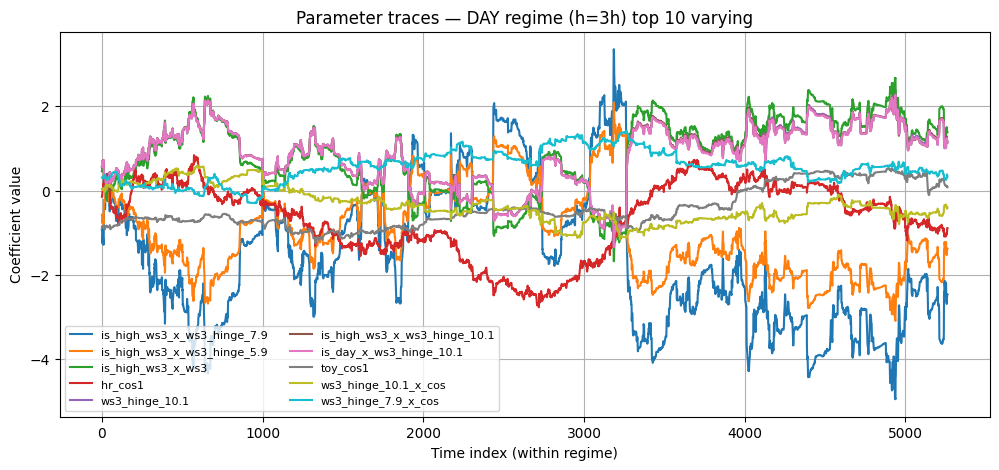

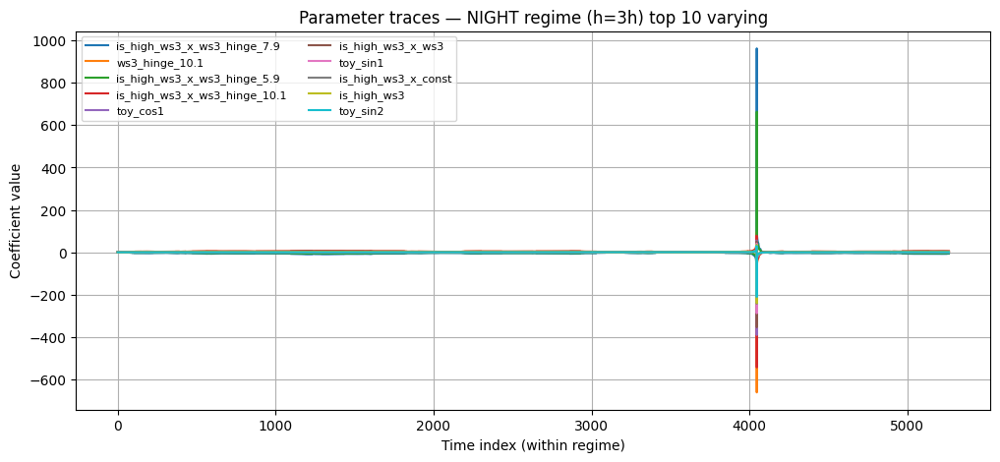

In [10]:
### Cell: Improve residual autocorrelation (low Ljung–Box p-values) by adding seasonal AR lags + regime structure

# ============================================================
# Why this improvement?
# - Very low Ljung–Box p-values mean residuals are still autocorrelated → missing dynamics.
# - Two common “missing pieces” in wind power hourly data:
#   (1) Seasonal AR structure (daily/weekly persistence): lag 24, 48, 168
#   (2) Regimes (day/night, high/low wind, directional sectors) with different dynamics.
#
# What we do here:
# 1) Add seasonal lags p_{t-(h+24)}, p_{t-(h+48)}, p_{t-(h+168)} as features (availability-correct).
# 2) Add regime indicators (day/night, high-wind) and allow key effects to shift via interactions.
# 3) Select per-horizon: single adaptive vs 2-regime adaptive using an inner validation split.
#    Selection uses a combined score: RMSE + alpha * penalty_for_low_LB_pvalue.
# ============================================================

# ---------------------------
# 0) Helper: Ljung–Box penalty score
# ---------------------------
def lb_pvalue(resid, lag=48):
    # returns p-value at specified lag (single number)
    out = acorr_ljungbox(resid, lags=[lag], return_df=True)
    return float(out["lb_pvalue"].iloc[0])

def selection_score(rmse_val, lb_p, alpha=0.10, eps=1e-12):
    """
    Lower is better.
    Penalize low LB p-values by adding alpha * (-log(p)).
    - If p is tiny, penalty is large.
    - alpha controls tradeoff with RMSE.
    """
    penalty = -np.log(max(lb_p, eps))
    return rmse_val + alpha * penalty


# ---------------------------
# 1) Add more lags up to weekly horizon + safety
# ---------------------------
MAX_LAG = 200  # needs to cover h+168 + a bit; 200 is safe
df3 = df.copy()

for k in range(1, MAX_LAG + 1):
    df3[f"p_lag{k}"] = df3["p"].shift(k)

df3 = df3.dropna().reset_index(drop=True)

train_df3, test_df3 = train_test_split_time(df3, train_frac=0.7)
train_in3, val_in3 = train_val_split_time(train_df3, val_frac=0.2)

P_MAX = float(df3["p"].max())

print("Train:", train_df3["t"].min(), "→", train_df3["t"].max())
print("Val  :", val_in3["t"].min(),  "→", val_in3["t"].max())
print("Test :", test_df3["t"].min(), "→", test_df3["t"].max())


# ---------------------------
# 2) Regime features (suspected regimes)
#    - day/night (boundary layer stability changes)
#    - high wind vs low wind (power curve region changes, control regimes)
# ---------------------------
def add_regimes(df_in):
    out = df_in.copy()

    # day regime
    hr = pd.to_datetime(out["t"]).dt.hour
    out["is_day"] = ((hr >= 6) & (hr < 18)).astype(int)

    # high-wind regime per horizon (threshold from Ws1 quantile; applied to Ws_h)
    # This is simple and robust: split around upper-middle to capture "near saturation" behavior.
    ws_thr = float(out["Ws1"].quantile(0.70))
    for h in [1, 2, 3]:
        out[f"is_high_ws{h}"] = (out[f"Ws{h}"] >= ws_thr).astype(int)

    return out

train_df3 = add_regimes(train_df3)
test_df3  = add_regimes(test_df3)
train_in3 = add_regimes(train_in3)
val_in3   = add_regimes(val_in3)


# ---------------------------
# 3) Design matrix v3: adds seasonal lags + regime interactions
# ---------------------------
def build_design_matrix_v3(
    df_in,
    h,
    knots,
    include_weekly=True,
    base_n_lags=3,
    include_seasonal_lags=True,
    include_regimes=True,
    regime_interactions=True
):
    """
    Key additions vs v2:
      - Seasonal AR lags: p_lag(h+24), p_lag(h+48), p_lag(h+168) (availability-correct)
      - Regime indicators:
          is_day
          is_high_ws{h}
        and (optionally) interactions with intercept, AR lags, and wind-speed basis.
    """
    out = df_in.copy()

    # -------- Weather basis (nonlinear)
    ws = out[f"Ws{h}"].astype(float).values
    ws_b = hinge_basis(ws, knots)

    cols = {"const": np.ones(len(out))}

    # -------- Base horizon-available lags: h, h+1, h+2,...
    lag_list = [h + i for i in range(base_n_lags) if (h + i) <= MAX_LAG]
    for L in lag_list:
        cols[f"p_lag{L}"] = out[f"p_lag{L}"].values

    # -------- Seasonal lags (daily/weekly persistence)
    if include_seasonal_lags:
        for L in [h + 24, h + 48, h + 168]:
            if L <= MAX_LAG:
                cols[f"p_lag{L}"] = out[f"p_lag{L}"].values

    # -------- Temperature + direction
    cols[f"T{h}_c"] = out[f"T{h}_c"].values
    cols[f"wd{h}_sin"] = out[f"wd{h}_sin"].values
    cols[f"wd{h}_cos"] = out[f"wd{h}_cos"].values

    # -------- Nonlinear Ws
    cols[f"ws{h}"] = ws_b[:, 0]
    for i, k in enumerate(knots, start=1):
        cols[f"ws{h}_hinge_{k:g}"] = ws_b[:, i]

    ws_names = [f"ws{h}"] + [f"ws{h}_hinge_{k:g}" for k in knots]

    # -------- Interactions Ws × direction
    for name in ws_names:
        cols[f"{name}_x_sin"] = cols[name] * cols[f"wd{h}_sin"]
        cols[f"{name}_x_cos"] = cols[name] * cols[f"wd{h}_cos"]

    # -------- Seasonality in mean (already motivated by your experiments)
    for k in [1, 2]:
        cols[f"toy_sin{k}"] = out[f"toy_sin{k}"].values
        cols[f"toy_cos{k}"] = out[f"toy_cos{k}"].values
        cols[f"hr_sin{k}"]  = out[f"hr_sin{k}"].values
        cols[f"hr_cos{k}"]  = out[f"hr_cos{k}"].values

    if include_weekly:
        cols["wk_sin1"] = out["wk_sin1"].values
        cols["wk_cos1"] = out["wk_cos1"].values

    # -------- Regime dummies (+ interactions)
    if include_regimes:
        cols["is_day"] = out["is_day"].values
        cols[f"is_high_ws{h}"] = out[f"is_high_ws{h}"].values

        if regime_interactions:
            # Let regime shift intercept + persistence + wind-speed curve
            # (kept light: interact regimes with AR lags and ws basis only)
            reg_names = ["is_day", f"is_high_ws{h}"]
            for r in reg_names:
                # intercept shift
                cols[f"{r}_x_const"] = cols[r] * cols["const"]
                # persistence shifts
                for L in lag_list:
                    cols[f"{r}_x_p_lag{L}"] = cols[r] * cols[f"p_lag{L}"]
                # seasonal lag shifts (if used)
                if include_seasonal_lags:
                    for L in [h + 24, h + 48, h + 168]:
                        if L <= MAX_LAG and f"p_lag{L}" in cols:
                            cols[f"{r}_x_p_lag{L}"] = cols[r] * cols[f"p_lag{L}"]
                # wind-speed curve shifts
                for name in ws_names:
                    cols[f"{r}_x_{name}"] = cols[r] * cols[name]

    X = pd.DataFrame(cols, index=out.index)
    y = out["p"].values.astype(float)
    return X, y


# ---------------------------
# 4) Selection: single adaptive vs 2-regime adaptive
#    Use combined score to prefer models that reduce autocorrelation (increase LB p-value).
# ---------------------------
LAM_GRID = [0.9995, 0.999, 0.997, 0.995, 0.993]
ALPHA = 0.12   # weight for autocorrelation penalty; increase if LB is a primary goal
LB_LAG = 48

def clip_pred(pred):
    return np.clip(pred, 0.0, P_MAX)

def fit_predict_rls_and_resid(Xtr, ytr, Xva, yva, lam):
    pred, trace, resid = rls_forgetting_fit_predict(Xtr, ytr, Xva, yva, lam=lam, delta=1e4)
    return pred, trace, resid

def eval_single_model(h, lam, clip=True):
    Xtr, ytr = build_design_matrix_v3(train_in3, h, knots, include_weekly=True,
                                      base_n_lags=3, include_seasonal_lags=True,
                                      include_regimes=True, regime_interactions=True)
    Xva, yva = build_design_matrix_v3(val_in3,   h, knots, include_weekly=True,
                                      base_n_lags=3, include_seasonal_lags=True,
                                      include_regimes=True, regime_interactions=True)

    pred, trace, resid = fit_predict_rls_and_resid(Xtr, ytr, Xva, yva, lam)
    if clip:
        pred = clip_pred(pred)
        resid = yva - pred

    r = rmse(yva, pred)
    p = lb_pvalue(resid, lag=LB_LAG)
    sc = selection_score(r, p, alpha=ALPHA)
    return {"kind":"single", "h":h, "lam":lam, "clip":clip, "rmse":r, "lb_p":p, "score":sc}

def eval_two_regime_model(h, lam, clip=True):
    # split by day/night on inner train/val
    m_tr_day = is_day_hour(train_in3["t"])
    m_va_day = is_day_hour(val_in3["t"])

    tr_day, tr_night = train_in3[m_tr_day].copy(), train_in3[~m_tr_day].copy()
    va_day, va_night = val_in3[m_va_day].copy(),   val_in3[~m_va_day].copy()

    Xd_tr, yd_tr = build_design_matrix_v3(tr_day,   h, knots, include_weekly=True,
                                          base_n_lags=3, include_seasonal_lags=True,
                                          include_regimes=True, regime_interactions=True)
    Xn_tr, yn_tr = build_design_matrix_v3(tr_night, h, knots, include_weekly=True,
                                          base_n_lags=3, include_seasonal_lags=True,
                                          include_regimes=True, regime_interactions=True)

    Xd_va, yd_va = build_design_matrix_v3(va_day,   h, knots, include_weekly=True,
                                          base_n_lags=3, include_seasonal_lags=True,
                                          include_regimes=True, regime_interactions=True)
    Xn_va, yn_va = build_design_matrix_v3(va_night, h, knots, include_weekly=True,
                                          base_n_lags=3, include_seasonal_lags=True,
                                          include_regimes=True, regime_interactions=True)

    pred_d, _, _ = fit_predict_rls_and_resid(Xd_tr, yd_tr, Xd_va, yd_va, lam)
    pred_n, _, _ = fit_predict_rls_and_resid(Xn_tr, yn_tr, Xn_va, yn_va, lam)

    # stitch back to the validation index order
    pred_full = pd.Series(index=val_in3.index, dtype=float)
    pred_full.loc[va_day.index] = pred_d
    pred_full.loc[va_night.index] = pred_n
    pred_full = pred_full.sort_index().values
    yva_full = val_in3["p"].values.astype(float)

    if clip:
        pred_full = clip_pred(pred_full)

    resid = yva_full - pred_full
    r = rmse(yva_full, pred_full)
    p = lb_pvalue(resid, lag=LB_LAG)
    sc = selection_score(r, p, alpha=ALPHA)
    return {"kind":"2-regime(day/night)", "h":h, "lam":lam, "clip":clip, "rmse":r, "lb_p":p, "score":sc}

# Run selection per horizon
chosen = {}
sel_rows = []

for h in [1, 2, 3]:
    best = None
    for lam in LAM_GRID:
        cand1 = eval_single_model(h, lam, clip=True)
        cand2 = eval_two_regime_model(h, lam, clip=True)

        for cand in [cand1, cand2]:
            sel_rows.append(cand)
            if best is None or cand["score"] < best["score"]:
                best = cand
    chosen[h] = best

sel_df = pd.DataFrame(sel_rows).sort_values(["h","score"]).reset_index(drop=True)
print("Top selections by score (per horizon):")
display(sel_df.groupby("h").head(5))

print("\nChosen config:")
display(pd.DataFrame([chosen[h] for h in [1,2,3]]))


# ---------------------------
# 5) Refit on full train_df3 and evaluate on test_df3 with chosen configs
# ---------------------------
final_rows = []
final_pack = {}

for h in [1, 2, 3]:
    cfg = chosen[h]
    lam = cfg["lam"]
    clip = cfg["clip"]

    if cfg["kind"] == "single":
        Xtr, ytr = build_design_matrix_v3(train_df3, h, knots, include_weekly=True,
                                          base_n_lags=3, include_seasonal_lags=True,
                                          include_regimes=True, regime_interactions=True)
        Xte, yte = build_design_matrix_v3(test_df3,  h, knots, include_weekly=True,
                                          base_n_lags=3, include_seasonal_lags=True,
                                          include_regimes=True, regime_interactions=True)
        pred, trace, resid = rls_forgetting_fit_predict(Xtr, ytr, Xte, yte, lam=lam, delta=1e4)
        if clip:
            pred = clip_pred(pred)
        resid = yte - pred

        final_pack[h] = {"kind": cfg["kind"], "t": test_df3["t"].values, "y": yte, "pred": pred,
                         "resid": resid, "trace": trace, "names": Xte.columns.tolist()}

    else:
        # 2-regime day/night: fit two RLS models and stitch on test
        m_tr_day = is_day_hour(train_df3["t"])
        m_te_day = is_day_hour(test_df3["t"])

        tr_day, tr_night = train_df3[m_tr_day].copy(), train_df3[~m_tr_day].copy()
        te_day, te_night = test_df3[m_te_day].copy(),  test_df3[~m_te_day].copy()

        Xd_tr, yd_tr = build_design_matrix_v3(tr_day,   h, knots, include_weekly=True,
                                              base_n_lags=3, include_seasonal_lags=True,
                                              include_regimes=True, regime_interactions=True)
        Xn_tr, yn_tr = build_design_matrix_v3(tr_night, h, knots, include_weekly=True,
                                              base_n_lags=3, include_seasonal_lags=True,
                                              include_regimes=True, regime_interactions=True)

        Xd_te, yd_te = build_design_matrix_v3(te_day,   h, knots, include_weekly=True,
                                              base_n_lags=3, include_seasonal_lags=True,
                                              include_regimes=True, regime_interactions=True)
        Xn_te, yn_te = build_design_matrix_v3(te_night, h, knots, include_weekly=True,
                                              base_n_lags=3, include_seasonal_lags=True,
                                              include_regimes=True, regime_interactions=True)

        pred_d, trace_d, _ = rls_forgetting_fit_predict(Xd_tr, yd_tr, Xd_te, yd_te, lam=lam, delta=1e4)
        pred_n, trace_n, _ = rls_forgetting_fit_predict(Xn_tr, yn_tr, Xn_te, yn_te, lam=lam, delta=1e4)

        pred_full = pd.Series(index=test_df3.index, dtype=float)
        pred_full.loc[te_day.index] = pred_d
        pred_full.loc[te_night.index] = pred_n
        pred_full = pred_full.sort_index().values

        if clip:
            pred_full = clip_pred(pred_full)

        yte = test_df3["p"].values.astype(float)
        resid = yte - pred_full

        final_pack[h] = {"kind": cfg["kind"], "t": test_df3["t"].values, "y": yte, "pred": pred_full,
                         "resid": resid,
                         "trace_day": trace_d, "names_day": Xd_te.columns.tolist(),
                         "trace_night": trace_n, "names_night": Xn_te.columns.tolist()}

    # baselines for comparison
    y_persist = test_df3[f"p_lag{h}"].values
    rmse_p = rmse(final_pack[h]["y"], y_persist)
    rmse_m = rmse(final_pack[h]["y"], final_pack[h]["pred"])
    lbp = lb_pvalue(final_pack[h]["resid"], lag=LB_LAG)

    final_rows.append({
        "h": h,
        "chosen_kind": cfg["kind"],
        "lambda": lam,
        "RMSE": rmse_m,
        "MAE": mae(final_pack[h]["y"], final_pack[h]["pred"]),
        "LB_pvalue_lag48": lbp,
        "RMSE_persistence": rmse_p,
        "Skill_vs_persistence": 1.0 - (rmse_m / rmse_p),
    })

final_df = pd.DataFrame(final_rows).sort_values("h")
print("Final test metrics (note LB p-values):")
display(final_df)


# ---------------------------
# 6) Diagnostics + parameter traces
# ---------------------------
for h in [1, 2, 3]:
    pack = final_pack[h]
    t = pack["t"]
    y = pack["y"]
    pred = pack["pred"]

    plt.figure(figsize=(12, 4))
    plt.plot(t, y, label="True")
    plt.plot(t, pred, label="Pred")
    plt.title(f"Final model — True vs Pred (h={h}h, {pack['kind']})")
    plt.xlabel("Time")
    plt.ylabel("Power (kW)")
    plt.legend()
    plt.show()

    _ = residual_diagnostics(y, pred, title_prefix=f"Final model (h={h}h, {pack['kind']})", lags=48)

    # Parameter traces:
    if pack["kind"] == "single":
        adaptive_traces[h] = {
            "names": pack["names"],
            "trace": pack["trace"],
            "t": t,
            "pred": pred,
            "y": y,
            "resid": pack["resid"],
        }
        plot_param_traces(h, top_k=12)
    else:
        # For 2-regime, show day and night traces separately (top varying)
        def plot_regime_traces(trace, names, regime_label, top_k=10):
            trace_df = pd.DataFrame(trace, columns=names)
            pick = trace_df.std().sort_values(ascending=False).head(top_k).index.tolist()
            plt.figure(figsize=(12, 5))
            for c in pick:
                plt.plot(trace_df[c].values, label=c)
            plt.title(f"Parameter traces — {regime_label} (h={h}h) top {top_k} varying")
            plt.xlabel("Time index (within regime)")
            plt.ylabel("Coefficient value")
            plt.legend(fontsize=8, ncol=2)
            plt.show()

        plot_regime_traces(pack["trace_day"], pack["names_day"], "DAY regime", top_k=10)
        plot_regime_traces(pack["trace_night"], pack["names_night"], "NIGHT regime", top_k=10)


C:\Users\tata\AppData\Local\Temp\ipykernel_4744\1461975546.py:34: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_tarso[f"p_lag{k}"] = df_tarso["p"].shift(k)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\1461975546.py:34: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_tarso[f"p_lag{k}"] = df_tarso["p"].shift(k)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\1461975546.py:34: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Con

Train: 1999-01-09 11:00:00 → 2002-01-22 09:00:00
Val  : 2001-06-10 11:00:00 → 2002-01-22 09:00:00
Test : 2002-01-22 10:00:00 → 2003-04-30 23:00:00


C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  denom = lam + float(x.T @ P @ x)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  err = y - float(theta.reshape(1, -1) @ x)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:42: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  preds[t] = float(theta.reshape(1, -1) @ x)
C:\Users\tata\A

Top 5 candidates per horizon by score:


,h,cut,lam,rmse,lb_p,score,kind,clip
0,1,150.0,0.995,1.376027,1.774718e-06,3.362307,TARSO-dir,True
1,1,330.0,0.995,1.376027,1.774718e-06,3.362307,TARSO-dir,True
2,1,150.0,0.993,1.394690,2.009509e-06,3.362333,TARSO-dir,True
3,1,330.0,0.993,1.394690,2.009509e-06,3.362333,TARSO-dir,True
4,1,0.0,0.995,1.373349,1.266874e-06,3.410193,TARSO-dir,True
65,2,0.0,0.995,1.814938,2.501378e-225,5.959591,TARSO-dir,True
66,2,180.0,0.995,1.814938,2.501378e-225,5.959591,TARSO-dir,True
67,2,0.0,0.993,1.817117,1.310073e-211,5.961770,TARSO-dir,True
68,2,180.0,0.993,1.817117,1.310073e-211,5.961770,TARSO-dir,True
69,2,0.0,0.997,1.817286,8.329191e-241,5.961939,TARSO-dir,True



Chosen per horizon:


,h,cut,lam,rmse,lb_p,score,kind,clip
0,1,150.0,0.995,1.376027,1.774718e-06,3.362307,TARSO-dir,True
1,2,0.0,0.995,1.814938,2.501378e-225,5.959591,TARSO-dir,True
2,3,0.0,0.993,1.994031,0.000000e+00,6.138684,TARSO-dir,True


C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  denom = lam + float(x.T @ P @ x)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  err = y - float(theta.reshape(1, -1) @ x)
C:\Users\tata\AppData\Local\Temp\ipykernel_4744\3480831153.py:42: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  preds[t] = float(theta.reshape(1, -1) @ x)
C:\Users\tata\A

Final test metrics:


,h,chosen_kind,cut_deg,lambda,RMSE,MAE,LB_pvalue_lag48,RMSE_persistence,Skill_vs_persistence
0,1,TARSO-dir,150.0,0.995,1.505926,0.972898,2.588265e-08,1.653773,0.089399
1,2,TARSO-dir,0.0,0.995,1.943634,1.293787,0.000000e+00,2.492154,0.220099
2,3,TARSO-dir,0.0,0.993,2.073499,1.395163,0.000000e+00,3.086808,0.328271


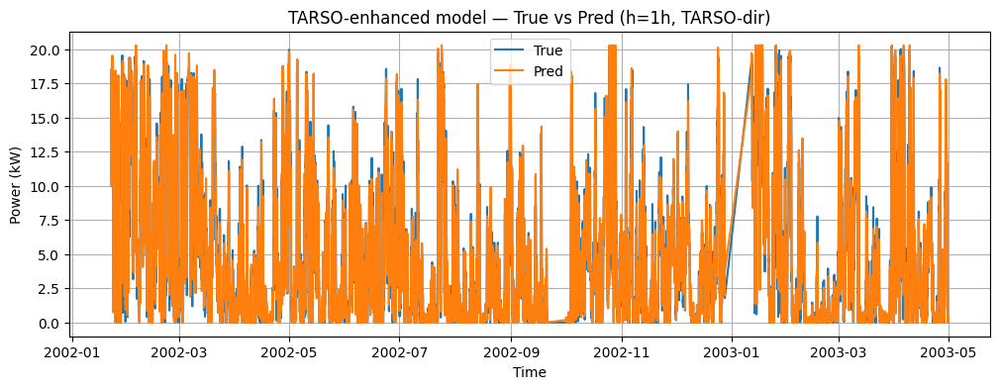

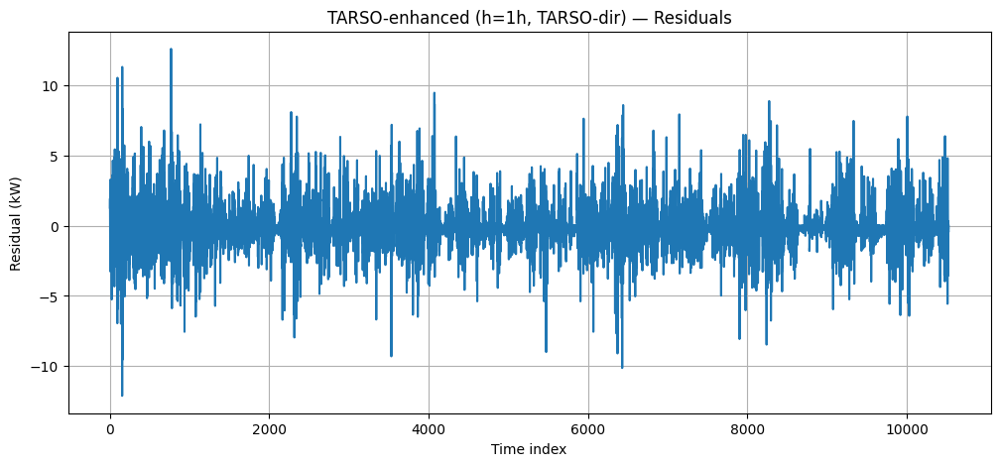

<Figure size 1200x500 with 0 Axes>

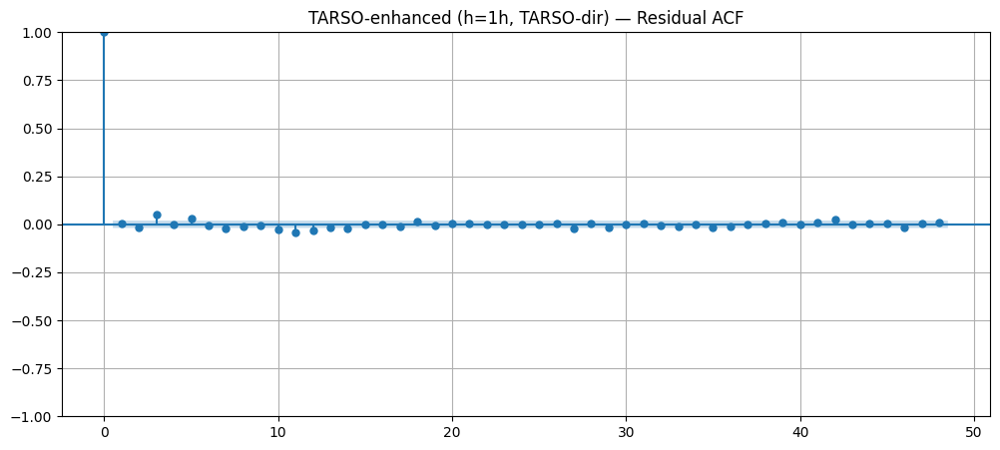

<Figure size 1200x500 with 0 Axes>

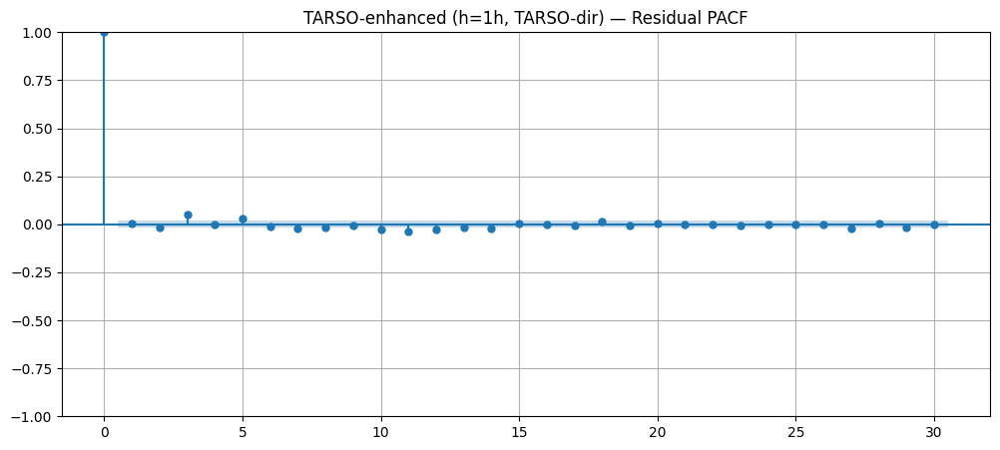

TARSO-enhanced (h=1h, TARSO-dir) — Ljung–Box p-values:


,lb_stat,lb_pvalue
12,80.823266,2.874318e-12
24,94.629152,2.437061e-10
48,121.593873,2.588265e-08


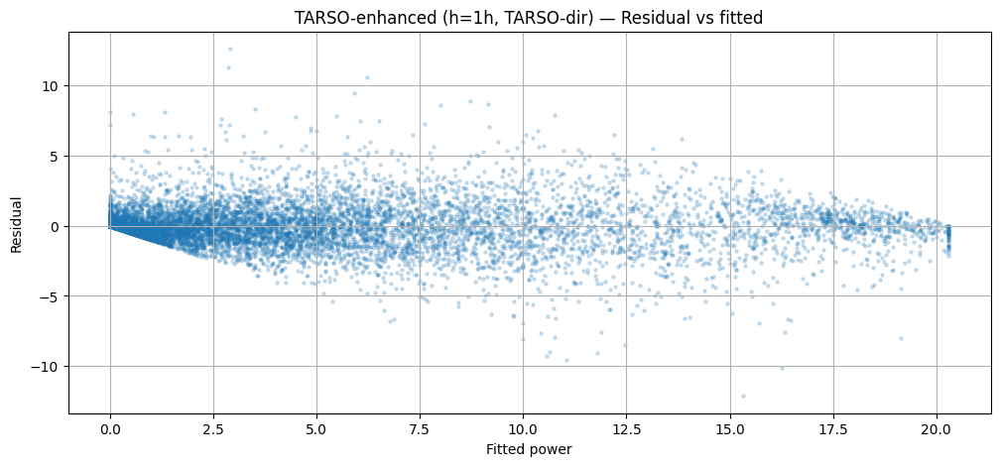

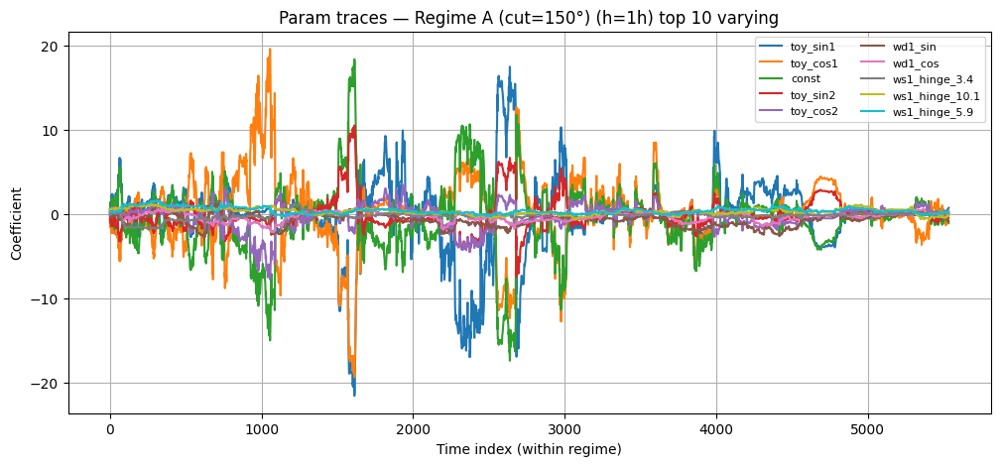

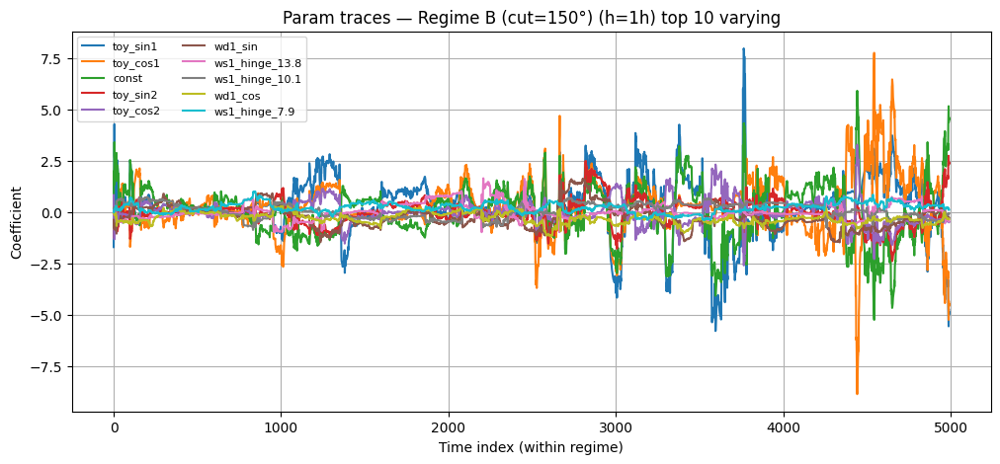

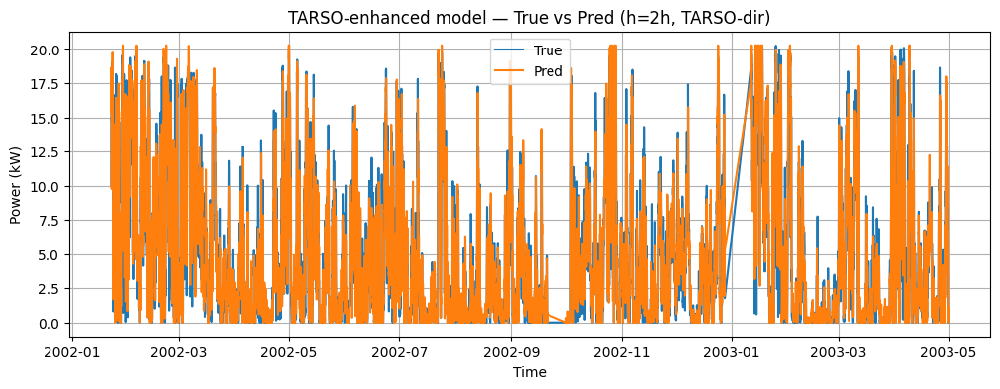

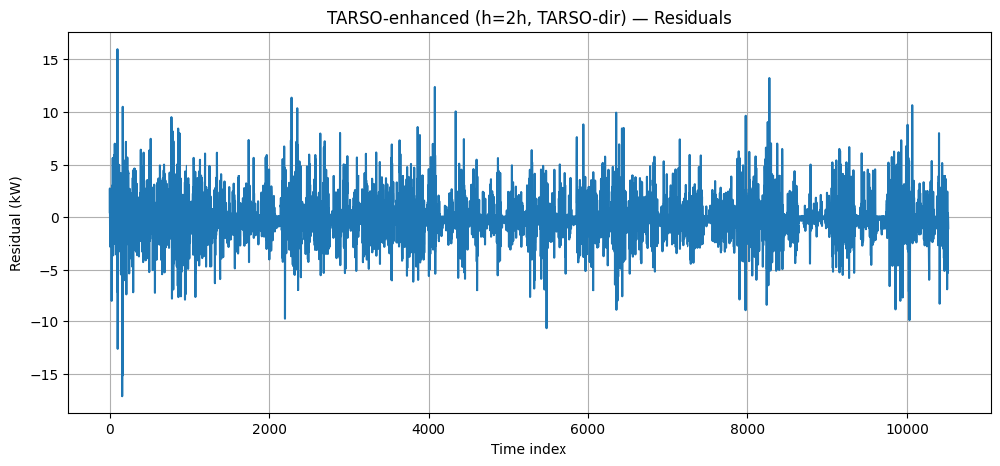

<Figure size 1200x500 with 0 Axes>

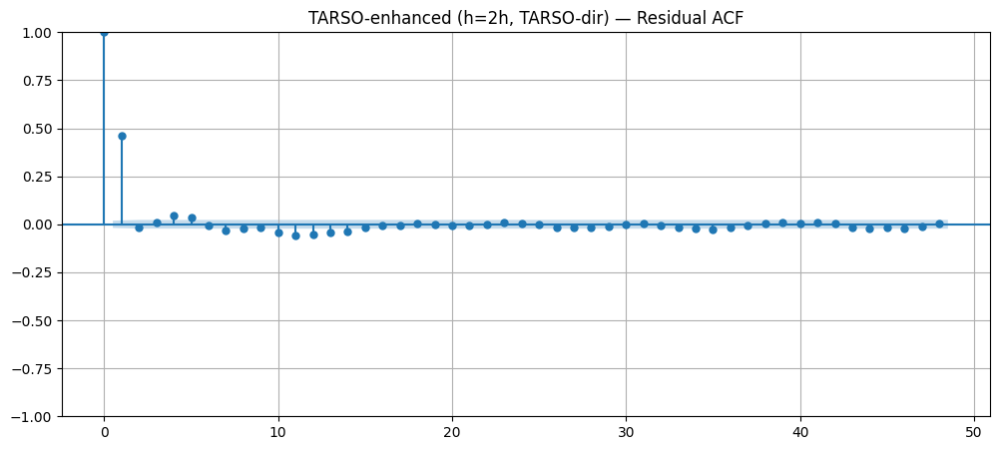

<Figure size 1200x500 with 0 Axes>

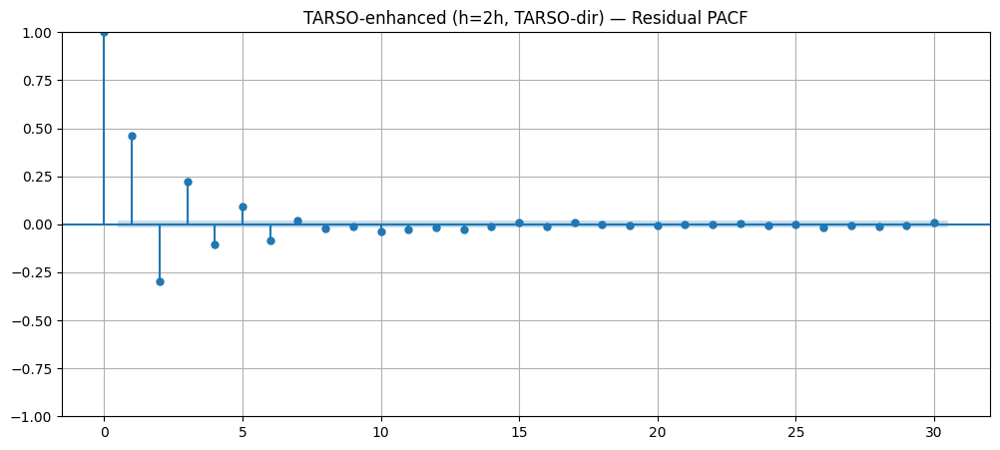

TARSO-enhanced (h=2h, TARSO-dir) — Ljung–Box p-values:


,lb_stat,lb_pvalue
12,2396.784421,0.0
24,2435.591131,0.0
48,2485.207309,0.0


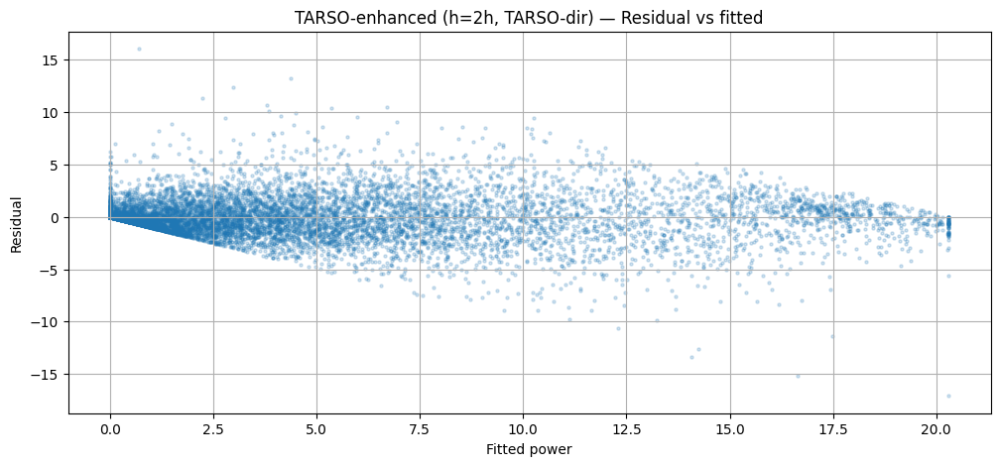

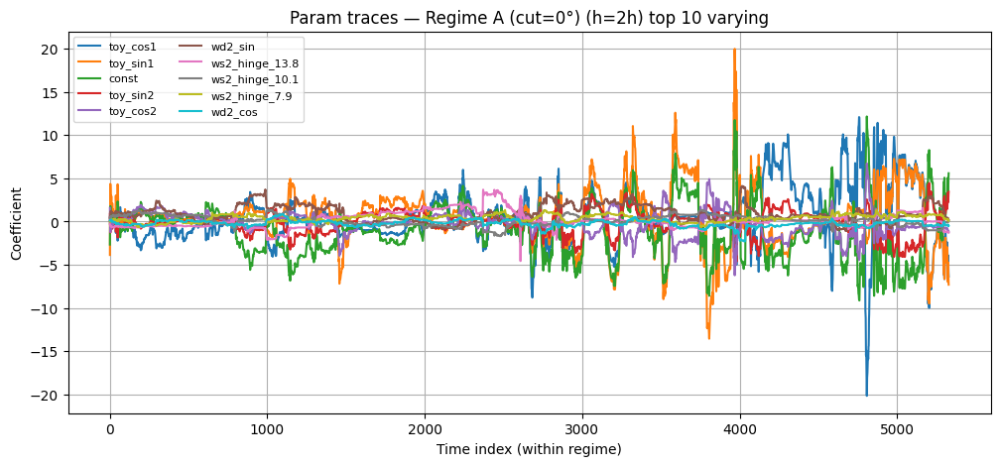

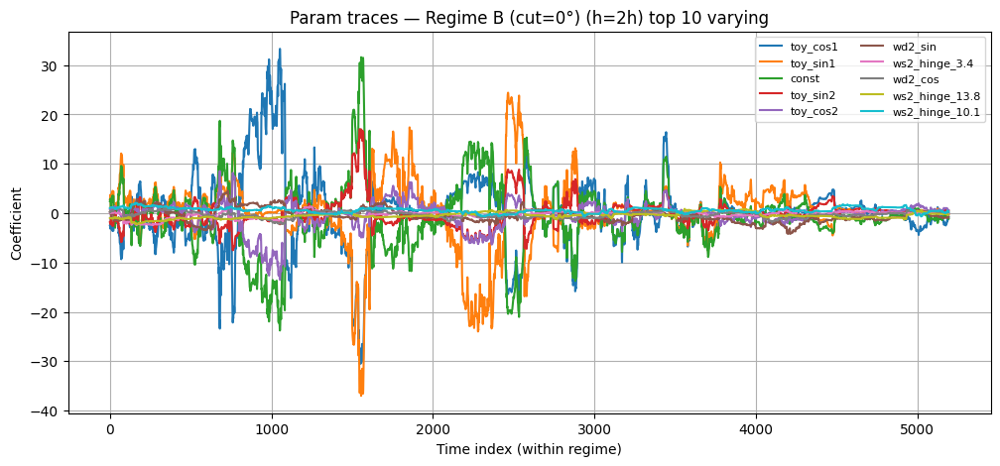

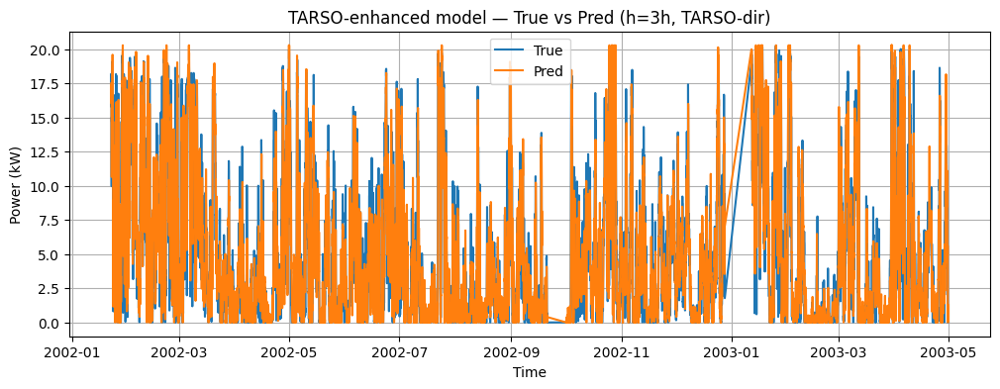

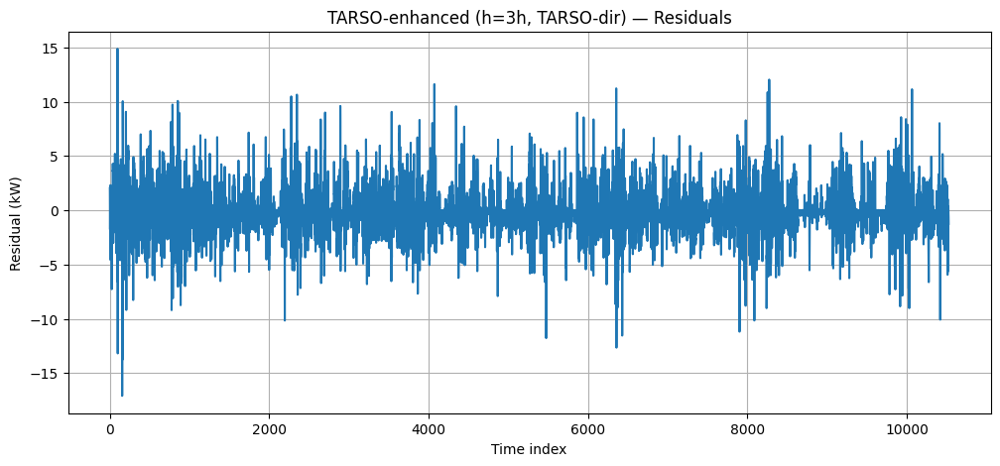

<Figure size 1200x500 with 0 Axes>

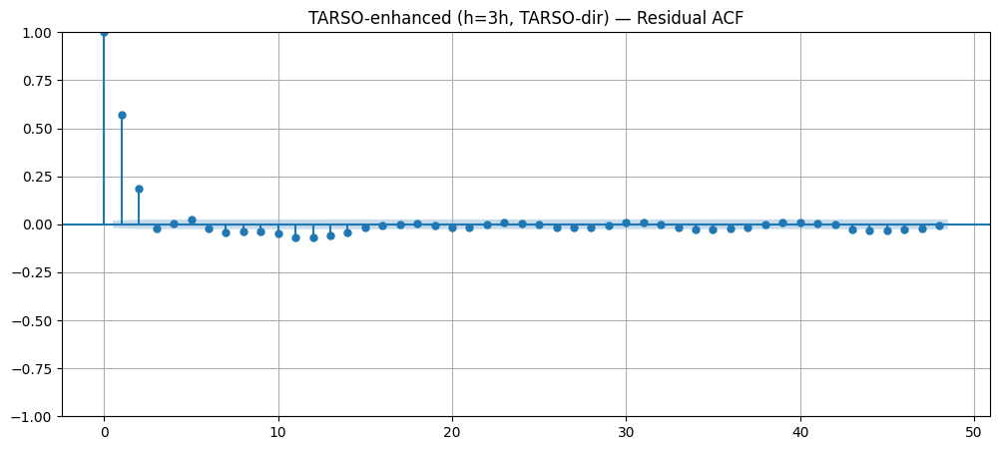

<Figure size 1200x500 with 0 Axes>

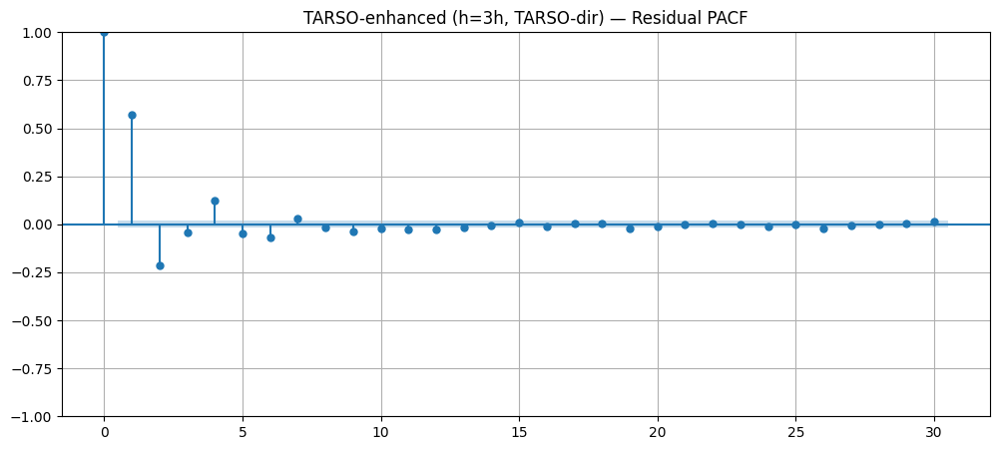

TARSO-enhanced (h=3h, TARSO-dir) — Ljung–Box p-values:


,lb_stat,lb_pvalue
12,3984.608046,0.0
24,4051.060535,0.0
48,4136.588108,0.0


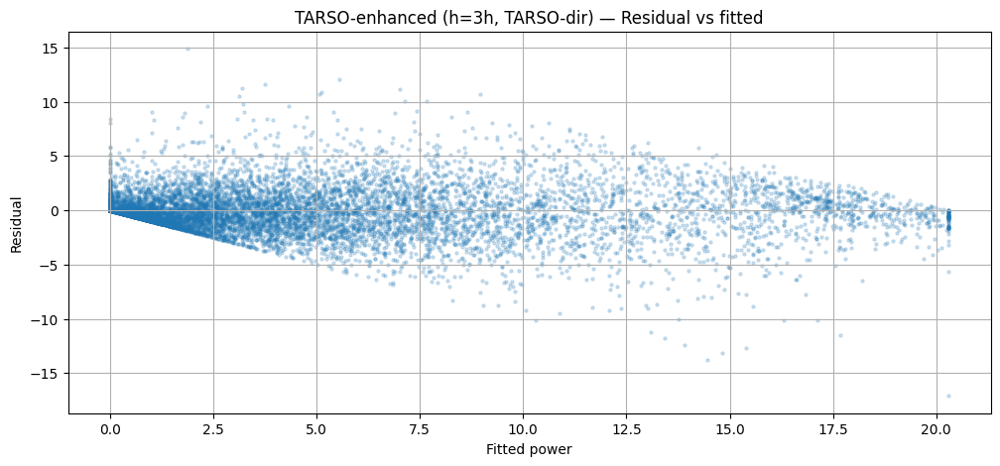

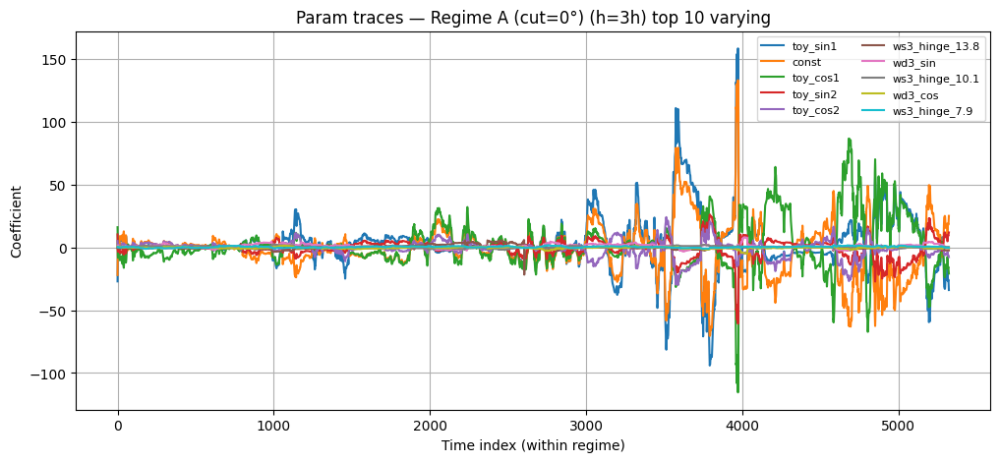

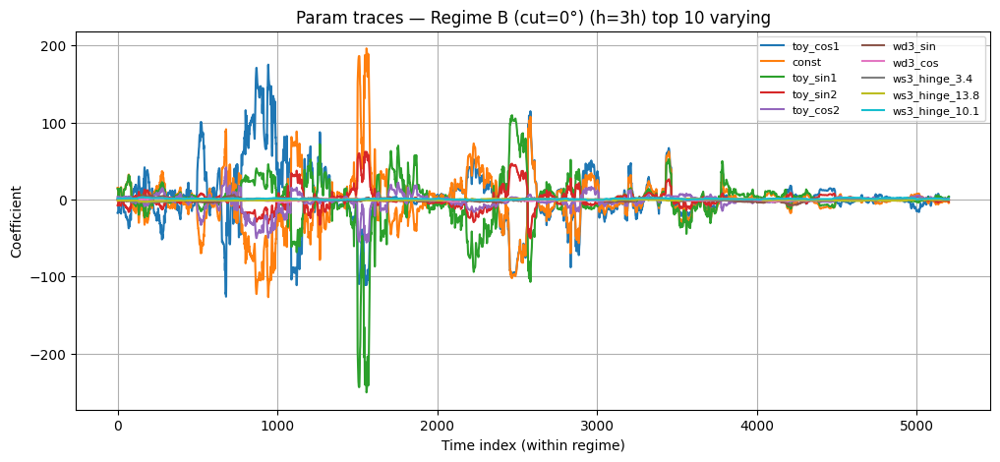

In [11]:
### Cell: TARSO-style regime switching (wind direction) + seasonal lags + safer parameterization (targets low LB p-values)
# -----------------------------------------------------------------------------
# What this cell does (continuation):
# 1) Builds a TARSO-like 2-regime model where the regime is determined by wind direction Wd_h.
#    - We avoid 8 hard sectors (too many parameters) and instead do 2 regimes (A/B) using a circular cut.
#    - We grid-search the cut direction to find the best split.
# 2) Uses an "adaptive within regime" approach (RLS with forgetting) with per-horizon lambda tuning.
# 3) Includes seasonal AR lags: p_lag(h+24), p_lag(h+48), p_lag(h+168).
# 4) Uses a reduced interaction set to stabilize parameters (important at h=3).
# 5) Selects the best configuration by a combined objective:
#       score = RMSE + alpha * (-log(LB_pvalue_at_lag48))
#    to explicitly reward whitening the residuals.
# -----------------------------------------------------------------------------

# ---------------------------
# 0) Safety checks: requires prior cells defining:
#    df, hinge_basis, knots, rls_forgetting_fit_predict, train_test_split_time, train_val_split_time,
#    rmse, mae, lb_pvalue, selection_score, clip_pred, add_regimes, is_day_hour
# ---------------------------
needed = [
    "hinge_basis","knots","rls_forgetting_fit_predict","train_test_split_time","train_val_split_time",
    "rmse","mae","lb_pvalue","selection_score","clip_pred"
]
missing_needed = [n for n in needed if n not in globals()]
if missing_needed:
    raise RuntimeError(f"Missing prerequisites from earlier cells: {missing_needed}")

# ---------------------------
# 1) Rebuild lagged dataset with enough depth for weekly lags
# ---------------------------
MAX_LAG = 200  # enough for h+168 and a little extra
df_tarso = df.copy()
for k in range(1, MAX_LAG + 1):
    df_tarso[f"p_lag{k}"] = df_tarso["p"].shift(k)
df_tarso = df_tarso.dropna().reset_index(drop=True)

train_dfT, test_dfT = train_test_split_time(df_tarso, train_frac=0.7)
train_inT, val_inT = train_val_split_time(train_dfT, val_frac=0.2)

P_MAX = float(df_tarso["p"].max())

print("Train:", train_dfT["t"].min(), "→", train_dfT["t"].max())
print("Val  :", val_inT["t"].min(),  "→", val_inT["t"].max())
print("Test :", test_dfT["t"].min(), "→", test_dfT["t"].max())

# ---------------------------
# 2) Ensure seasonal/diurnal + direction sin/cos + centered temperature exist on these frames
#    (If you already computed these on df, they should carry through; this just guards.)
# ---------------------------
def ensure_time_and_dir_features(df_in):
    out = df_in.copy()
    out["hour"] = pd.to_datetime(out["t"]).dt.hour.astype(int)

    YEAR = 365.25
    if "toy_rad" not in out.columns:
        out["toy_rad"] = 2 * np.pi * (out["toy"] % YEAR) / YEAR
    if "hour_rad" not in out.columns:
        out["hour_rad"] = 2 * np.pi * out["hour"] / 24.0

    if "time_idx" not in out.columns:
        out["time_idx"] = np.arange(len(out))
    if "week_rad" not in out.columns:
        out["week_rad"] = 2 * np.pi * (out["time_idx"] % (24*7)) / (24*7)

    def add_fourier_local(out, rad_col, K, prefix):
        for k in range(1, K+1):
            out[f"{prefix}_sin{k}"] = np.sin(k * out[rad_col])
            out[f"{prefix}_cos{k}"] = np.cos(k * out[rad_col])
        return out

    out = add_fourier_local(out, "toy_rad",  K=2, prefix="toy")
    out = add_fourier_local(out, "hour_rad", K=2, prefix="hr")
    out = add_fourier_local(out, "week_rad", K=1, prefix="wk")

    # centered temperature
    for h in [1,2,3]:
        if f"T{h}_c" not in out.columns:
            out[f"T{h}_c"] = out[f"T{h}"] - out[f"T{h}"].mean()

    # direction sin/cos
    for h in [1,2,3]:
        if f"wd{h}_sin" not in out.columns or f"wd{h}_cos" not in out.columns:
            rad = np.deg2rad(out[f"Wd{h}"] % 360.0)
            out[f"wd{h}_sin"] = np.sin(rad)
            out[f"wd{h}_cos"] = np.cos(rad)

    return out

train_dfT = ensure_time_and_dir_features(train_dfT)
test_dfT  = ensure_time_and_dir_features(test_dfT)
train_inT = ensure_time_and_dir_features(train_inT)
val_inT   = ensure_time_and_dir_features(val_inT)

# ---------------------------
# 3) TARSO regime definition for circular direction
#    Two regimes separated by a "cut angle" c:
#      Regime A: angles within [c, c+180)  (half-circle)
#      Regime B: the opposite half-circle
#    This respects circularity much better than naive "Wd < c".
# ---------------------------
def half_circle_regime(angle_deg, cut_deg):
    """
    angle_deg: array-like in [0,360)
    cut_deg: scalar in [0,360)
    Returns boolean mask for Regime A (True) vs Regime B (False)
    """
    a = np.asarray(angle_deg) % 360.0
    c = float(cut_deg) % 360.0
    # Compute circular distance from cut along positive direction
    d = (a - c) % 360.0
    return d < 180.0  # in first half-circle

# Candidate cut angles (coarse grid; you can refine later)
CUT_GRID = np.arange(0, 360, 30)  # 12 candidates; stable and not too expensive

# ---------------------------
# 4) Design matrix (stabilized): seasonal lags + limited interactions
#    Rationale: At h=3, too many regime interactions can cause "problematic parameters".
#    So we:
#      - keep AR lags (h, h+1, h+2) + seasonal (h+24, h+168) (+ optionally h+48)
#      - keep nonlinear Ws basis
#      - keep direction sin/cos
#      - keep ONLY the simplest Ws×direction interaction (ws * sin/cos), not every hinge×sin/cos
# -----------------------------------------------------------------------------
def build_design_matrix_tarso(df_in, h, knots, base_n_lags=3, use_lag48=True):
    out = df_in.copy()

    ws = out[f"Ws{h}"].astype(float).values
    ws_b = hinge_basis(ws, knots)

    cols = {"const": np.ones(len(out))}

    # Base horizon-available short lags
    lag_list = [h + i for i in range(base_n_lags) if (h + i) <= MAX_LAG]
    for L in lag_list:
        cols[f"p_lag{L}"] = out[f"p_lag{L}"].values

    # Seasonal lags
    for L in [h + 24, h + 168]:
        if L <= MAX_LAG:
            cols[f"p_lag{L}"] = out[f"p_lag{L}"].values
    if use_lag48:
        L = h + 48
        if L <= MAX_LAG:
            cols[f"p_lag{L}"] = out[f"p_lag{L}"].values

    # Weather: temp + direction + nonlinear Ws
    cols[f"T{h}_c"] = out[f"T{h}_c"].values
    cols[f"wd{h}_sin"] = out[f"wd{h}_sin"].values
    cols[f"wd{h}_cos"] = out[f"wd{h}_cos"].values

    cols[f"ws{h}"] = ws_b[:, 0]
    for i, k in enumerate(knots, start=1):
        cols[f"ws{h}_hinge_{k:g}"] = ws_b[:, i]

    # Limited interaction: only ws * sin/cos (keeps directional modulation without blowing up)
    cols[f"ws{h}_x_sin"] = cols[f"ws{h}"] * cols[f"wd{h}_sin"]
    cols[f"ws{h}_x_cos"] = cols[f"ws{h}"] * cols[f"wd{h}_cos"]

    # Seasonality regressors (mean)
    for k in [1, 2]:
        cols[f"toy_sin{k}"] = out[f"toy_sin{k}"].values
        cols[f"toy_cos{k}"] = out[f"toy_cos{k}"].values
        cols[f"hr_sin{k}"]  = out[f"hr_sin{k}"].values
        cols[f"hr_cos{k}"]  = out[f"hr_cos{k}"].values

    # Weekly harmonic (helps mean; keep)
    cols["wk_sin1"] = out["wk_sin1"].values
    cols["wk_cos1"] = out["wk_cos1"].values

    X = pd.DataFrame(cols, index=out.index)
    y = out["p"].values.astype(float)
    return X, y

# ---------------------------
# 5) Evaluate TARSO (2 regimes) on validation for each (h, cut, lambda)
#    Objective: minimize score = RMSE + ALPHA * (-log(LB_pvalue))
# -----------------------------------------------------------------------------
ALPHA = 0.15
LB_LAG = 48
LAM_GRID = [0.9995, 0.999, 0.997, 0.995, 0.993]

def eval_tarso_dir(h, cut_deg, lam, clip=True):
    # build regime masks on validation and training using Wd_h (available at origin for that horizon)
    tr_maskA = half_circle_regime(train_inT[f"Wd{h}"].values, cut_deg)
    va_maskA = half_circle_regime(val_inT[f"Wd{h}"].values, cut_deg)

    trA = train_inT.loc[train_inT.index[tr_maskA]].copy()
    trB = train_inT.loc[train_inT.index[~tr_maskA]].copy()
    vaA = val_inT.loc[val_inT.index[va_maskA]].copy()
    vaB = val_inT.loc[val_inT.index[~va_maskA]].copy()

    # If a regime is too small, skip (stability)
    min_n = 300
    if min(len(trA), len(trB), len(vaA), len(vaB)) < min_n:
        return None

    XA_tr, yA_tr = build_design_matrix_tarso(trA, h, knots, base_n_lags=3, use_lag48=True)
    XB_tr, yB_tr = build_design_matrix_tarso(trB, h, knots, base_n_lags=3, use_lag48=True)

    XA_va, yA_va = build_design_matrix_tarso(vaA, h, knots, base_n_lags=3, use_lag48=True)
    XB_va, yB_va = build_design_matrix_tarso(vaB, h, knots, base_n_lags=3, use_lag48=True)

    predA, _, _ = rls_forgetting_fit_predict(XA_tr, yA_tr, XA_va, yA_va, lam=lam, delta=1e4)
    predB, _, _ = rls_forgetting_fit_predict(XB_tr, yB_tr, XB_va, yB_va, lam=lam, delta=1e4)

    # stitch in original validation order
    pred_full = pd.Series(index=val_inT.index, dtype=float)
    pred_full.loc[vaA.index] = predA
    pred_full.loc[vaB.index] = predB
    pred_full = pred_full.sort_index().values

    y_true = val_inT["p"].values.astype(float)

    if clip:
        pred_full = np.clip(pred_full, 0.0, P_MAX)

    resid = y_true - pred_full
    r = rmse(y_true, pred_full)
    p = lb_pvalue(resid, lag=LB_LAG)
    sc = selection_score(r, p, alpha=ALPHA)

    return {"h":h, "cut":float(cut_deg), "lam":lam, "rmse":r, "lb_p":p, "score":sc, "kind":"TARSO-dir", "clip":clip}

def eval_single_stable(h, lam, clip=True):
    Xtr, ytr = build_design_matrix_tarso(train_inT, h, knots, base_n_lags=3, use_lag48=True)
    Xva, yva = build_design_matrix_tarso(val_inT,   h, knots, base_n_lags=3, use_lag48=True)

    pred, trace, resid = rls_forgetting_fit_predict(Xtr, ytr, Xva, yva, lam=lam, delta=1e4)
    if clip:
        pred = np.clip(pred, 0.0, P_MAX)
    resid = yva - pred

    r = rmse(yva, pred)
    p = lb_pvalue(resid, lag=LB_LAG)
    sc = selection_score(r, p, alpha=ALPHA)
    return {"h":h, "cut":None, "lam":lam, "rmse":r, "lb_p":p, "score":sc, "kind":"single-stable", "clip":clip}

# ---------------------------
# 6) Model selection per horizon: compare stable single vs TARSO-dir
# -----------------------------------------------------------------------------
cand_rows = []
chosen_tarso = {}

for h in [1,2,3]:
    best = None

    for lam in LAM_GRID:
        # baseline single (stabilized feature set + seasonal lags)
        c0 = eval_single_stable(h, lam, clip=True)
        cand_rows.append(c0)
        if best is None or c0["score"] < best["score"]:
            best = c0

        # TARSO direction split grid
        for cut in CUT_GRID:
            c = eval_tarso_dir(h, cut, lam, clip=True)
            if c is None:
                continue
            cand_rows.append(c)
            if c["score"] < best["score"]:
                best = c

    chosen_tarso[h] = best

cand_df = pd.DataFrame(cand_rows).sort_values(["h","score"]).reset_index(drop=True)
print("Top 5 candidates per horizon by score:")
display(cand_df.groupby("h").head(5))

print("\nChosen per horizon:")
display(pd.DataFrame([chosen_tarso[h] for h in [1,2,3]]))

# ---------------------------
# 7) Refit chosen models on full training and evaluate on test
# -----------------------------------------------------------------------------
final_rows = []
final_pack = {}

for h in [1,2,3]:
    cfg = chosen_tarso[h]
    lam = cfg["lam"]
    clip = cfg["clip"]

    if cfg["kind"] == "single-stable":
        Xtr, ytr = build_design_matrix_tarso(train_dfT, h, knots, base_n_lags=3, use_lag48=True)
        Xte, yte = build_design_matrix_tarso(test_dfT,  h, knots, base_n_lags=3, use_lag48=True)

        pred, trace, _ = rls_forgetting_fit_predict(Xtr, ytr, Xte, yte, lam=lam, delta=1e4)
        if clip:
            pred = np.clip(pred, 0.0, P_MAX)
        resid = yte - pred

        final_pack[h] = {
            "kind": cfg["kind"], "t": test_dfT["t"].values, "y": yte, "pred": pred, "resid": resid,
            "trace": trace, "names": Xte.columns.tolist(), "cfg": cfg
        }

    else:
        cut = cfg["cut"]

        # define regimes on full train and test
        tr_maskA = half_circle_regime(train_dfT[f"Wd{h}"].values, cut)
        te_maskA = half_circle_regime(test_dfT[f"Wd{h}"].values,  cut)

        trA = train_dfT.loc[train_dfT.index[tr_maskA]].copy()
        trB = train_dfT.loc[train_dfT.index[~tr_maskA]].copy()
        teA = test_dfT.loc[test_dfT.index[te_maskA]].copy()
        teB = test_dfT.loc[test_dfT.index[~te_maskA]].copy()

        XA_tr, yA_tr = build_design_matrix_tarso(trA, h, knots, base_n_lags=3, use_lag48=True)
        XB_tr, yB_tr = build_design_matrix_tarso(trB, h, knots, base_n_lags=3, use_lag48=True)

        XA_te, yA_te = build_design_matrix_tarso(teA, h, knots, base_n_lags=3, use_lag48=True)
        XB_te, yB_te = build_design_matrix_tarso(teB, h, knots, base_n_lags=3, use_lag48=True)

        predA, traceA, _ = rls_forgetting_fit_predict(XA_tr, yA_tr, XA_te, yA_te, lam=lam, delta=1e4)
        predB, traceB, _ = rls_forgetting_fit_predict(XB_tr, yB_tr, XB_te, yB_te, lam=lam, delta=1e4)

        pred_full = pd.Series(index=test_dfT.index, dtype=float)
        pred_full.loc[teA.index] = predA
        pred_full.loc[teB.index] = predB
        pred_full = pred_full.sort_index().values

        yte = test_dfT["p"].values.astype(float)
        if clip:
            pred_full = np.clip(pred_full, 0.0, P_MAX)
        resid = yte - pred_full

        final_pack[h] = {
            "kind": cfg["kind"], "t": test_dfT["t"].values, "y": yte, "pred": pred_full, "resid": resid,
            "traceA": traceA, "namesA": XA_te.columns.tolist(),
            "traceB": traceB, "namesB": XB_te.columns.tolist(),
            "cfg": cfg
        }

    # metrics
    y_persist = test_dfT[f"p_lag{h}"].values
    r_p = rmse(final_pack[h]["y"], y_persist)
    r_m = rmse(final_pack[h]["y"], final_pack[h]["pred"])
    lbp = lb_pvalue(final_pack[h]["resid"], lag=LB_LAG)

    final_rows.append({
        "h": h,
        "chosen_kind": final_pack[h]["kind"],
        "cut_deg": final_pack[h]["cfg"]["cut"],
        "lambda": final_pack[h]["cfg"]["lam"],
        "RMSE": r_m,
        "MAE": mae(final_pack[h]["y"], final_pack[h]["pred"]),
        "LB_pvalue_lag48": lbp,
        "RMSE_persistence": r_p,
        "Skill_vs_persistence": 1.0 - (r_m / r_p)
    })

final_df = pd.DataFrame(final_rows).sort_values("h")
print("Final test metrics:")
display(final_df)

# ---------------------------
# 8) Diagnostics + traces (focus on h=3 issues)
# -----------------------------------------------------------------------------
for h in [1,2,3]:
    pack = final_pack[h]
    t = pack["t"]
    y = pack["y"]
    pred = pack["pred"]

    plt.figure(figsize=(12, 4))
    plt.plot(t, y, label="True")
    plt.plot(t, pred, label="Pred")
    plt.title(f"TARSO-enhanced model — True vs Pred (h={h}h, {pack['kind']})")
    plt.xlabel("Time")
    plt.ylabel("Power (kW)")
    plt.legend()
    plt.show()

    _ = residual_diagnostics(y, pred, title_prefix=f"TARSO-enhanced (h={h}h, {pack['kind']})", lags=48)

    # Parameter traces:
    if pack["kind"] == "single-stable":
        # reuse your helper if present; otherwise plot top varying here
        if "plot_param_traces" in globals():
            adaptive_traces[h] = {
                "names": pack["names"],
                "trace": pack["trace"],
                "t": t,
                "pred": pred,
                "y": y,
                "resid": pack["resid"],
            }
            plot_param_traces(h, top_k=12)
        else:
            tr_df = pd.DataFrame(pack["trace"], columns=pack["names"])
            pick = tr_df.std().sort_values(ascending=False).head(12).index.tolist()
            plt.figure(figsize=(12, 6))
            for c in pick:
                plt.plot(tr_df[c].values, label=c)
            plt.title(f"Param traces (h={h}h) — single-stable top varying")
            plt.legend(fontsize=8, ncol=2)
            plt.show()
    else:
        # For TARSO-dir: inspect both regimes separately (this helps diagnose 'problematic parameters at 3h')
        def plot_regime_trace(trace, names, label, top_k=10):
            tr_df = pd.DataFrame(trace, columns=names)
            pick = tr_df.std().sort_values(ascending=False).head(top_k).index.tolist()
            plt.figure(figsize=(12, 5))
            for c in pick:
                plt.plot(tr_df[c].values, label=c)
            plt.title(f"Param traces — {label} (h={h}h) top {top_k} varying")
            plt.xlabel("Time index (within regime)")
            plt.ylabel("Coefficient")
            plt.legend(fontsize=8, ncol=2)
            plt.show()

        plot_regime_trace(pack["traceA"], pack["namesA"], f"Regime A (cut={pack['cfg']['cut']:.0f}°)", top_k=10)
        plot_regime_trace(pack["traceB"], pack["namesB"], f"Regime B (cut={pack['cfg']['cut']:.0f}°)", top_k=10)
